# **Data Wrangling**

##Importing the Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from statsmodels.graphics.mosaicplot import mosaic

##Loading the Data

In [ ]:
# Load the dataset
data = pd.read_csv('healthcare-dataset-stroke-data.csv')
display(data)


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


## Removing the Duplicates


In [ ]:
# 1. Remove duplicates
data.drop_duplicates(inplace=True)

# 2. Handle missing values by filling with mean
data.replace('N/A', np.nan, inplace=True)


## Filling the Missing Values Using Mean

In [ ]:
# Fill missing values with mean for numerical columns
data['bmi'] = data['bmi'].fillna(data['bmi'].mean())
data['avg_glucose_level'] = data['avg_glucose_level'].fillna(data['avg_glucose_level'].mean())
display(data)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.600000,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,28.893237,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.500000,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.400000,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.000000,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,28.893237,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.000000,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.600000,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.600000,formerly smoked,0


## Outlier Detection and Removal

In [ ]:
# Identify outliers for avg_glucose_level and bmi
def detect_outliers(data, column, factor=1.5):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)][column]
    return outliers

# Print outliers
outliers_glucose = detect_outliers(data, 'avg_glucose_level')
outliers_bmi = detect_outliers(data, 'bmi')

print("\nOutliers in avg_glucose_level:")
print(outliers_glucose)
print("\nOutliers in bmi:")
print(outliers_bmi)

# Remove outliers
data = data[~data['avg_glucose_level'].isin(outliers_glucose)]
data = data[~data['bmi'].isin(outliers_bmi)]

# Display the shape of dataset after removing outliers
print("\nDataset shape after removing outliers:", data.shape)


Outliers in avg_glucose_level:
0       228.69
1       202.21
3       171.23
4       174.12
5       186.21
         ...  
5061    223.78
5062    211.58
5063    179.38
5064    193.88
5076    174.37
Name: avg_glucose_level, Length: 627, dtype: float64

Outliers in bmi:
21      48.9
66      47.5
113     56.6
254     50.1
258     54.6
        ... 
4906    54.1
4952    56.6
5009    49.5
5057    47.6
5103    46.9
Name: bmi, Length: 126, dtype: float64

Dataset shape after removing outliers: (4391, 12)


## Scaling

In [ ]:
# 4. Scaling for avg_glucose_level and bmi using Min-Max scaling
def min_max_scaling(data, column):
    min_val = data[column].min()
    max_val = data[column].max()
    data[column] = (data[column] - min_val) / (max_val - min_val)  # Update the original column
    return data

# Apply scaling
data = min_max_scaling(data, 'avg_glucose_level')
data = min_max_scaling(data, 'bmi')

## Encoding


In [ ]:
# Residence_type encoding
data['Residence_Rural'] = (data['Residence_type'] == 'Rural').astype(int)
data['Residence_Urban'] = (data['Residence_type'] == 'Urban').astype(int)

# Gender encoding
data['Gender_Male'] = (data['gender'] == 'Male').astype(int)
data['Gender_Female'] = (data['gender'] == 'Female').astype(int)

# Work type encoding
work_types = data['work_type'].unique()
for work in work_types:
    data[f'Work_{work}'] = (data['work_type'] == work).astype(int)

# Smoking status encoding
smoking_status = data['smoking_status'].unique()
for status in smoking_status:
    data[f'Smoking_{status}'] = (data['smoking_status'] == status).astype(int)

# Ever married encoding
data['Ever_Married'] = (data['ever_married'] == 'Yes').astype(int)

# Drop original categorical columns
columns_to_drop = ['Residence_type', 'gender', 'work_type', 'smoking_status', 'ever_married']
data.drop(columns=columns_to_drop, inplace=True)

## Saving the Cleaned Dataset to a New CSV file

In [ ]:
# Save the processed dataset
data.to_csv('processed_dataset.csv', index=False)
display(data)

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,Residence_Rural,Residence_Urban,Gender_Male,...,Work_Private,Work_Govt_job,Work_Self-employed,Work_children,Work_Never_worked,Smoking_never smoked,Smoking_Unknown,Smoking_smokes,Smoking_formerly smoked,Ever_Married
2,31112,80.0,0,1,0.447341,0.607450,1,1,0,1,...,1,0,0,0,0,1,0,0,0,1
6,53882,74.0,1,1,0.131825,0.461318,1,1,0,1,...,1,0,0,0,0,1,0,0,0,1
7,10434,69.0,0,0,0.345808,0.329513,1,0,1,0,...,1,0,0,0,0,1,0,0,0,0
8,27419,59.0,0,0,0.185188,0.504104,1,1,0,0,...,1,0,0,0,0,0,1,0,0,1
9,60491,78.0,0,0,0.030380,0.369628,1,0,1,0,...,1,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,80.0,1,0,0.252113,0.504104,0,0,1,0,...,1,0,0,0,0,1,0,0,0,1
5106,44873,81.0,0,0,0.617119,0.822350,0,0,1,0,...,0,0,1,0,0,1,0,0,0,1
5107,19723,35.0,0,0,0.245421,0.553009,0,1,0,0,...,0,0,1,0,0,1,0,0,0,1
5108,37544,51.0,0,0,0.978954,0.409742,0,1,0,1,...,1,0,0,0,0,0,0,0,1,1


## Data Display And Summary Statistics

In [ ]:
# Display information about the processed dataset
print("\nProcessed Dataset Info:")
display(data.info())

# Display first few rows of processed dataset
print("\nFirst few rows of processed dataset:")
display(data.head())

# Display summary statistics of numerical columns
print("\nSummary Statistics:")
display(data.describe())


Processed Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 4391 entries, 2 to 5109
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       4391 non-null   int64  
 1   age                      4391 non-null   float64
 2   hypertension             4391 non-null   int64  
 3   heart_disease            4391 non-null   int64  
 4   avg_glucose_level        4391 non-null   float64
 5   bmi                      4391 non-null   float64
 6   stroke                   4391 non-null   int64  
 7   Residence_Rural          4391 non-null   int64  
 8   Residence_Urban          4391 non-null   int64  
 9   Gender_Male              4391 non-null   int64  
 10  Gender_Female            4391 non-null   int64  
 11  Work_Private             4391 non-null   int64  
 12  Work_Govt_job            4391 non-null   int64  
 13  Work_Self-employed       4391 non-null   int64  
 14  Work

None


First few rows of processed dataset:


,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,Residence_Rural,Residence_Urban,Gender_Male,...,Work_Private,Work_Govt_job,Work_Self-employed,Work_children,Work_Never_worked,Smoking_never smoked,Smoking_Unknown,Smoking_smokes,Smoking_formerly smoked,Ever_Married
2,31112,80.0,0,1,0.447341,0.607450,1,1,0,1,...,1,0,0,0,0,1,0,0,0,1
6,53882,74.0,1,1,0.131825,0.461318,1,1,0,1,...,1,0,0,0,0,1,0,0,0,1
7,10434,69.0,0,0,0.345808,0.329513,1,0,1,0,...,1,0,0,0,0,1,0,0,0,0
8,27419,59.0,0,0,0.185188,0.504104,1,1,0,0,...,1,0,0,0,0,0,1,0,0,1
9,60491,78.0,0,0,0.030380,0.369628,1,0,1,0,...,1,0,0,0,0,0,1,0,0,1



Summary Statistics:


,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,Residence_Rural,Residence_Urban,Gender_Male,...,Work_Private,Work_Govt_job,Work_Self-employed,Work_children,Work_Never_worked,Smoking_never smoked,Smoking_Unknown,Smoking_smokes,Smoking_formerly smoked,Ever_Married
count,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,...,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000,4391.000000
mean,36617.599408,40.896406,0.074243,0.039171,0.320157,0.473106,0.037577,0.492143,0.507857,0.409929,...,0.565247,0.125712,0.150535,0.153496,0.005010,0.363243,0.322933,0.152585,0.161239,0.622865
std,21164.497784,22.544349,0.262195,0.194024,0.199564,0.188030,0.190192,0.499995,0.499995,0.491876,...,0.495781,0.331562,0.357636,0.360506,0.070614,0.480989,0.467651,0.359628,0.367793,0.484724
min,67.000000,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17877.000000,23.000000,0.000000,0.000000,0.175722,0.340974,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36969.000000,42.000000,0.000000,0.000000,0.289891,0.467049,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,54894.500000,58.000000,0.000000,0.000000,0.430609,0.590258,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,72940.000000,82.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# **Exploratory Data Analysis and Visualization**

# **Univariate** **Analysis**

# **Age Distribution**

Description of Age Distribution Data: 
count    4391.000000
mean       40.896406
std        22.544349
min         0.080000
25%        23.000000
50%        42.000000
75%        58.000000
max        82.000000
Name: age, dtype: float64



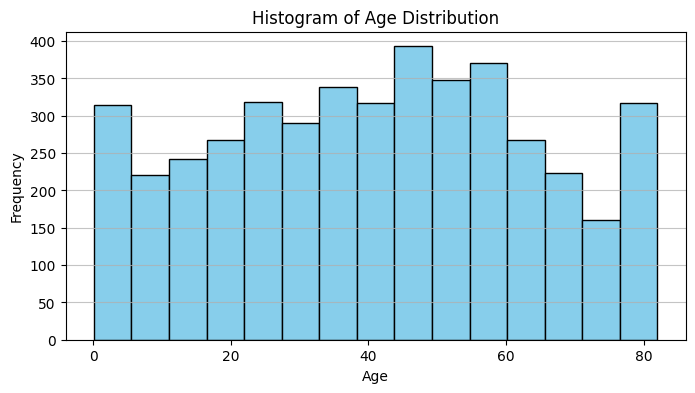

In [ ]:
#analysis of age distribution
print("Description of Age Distribution Data: ")
print(data['age'].describe())
print()
plt.figure(figsize=(8, 4))
plt.hist(data['age'], bins=15, color='skyblue', edgecolor='black')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Histogram of Age Distribution')
plt.grid(axis='y', alpha=0.75)
plt.show()

Using histogram a type of bar chart that represents the frequency distribution of a set of continuous data.It shows the distribution, spread, and central tendency of numerical data

# **Hypertension**

Description of Hypertension Data: 
count    4391.000000
mean        0.074243
std         0.262195
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: hypertension, dtype: float64



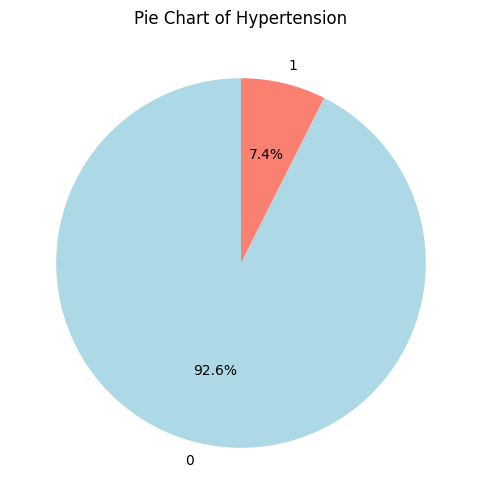

In [ ]:
#analysis of hypertension
print("Description of Hypertension Data: ")
print(data['hypertension'].describe())
print()
plt.figure(figsize=(6, 6))
data['hypertension'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'salmon'])
plt.title('Pie Chart of Hypertension')
plt.ylabel('')  # Hides the y-label
plt.show()

Using pie chart that shows the frequency of a binary data

# **Heart Disease**

Description of Heart Disease Data: 
count    4391.000000
mean        0.039171
std         0.194024
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: heart_disease, dtype: float64



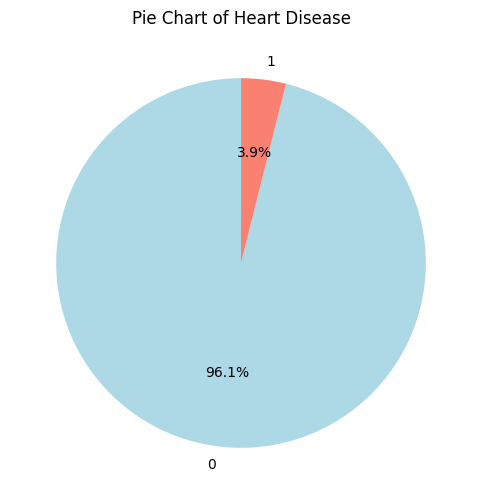

In [ ]:
#analysis of heart disease
print("Description of Heart Disease Data: ")
print(data['heart_disease'].describe())
print()
plt.figure(figsize=(6, 6))
data['heart_disease'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'salmon'])
plt.title('Pie Chart of Heart Disease')
plt.ylabel('')  # Hides the y-label
plt.show()

# **Average Glucose Level**

Description of Glucose Level Data: 
count    4391.000000
mean        0.320157
std         0.199564
min         0.000000
25%         0.175722
50%         0.289891
75%         0.430609
max         1.000000
Name: avg_glucose_level, dtype: float64



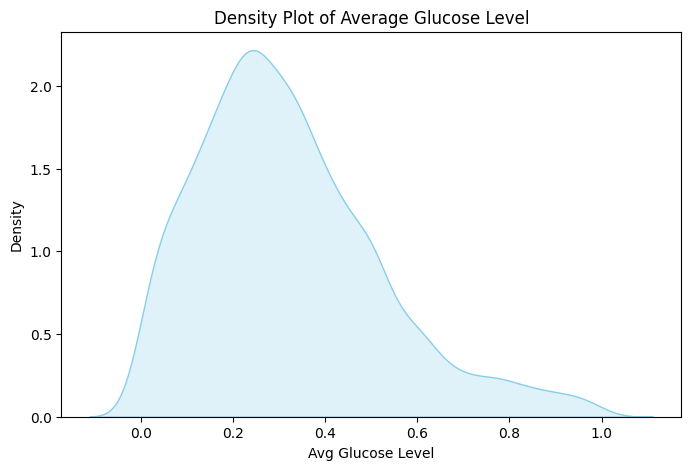

In [ ]:
#analysis of glucose level
print("Description of Glucose Level Data: ")
print(data['avg_glucose_level'].describe())
print()
plt.figure(figsize=(8, 5))
sns.kdeplot(data['avg_glucose_level'], fill=True, color='skyblue')  # Updated with fill=True
plt.title('Density Plot of Average Glucose Level')
plt.xlabel('Avg Glucose Level')
plt.ylabel('Density')
plt.show()

A density plot is used to visualize the distribution of a continuous numerical variable with a smoothed, continuous curve

# **BMI**

Description of BMI Data: 
count    4391.000000
mean        0.473106
std         0.188030
min         0.000000
25%         0.340974
50%         0.467049
75%         0.590258
max         1.000000
Name: bmi, dtype: float64



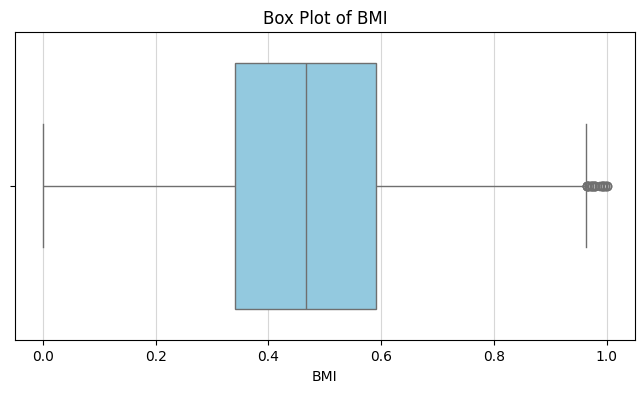

In [ ]:
#analysis of bmi
print("Description of BMI Data: ")
print(data['bmi'].describe())
print()
plt.figure(figsize=(8, 4))
sns.boxplot(x=data['bmi'], color='skyblue')
plt.title('Box Plot of BMI')
plt.xlabel('BMI')
plt.grid(axis='x', alpha=0.5)
plt.show()

A box plot (or box-and-whisker plot) that summarizes the distribution of a dataset based on five key statistics. It's used for understanding data spread, central tendency, and detecting outliers.

# **Stroke Occurence**

Description of Stroke Occurence Data: 
count    4391.000000
mean        0.037577
std         0.190192
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: stroke, dtype: float64



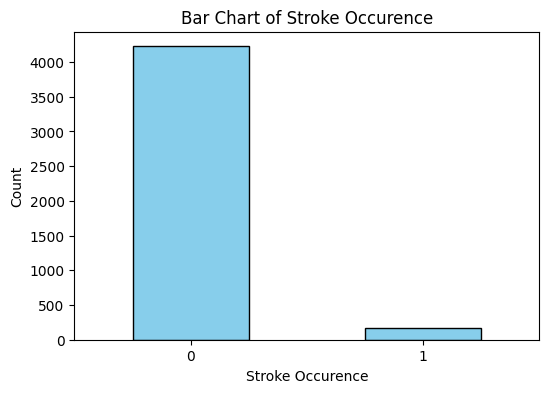

In [ ]:
#analysis of stroke occurence
print("Description of Stroke Occurence Data: ")
print(data['stroke'].describe())
print()
plt.figure(figsize=(6, 4))
data['stroke'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Stroke Occurence')
plt.ylabel('Count')
plt.title('Bar Chart of Stroke Occurence')
plt.xticks(rotation=0)
plt.show()

Using bar chart that shows the frequency of a binary data

# **Female Gender**

Description of Female Gender Data: 
count    4391.000000
mean        0.589843
std         0.491918
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Gender_Female, dtype: float64



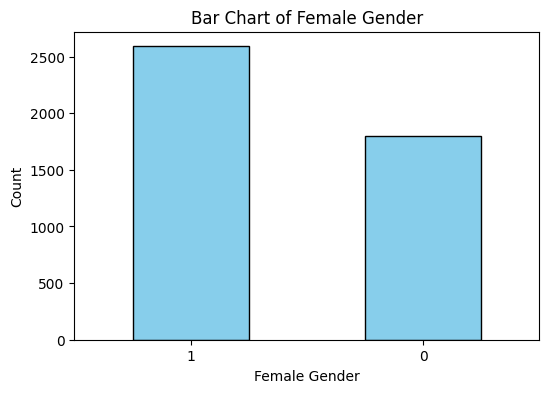

In [ ]:
#analysis of female gender
print("Description of Female Gender Data: ")
print(data['Gender_Female'].describe())
print()
plt.figure(figsize=(6, 4))
data['Gender_Female'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Female Gender')
plt.ylabel('Count')
plt.title('Bar Chart of Female Gender')
plt.xticks(rotation=0)
plt.show()


# **Male Gender**

Description of Male Gender Data: 
count    4391.000000
mean        0.409929
std         0.491876
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: Gender_Male, dtype: float64



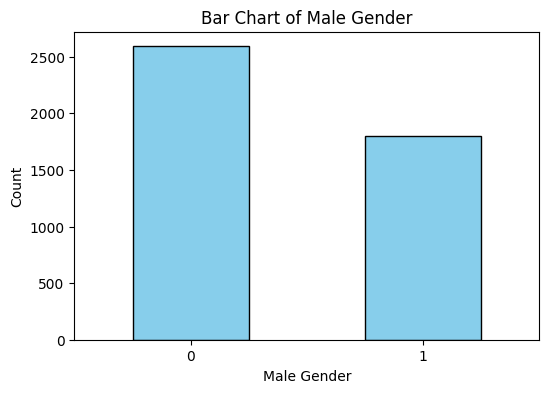

In [ ]:
#analysis of female gender
print("Description of Male Gender Data: ")
print(data['Gender_Male'].describe())
print()
plt.figure(figsize=(6, 4))
data['Gender_Male'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Male Gender')
plt.ylabel('Count')
plt.title('Bar Chart of Male Gender')
plt.xticks(rotation=0)
plt.show()

# Married

Description of Never Married Data: 
count    4391.000000
mean        0.622865
std         0.484724
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Ever_Married, dtype: float64



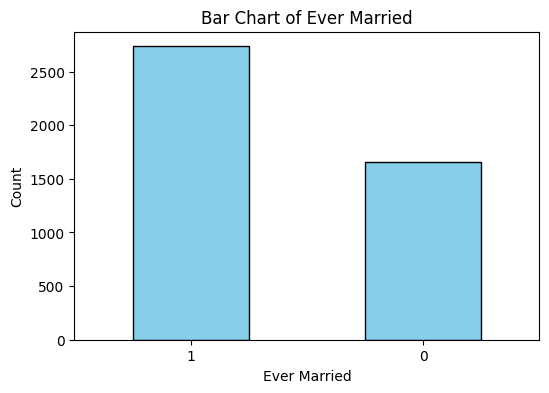

In [ ]:
#analysis of never married
print("Description of Never Married Data: ")
print(data['Ever_Married'].describe())
print()
plt.figure(figsize=(6, 4))
data['Ever_Married'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Ever Married')
plt.ylabel('Count')
plt.title('Bar Chart of Ever Married')
plt.xticks(rotation=0)
plt.show()

# **Govt Job**

Description of Govt Job Work Type Data: 
count    4391.000000
mean        0.125712
std         0.331562
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Work_Govt_job, dtype: float64



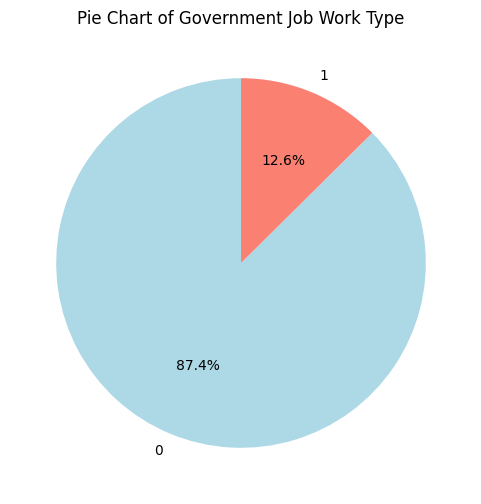

In [ ]:
#Analysis of govt job work type
print("Description of Govt Job Work Type Data: ")
print(data['Work_Govt_job'].describe())
print()
plt.figure(figsize=(6, 6))
data['Work_Govt_job'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'salmon'])
plt.title('Pie Chart of Government Job Work Type')
plt.ylabel('')  # Hides the y-label
plt.show()

# **Never Worked**

Description of Never Worked Work Type Data: 
count    4391.000000
mean        0.005010
std         0.070614
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Work_Never_worked, dtype: float64



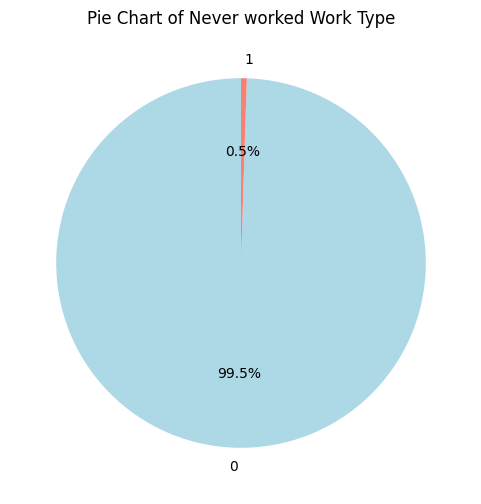

In [ ]:
#Analysis of never worked work type
print("Description of Never Worked Work Type Data: ")
print(data['Work_Never_worked'].describe())
print()
plt.figure(figsize=(6, 6))
data['Work_Never_worked'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'salmon'])
plt.title('Pie Chart of Never worked Work Type')
plt.ylabel('')  # Hides the y-label
plt.show()

# **Private Worker**

Description of Private Work Type Data: 
count    4391.000000
mean        0.565247
std         0.495781
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Work_Private, dtype: float64



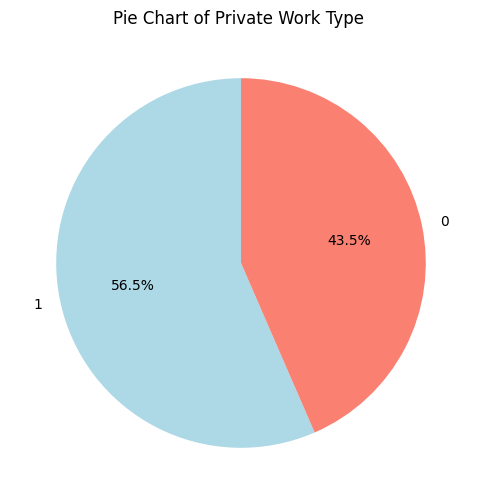

In [ ]:
#Analysis of private work type
print("Description of Private Work Type Data: ")
print(data['Work_Private'].describe())
print()
plt.figure(figsize=(6, 6))
data['Work_Private'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'salmon'])
plt.title('Pie Chart of Private Work Type ')
plt.ylabel('')  # Hides the y-label
plt.show()

# **Self Employed Worker**

Description of Self Employed Work Type Data: 
count    4391.000000
mean        0.150535
std         0.357636
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Work_Self-employed, dtype: float64



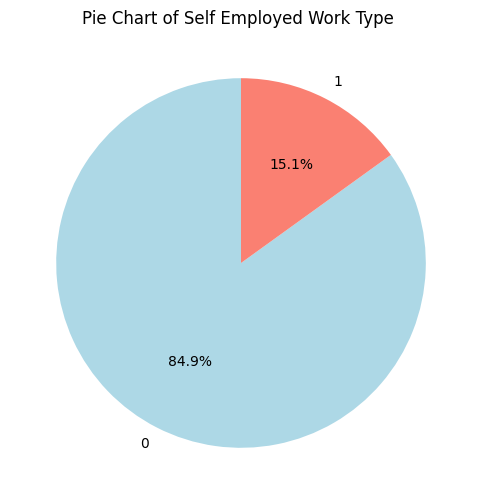

In [ ]:
#Analysis of self employed work type
print("Description of Self Employed Work Type Data: ")
print(data['Work_Self-employed'].describe())
print()
plt.figure(figsize=(6, 6))
data['Work_Self-employed'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'salmon'])
plt.title('Pie Chart of Self Employed Work Type ')
plt.ylabel('')  # Hides the y-label
plt.show()

# **children work type**

Description of Children Work Type Data: 
count    4391.000000
mean        0.153496
std         0.360506
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Work_children, dtype: float64



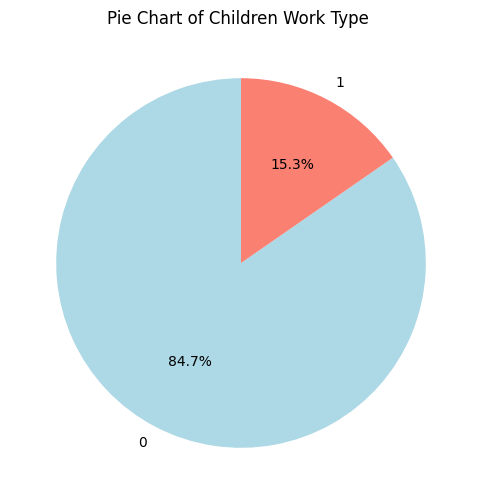

In [ ]:
#Analysis of children work type
print("Description of Children Work Type Data: ")
print(data['Work_children'].describe())
print()
plt.figure(figsize=(6, 6))
data['Work_children'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'salmon'])
plt.title('Pie Chart of Children Work Type ')
plt.ylabel('')  # Hides the y-label
plt.show()

# **Rural Residence**

Description of Rural Residence Type Data: 
count    4391.000000
mean        0.492143
std         0.499995
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: Residence_Rural, dtype: float64



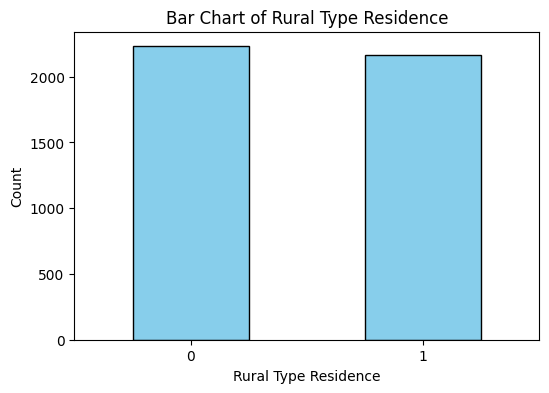

In [ ]:
#Analysis of rural type residence
print("Description of Rural Residence Type Data: ")
print(data['Residence_Rural'].describe())
print()
plt.figure(figsize=(6, 4))
data['Residence_Rural'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Rural Type Residence')
plt.ylabel('Count')
plt.title('Bar Chart of Rural Type Residence')
plt.xticks(rotation=0)
plt.show()


# **Urban Type Residence**

Description of Urban Residence Type Data: 
count    4391.000000
mean        0.507857
std         0.499995
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Residence_Urban, dtype: float64



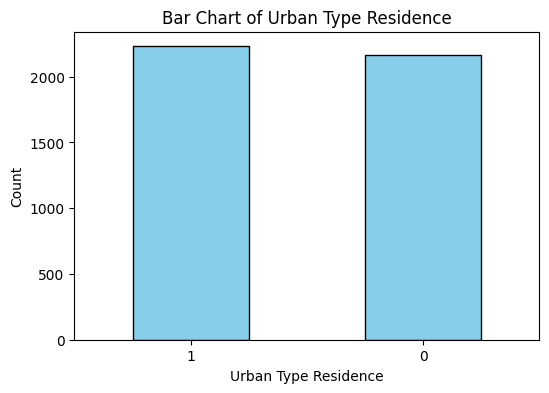

In [ ]:
print("Description of Urban Residence Type Data: ")
print(data['Residence_Urban'].describe())
print()
plt.figure(figsize=(6, 4))
data['Residence_Urban'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Urban Type Residence')
plt.ylabel('Count')
plt.title('Bar Chart of Urban Type Residence')
plt.xticks(rotation=0)
plt.show()

# **Unknown Smoking Status**

Description of Unknown Smoking Status Data: 
count    4391.000000
mean        0.322933
std         0.467651
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: Smoking_Unknown, dtype: float64



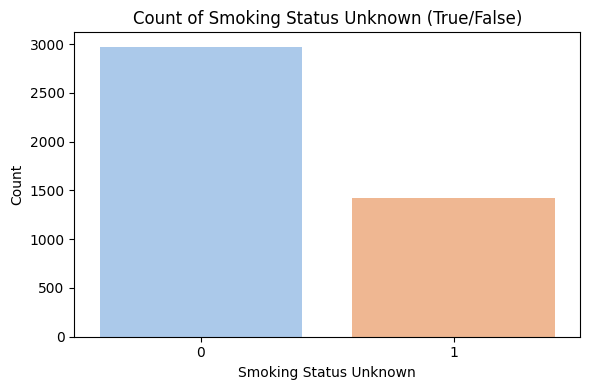

In [ ]:
print("Description of Unknown Smoking Status Data: ")
print(data['Smoking_Unknown'].describe())
print()
# Count plot for the 'smoking_status_Unknown' variable
plt.figure(figsize=(6, 4))
sns.countplot(x='Smoking_Unknown',hue='Smoking_Unknown', data=data, palette='pastel', legend=False)  # Add legend=False

# Customizing the chart
plt.title('Count of Smoking Status Unknown (True/False)')  # Updated title
plt.xlabel('Smoking Status Unknown')  # Updated x-label
plt.ylabel('Count')
#plt.xticks([0, 1], ['False', 'True'])  # Updated tick labels

# Show the plot
plt.tight_layout()
plt.show()

# **Formerly Smoked Status**

Description of Formerly Smoking Status Data: 
count    4391.000000
mean        0.161239
std         0.367793
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Smoking_formerly smoked, dtype: float64



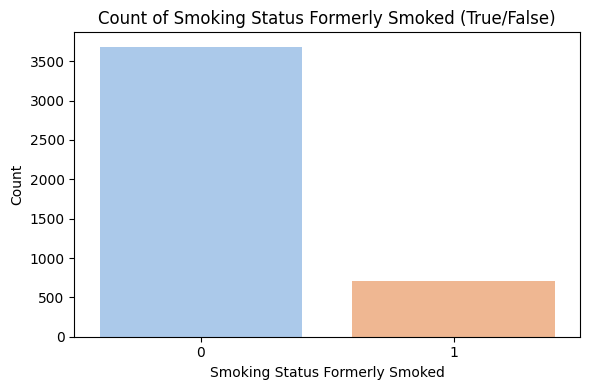

In [ ]:
print("Description of Formerly Smoking Status Data: ")
print(data['Smoking_formerly smoked'].describe())
print()
# Count plot for the 'smoking_status_Unknown' variable
plt.figure(figsize=(6, 4))
sns.countplot(x='Smoking_formerly smoked',hue='Smoking_formerly smoked', data=data, palette='pastel', legend=False)  # Add legend=False

# Customizing the chart
plt.title('Count of Smoking Status Formerly Smoked (True/False)')  # Updated title
plt.xlabel('Smoking Status Formerly Smoked')  # Updated x-label
plt.ylabel('Count')
#plt.xticks([0, 1], ['False', 'True'])  # Updated tick labels

# Show the plot
plt.tight_layout()
plt.show()

# **Never Smoked**

Description of Non-Smoker Smoking Status Data: 
count    4391.000000
mean        0.363243
std         0.480989
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: Smoking_never smoked, dtype: float64



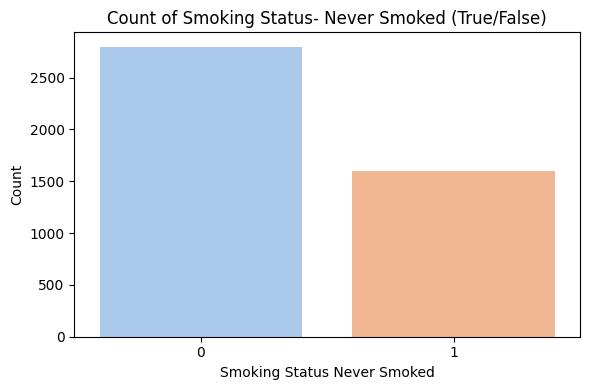

In [ ]:
print("Description of Non-Smoker Smoking Status Data: ")
print(data['Smoking_never smoked'].describe())
print()
# Count plot for the 'smoking_status_Unknown' variable
plt.figure(figsize=(6, 4))
sns.countplot(x='Smoking_never smoked',hue='Smoking_never smoked', data=data, palette='pastel', legend=False)  # Add legend=False

# Customizing the chart
plt.title('Count of Smoking Status- Never Smoked (True/False)')  # Updated title
plt.xlabel('Smoking Status Never Smoked')  # Updated x-label
plt.ylabel('Count')
#plt.xticks([0, 1], ['False', 'True'])  # Updated tick labels

# Show the plot
plt.tight_layout()
plt.show()

# **Smokes**

Description of Smoker Smoking Status Data: 
count    4391.000000
mean        0.152585
std         0.359628
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Smoking_smokes, dtype: float64



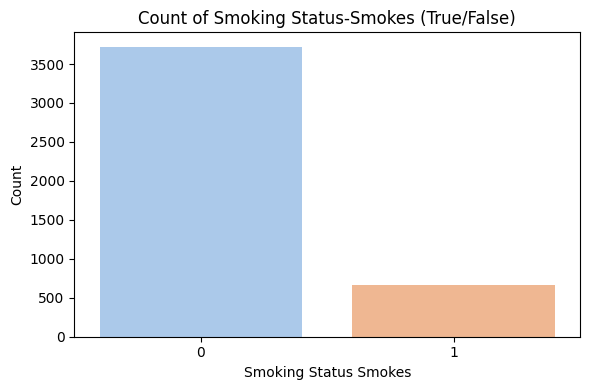

In [ ]:
print("Description of Smoker Smoking Status Data: ")
print(data['Smoking_smokes'].describe())
print()
# Count plot for the 'smoking_status_Unknown' variable
plt.figure(figsize=(6, 4))
sns.countplot(x='Smoking_smokes',hue='Smoking_smokes', data=data, palette='pastel', legend=False)  # Add legend=False

# Customizing the chart
plt.title('Count of Smoking Status-Smokes (True/False)')  # Updated title
plt.xlabel('Smoking Status Smokes')  # Updated x-label
plt.ylabel('Count')
#plt.xticks([0, 1], ['False', 'True'])  # Updated tick labels

# Show the plot
plt.tight_layout()
plt.show()

# **Bivariate Analysis**



# Age and Avg Glucose Level

Pearson Correlation: -0.02458727397139122



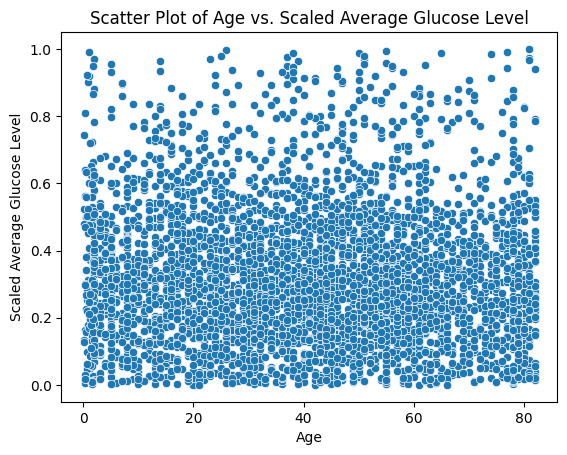

In [ ]:
correlation = data['age'].corr(data['avg_glucose_level'])
print(f'Pearson Correlation: {correlation}')
print()
sns.scatterplot(x='age', y='avg_glucose_level', data=data)
plt.title('Scatter Plot of Age vs. Scaled Average Glucose Level')
plt.xlabel('Age')
plt.ylabel('Scaled Average Glucose Level')
plt.show()

A scatter plot is used to display the relationship between two numerical variables by plotting individual data points on a two-dimensional axis. Each point on the scatter plot represents a pair of values, one for each variable, with one variable on the x-axis and the other on the y-axis

# Age and bmi

Pearson Correlation: 0.3766615714957607



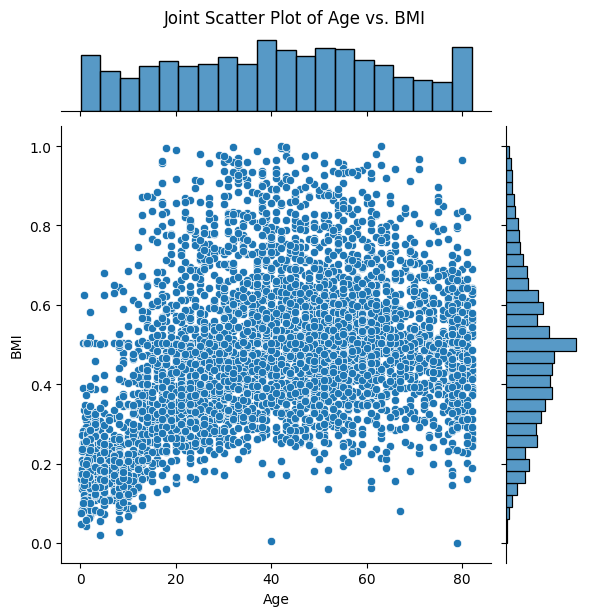

In [ ]:
correlation = data['age'].corr(data['bmi'])
print(f'Pearson Correlation: {correlation}')
print()
joint_plot = sns.jointplot(x='age', y='bmi', data=data, kind='scatter')

joint_plot.fig.suptitle('Joint Scatter Plot of Age vs. BMI', y=1.02)

joint_plot.set_axis_labels('Age', 'BMI')

plt.show()

A joint scatter plot is a type of visualization that combines a scatter plot with additional information about the marginal distributions of each variable. This is done by placing histograms or density plots along the x-axis and y-axis, which display the distribution of each variable independently. Joint scatter plots are used for understanding both the relationship between two variables and the individual distribution of each variable.

In [ ]:
# Initialize lists to hold variable types
binary_vars = []
continuous_vars = []
for col in data:
    unique_values = data[col].nunique()

    # Check if the column is numeric
    if pd.api.types.is_numeric_dtype(data[col]):
        if unique_values == 2:
            binary_vars.append(col)  # Binary variable
        elif unique_values > 2:
            continuous_vars.append(col)  # Continuous variable

# Average Glucose Level and BMI

Pearson Correlation: 0.0022547186795446473



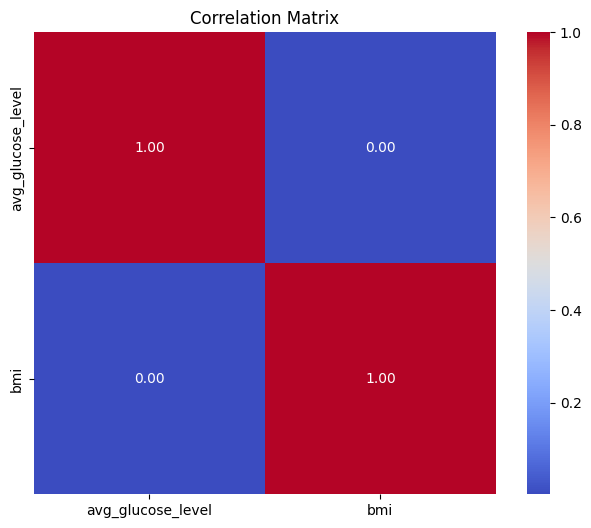

In [ ]:
correlation = data['avg_glucose_level'].corr(data['bmi'])
print(f'Pearson Correlation: {correlation}')
print()
correlation_matrix = data[['avg_glucose_level', 'bmi']].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix')
plt.show()


A correlation matrix is a table showing correlation coefficients between multiple variables. Each cell in the matrix represents the correlation between a pair of variables, with values ranging from -1 to 1. This matrix is used to understand the relationships and dependencies among variables, especially when working with many variables.

# Hypertension and All Variables

Pearson Correlation: 0.25213575332978516



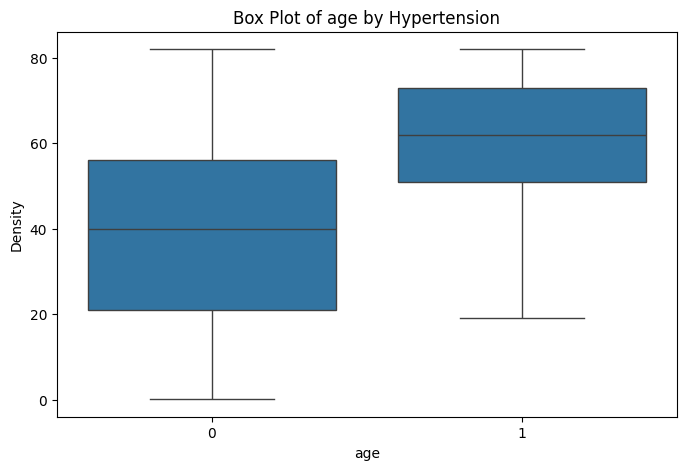

Pearson Correlation: 0.09058504199244409



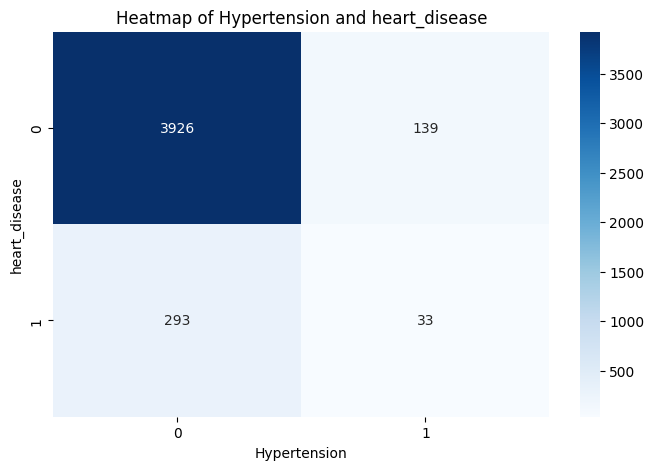

Pearson Correlation: 0.002209910643448232



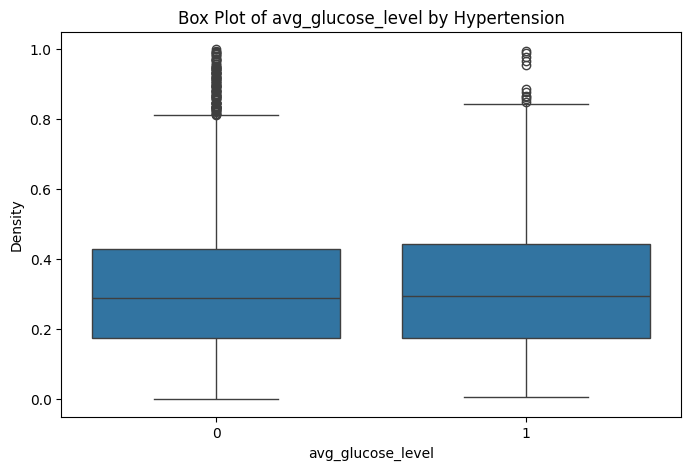

Pearson Correlation: 0.1500457088254005



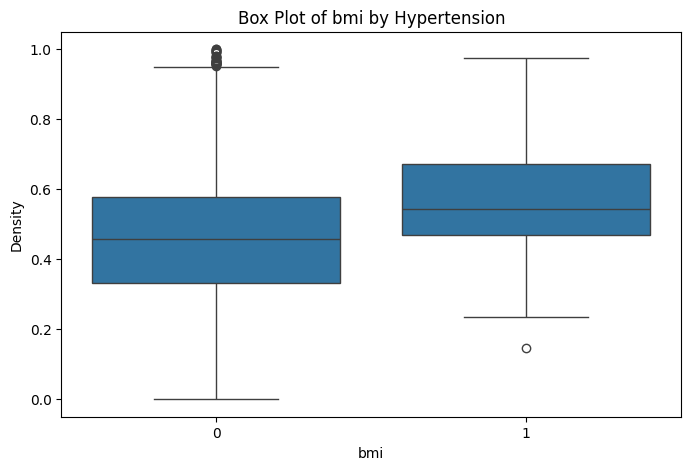

Pearson Correlation: 0.11305553978129108



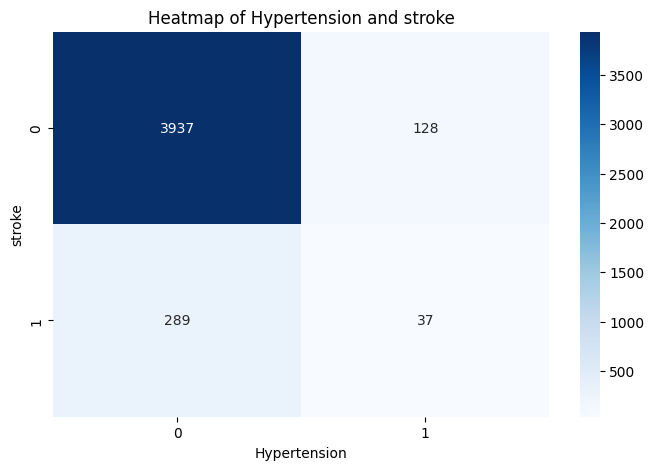

Pearson Correlation: 0.009663329083656741



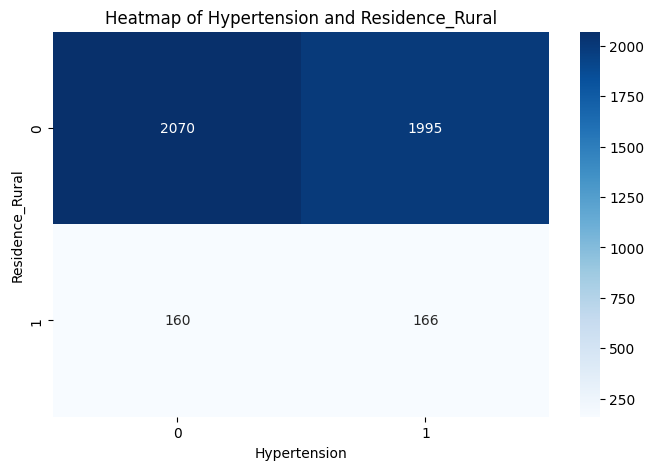

Pearson Correlation: -0.009663329083656741



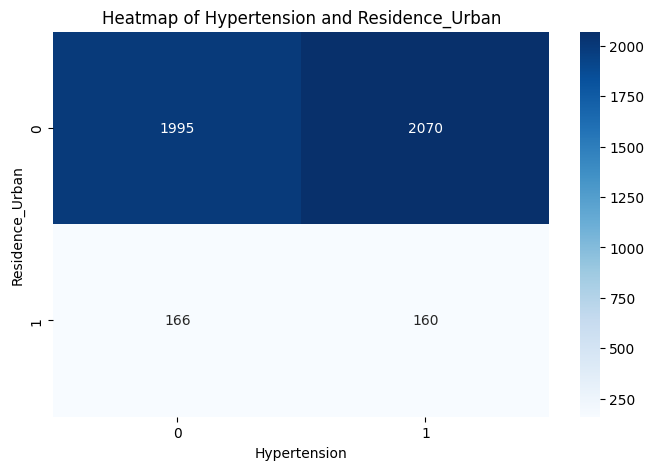

Pearson Correlation: 0.020070028671918434



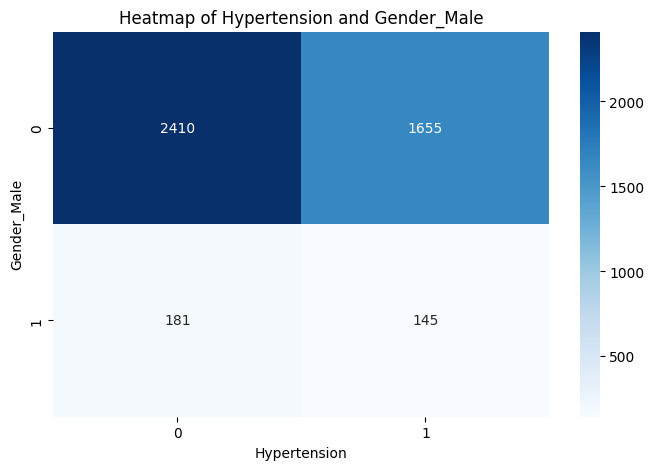

Pearson Correlation: -0.01993720819981809



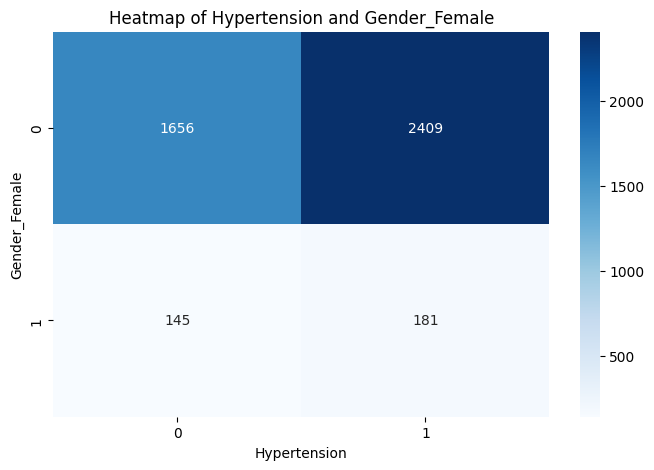

Pearson Correlation: 0.0012782447300337674



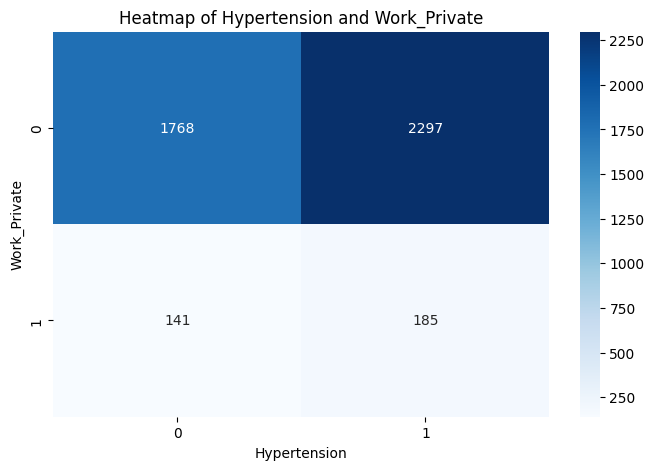

Pearson Correlation: 0.02362955709256888



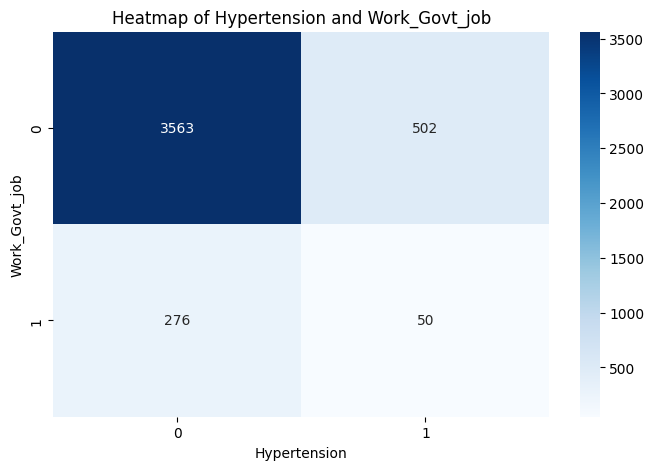

Pearson Correlation: 0.10184689016874014



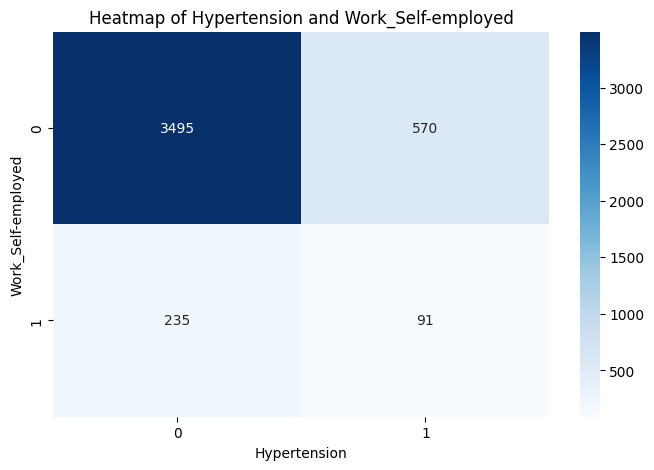

Pearson Correlation: -0.12059024924369635



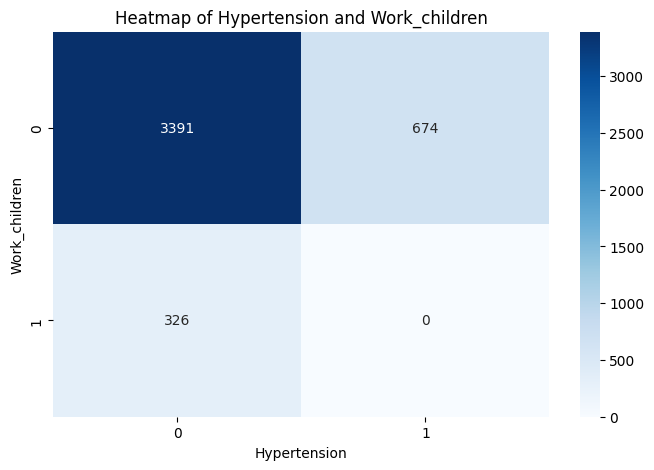

Pearson Correlation: -0.020095501235370246



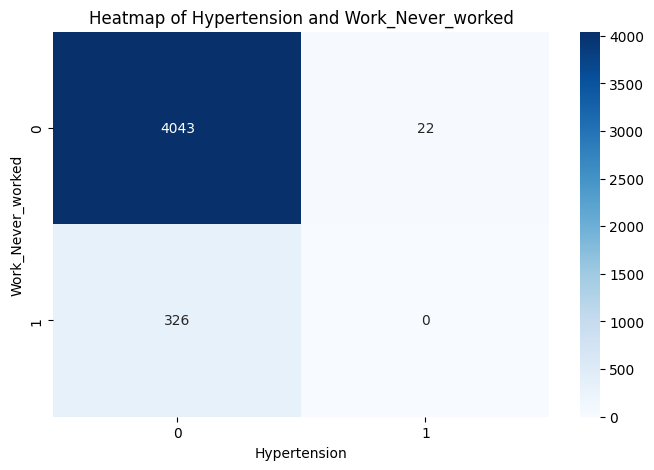

Pearson Correlation: 0.05523984325435023



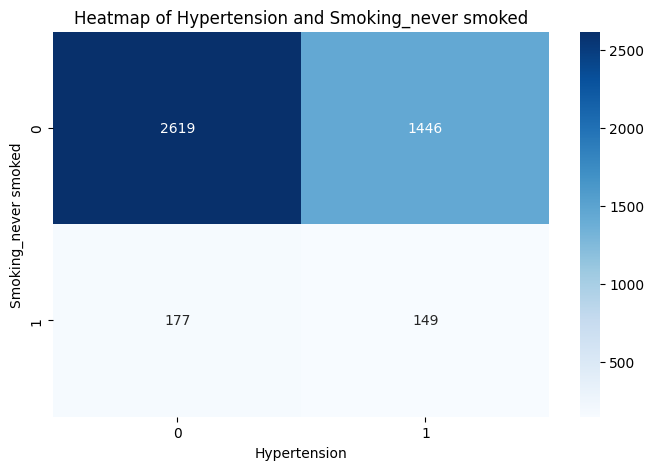

Pearson Correlation: -0.1324139116994939



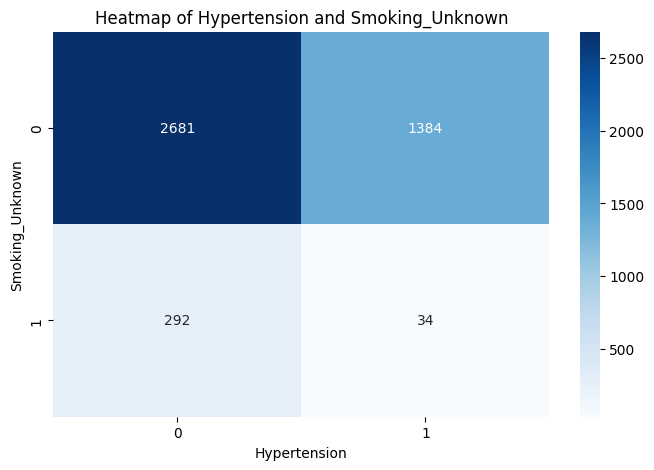

Pearson Correlation: 0.05135303762382945



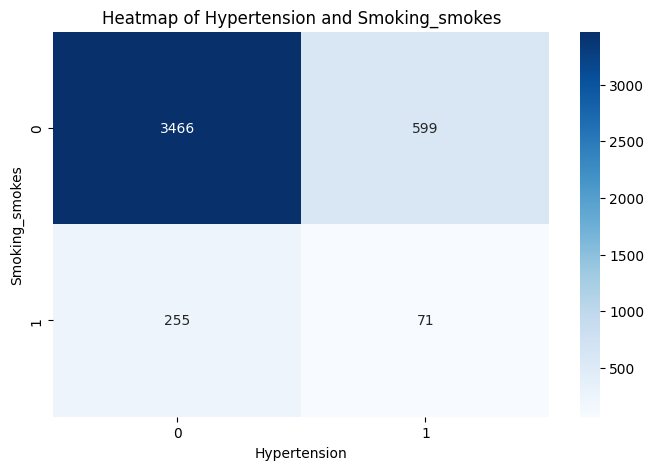

Pearson Correlation: 0.04591096600059239



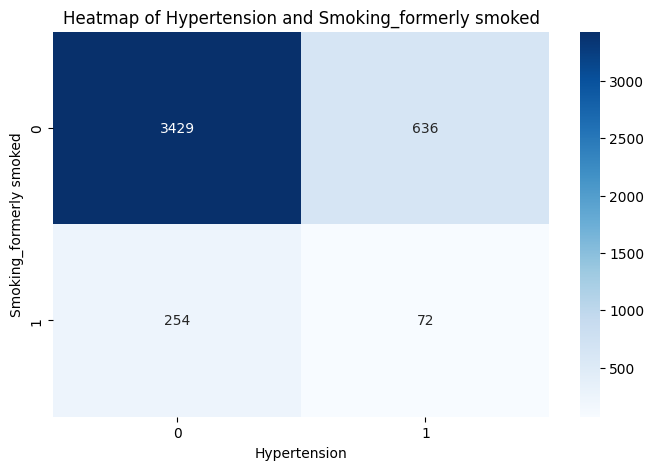

Pearson Correlation: 0.15045813417043313



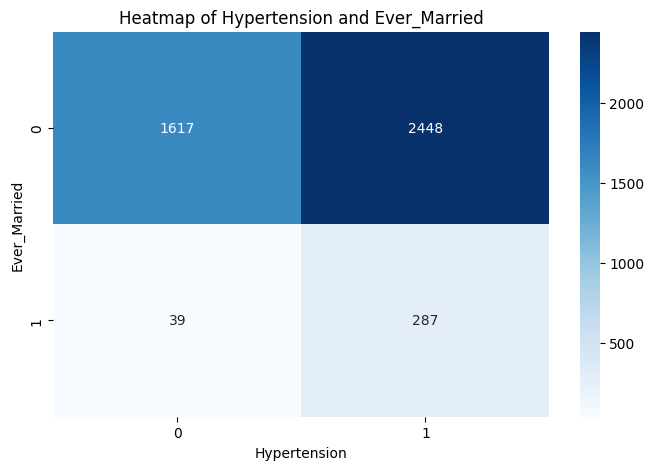

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'hypertension' and i!='id':

    correlation = data[i].corr(data['hypertension'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x='hypertension', y=i, data=data)
        plt.title(f'Box Plot of {i} by Hypertension')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
      contingency_table = pd.crosstab(data['hypertension'], data[i])
      # Plotting the heatmap
      plt.figure(figsize=(8, 5))
      sns.heatmap(contingency_table, annot=True, fmt='d', cmap='Blues')
      plt.title('Heatmap of Hypertension and '+ i)
      plt.xlabel('Hypertension')
      plt.ylabel(i)
      plt.show()



#Heart Disease And All Variables

Pearson Correlation: 0.23964712089928158



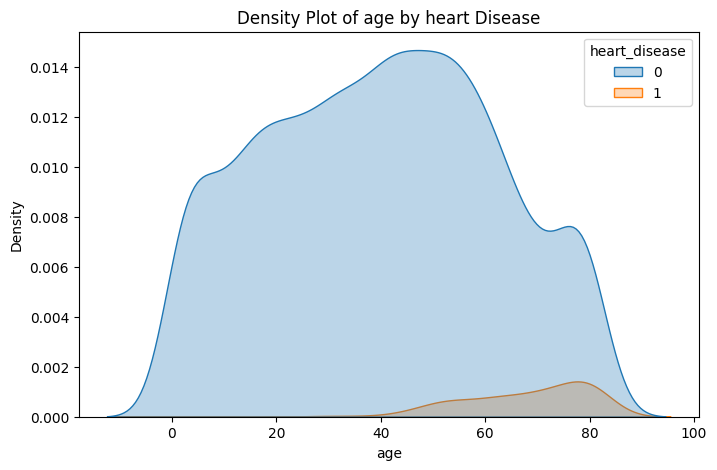

Pearson Correlation: 0.09058504199244409



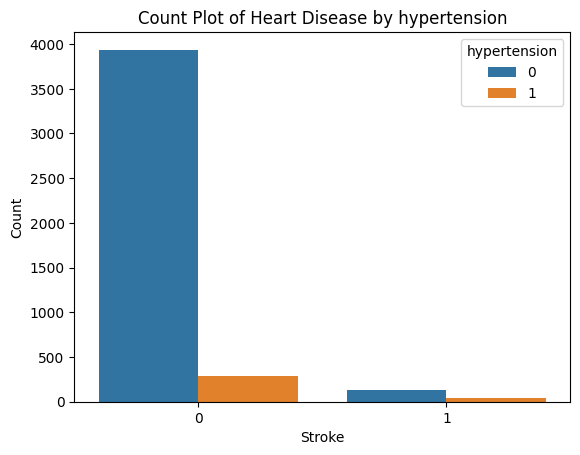

Pearson Correlation: -0.0006913657643524802



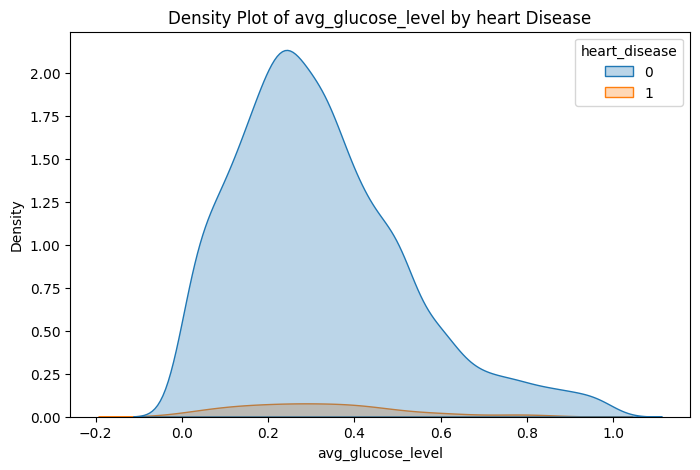

Pearson Correlation: 0.05569821135338494



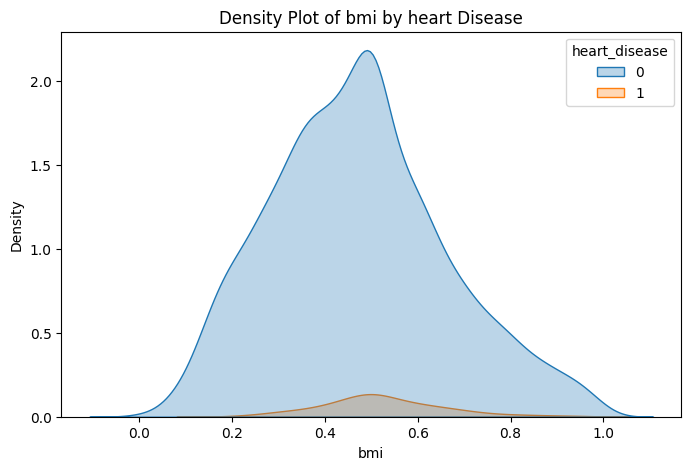

Pearson Correlation: 0.08973377608895022



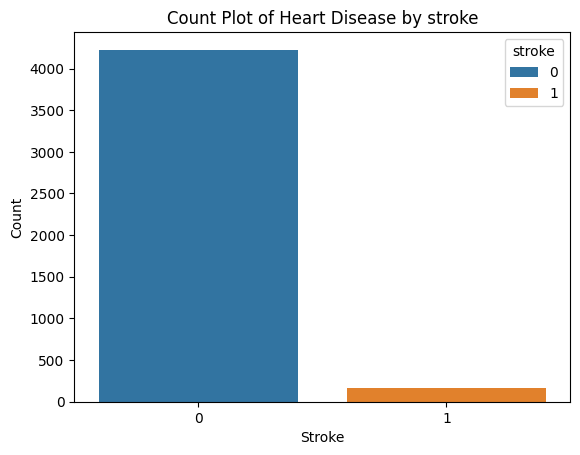

Pearson Correlation: 0.012565567236667461



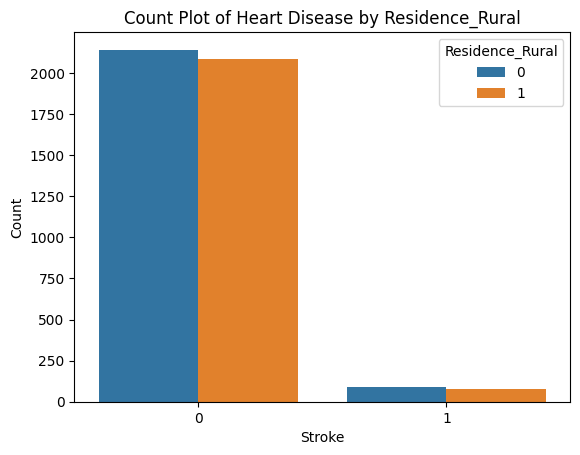

Pearson Correlation: -0.012565567236667461



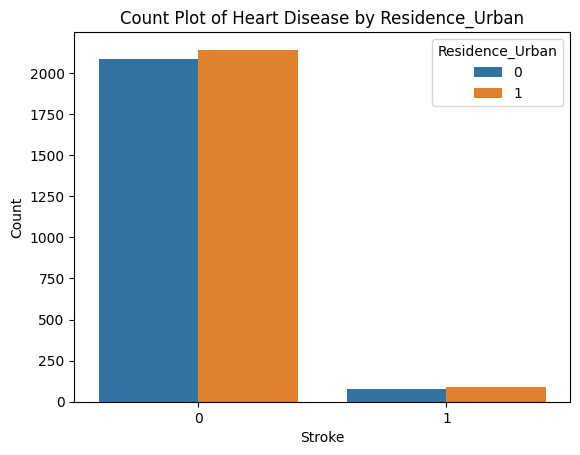

Pearson Correlation: 0.08948799072233124



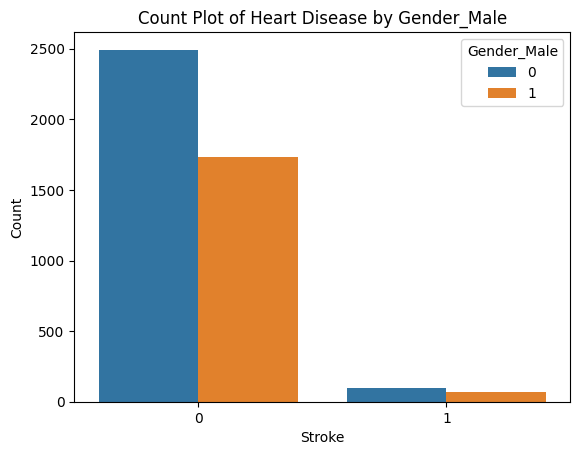

Pearson Correlation: -0.0893869251874367



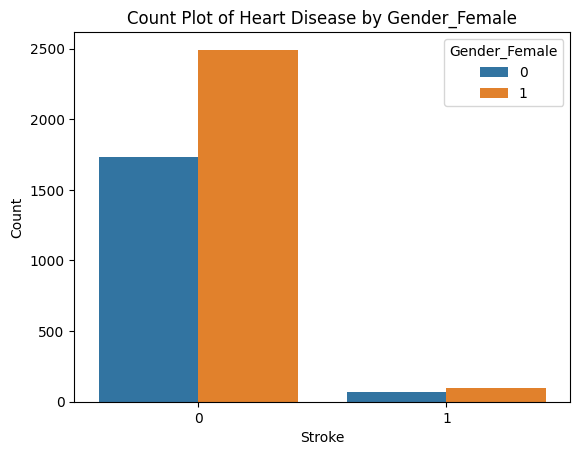

Pearson Correlation: -0.017103231846419747



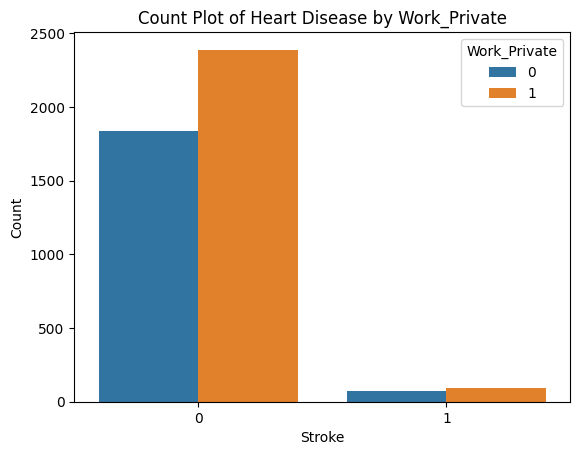

Pearson Correlation: 0.01195977071815925



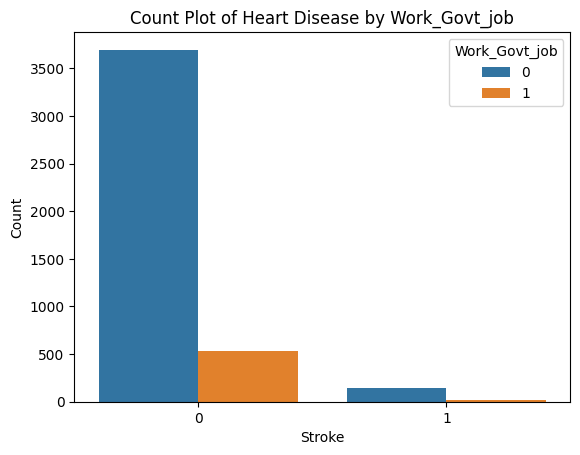

Pearson Correlation: 0.09883720684835941



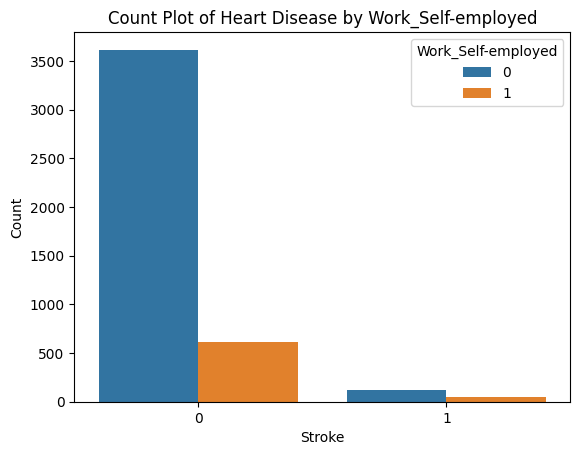

Pearson Correlation: -0.08272251774968509



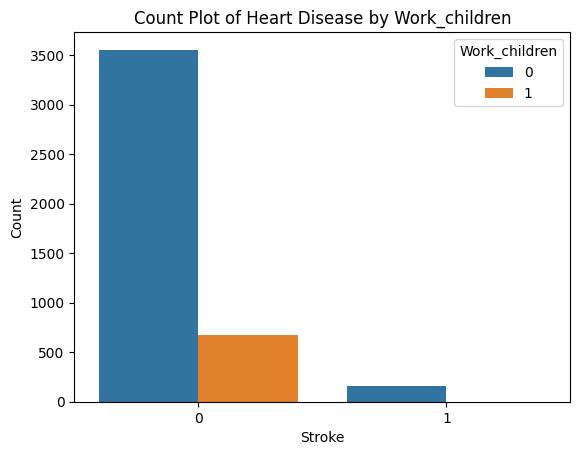

Pearson Correlation: -0.014327808848156418



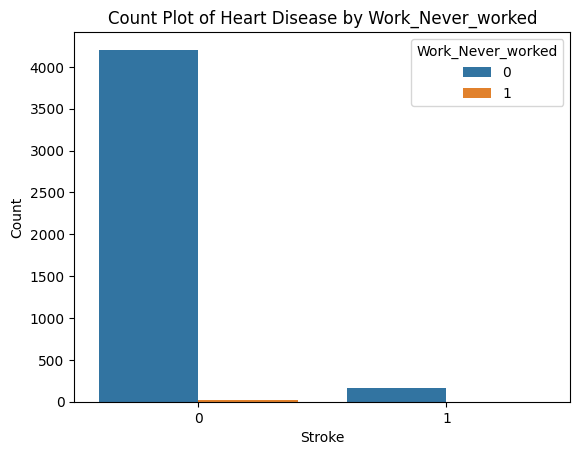

Pearson Correlation: -0.013370613590016582



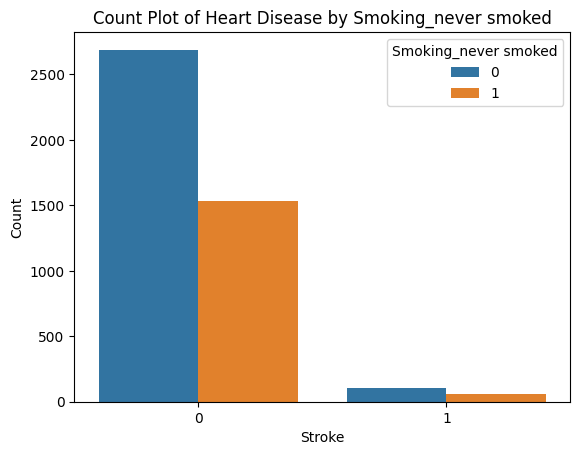

Pearson Correlation: -0.06412932613525626



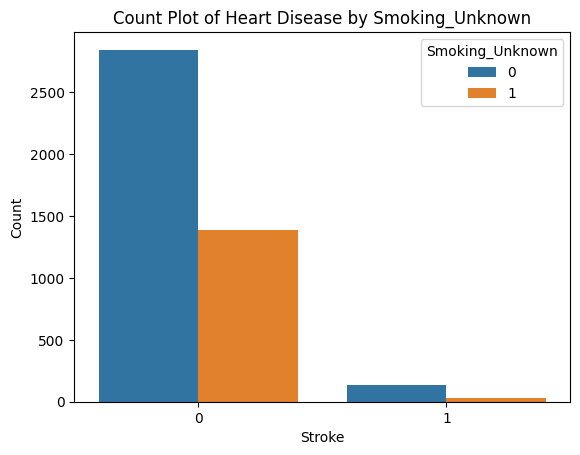

Pearson Correlation: 0.05143478046186325



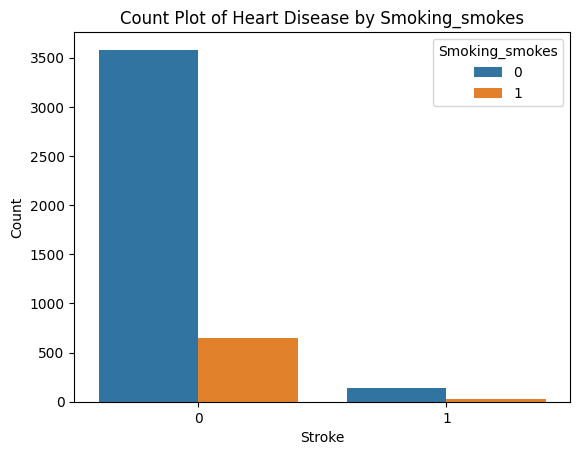

Pearson Correlation: 0.048733555340859616



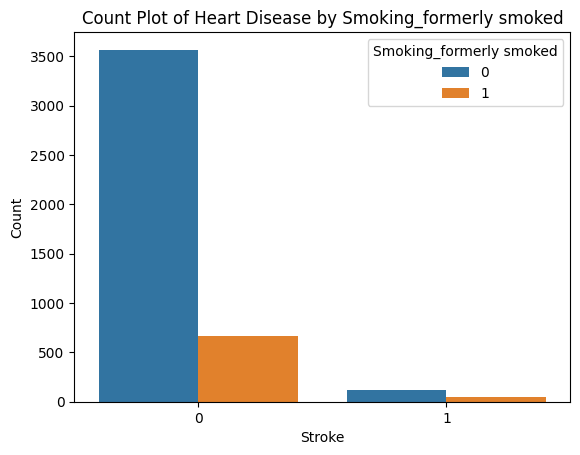

Pearson Correlation: 0.10624923590357181



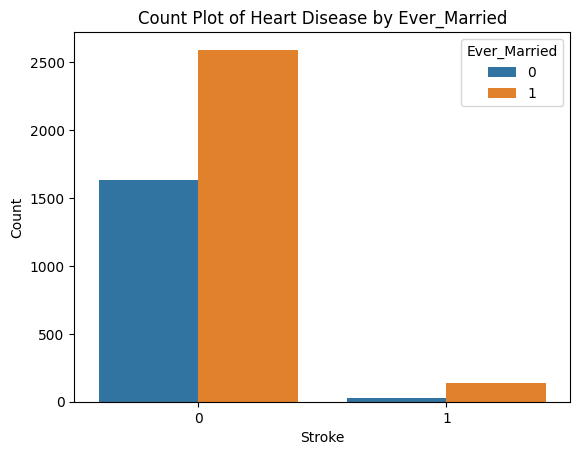

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'heart_disease' and i!='id':

    correlation = data[i].corr(data['heart_disease'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='heart_disease', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by heart Disease')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:#binary variable
       sns.countplot(x='stroke', hue=i, data=data)
       plt.title('Count Plot of Heart Disease by '+ i)
       plt.xlabel('Stroke')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()




#Stroke And All Variables

Pearson Correlation: 0.22697512179887844



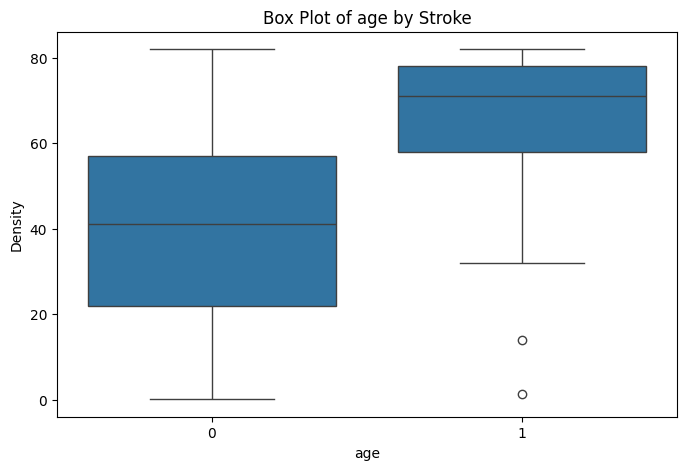

Pearson Correlation: 0.11305553978129108



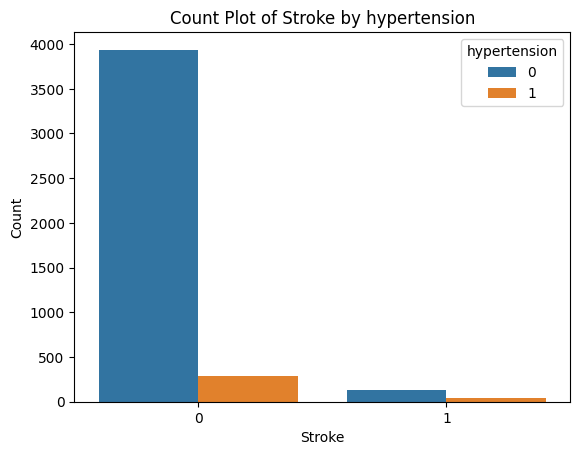

Pearson Correlation: 0.08973377608895024



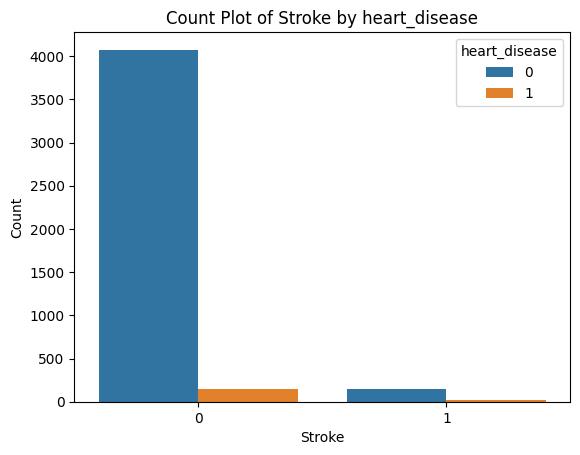

Pearson Correlation: 0.0028561659516999393



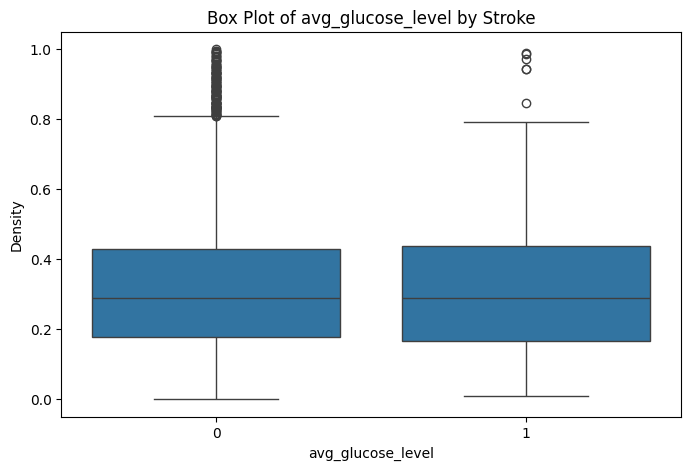

Pearson Correlation: 0.03415211514836908



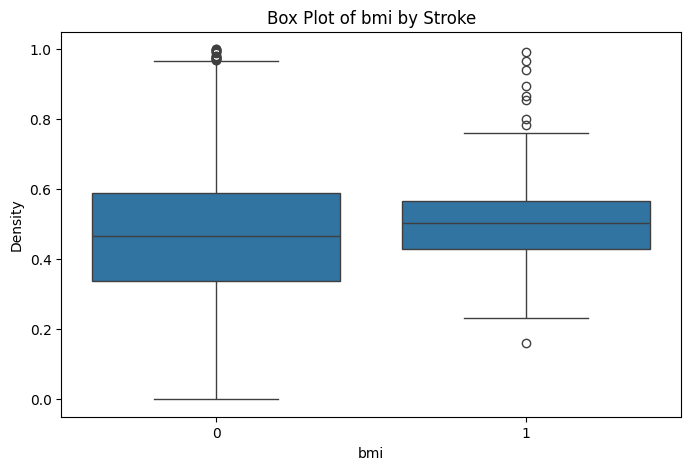

Pearson Correlation: -0.01006927282682943



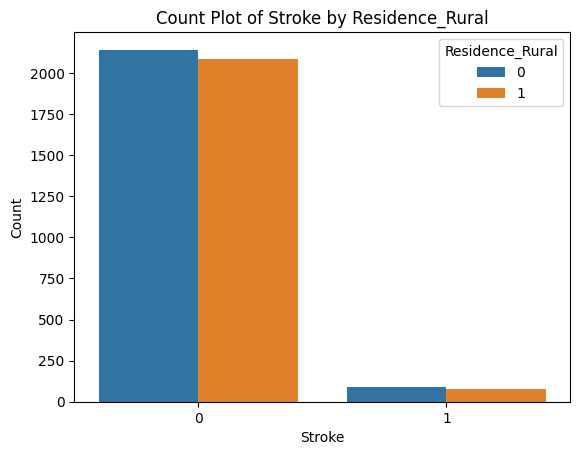

Pearson Correlation: 0.01006927282682943



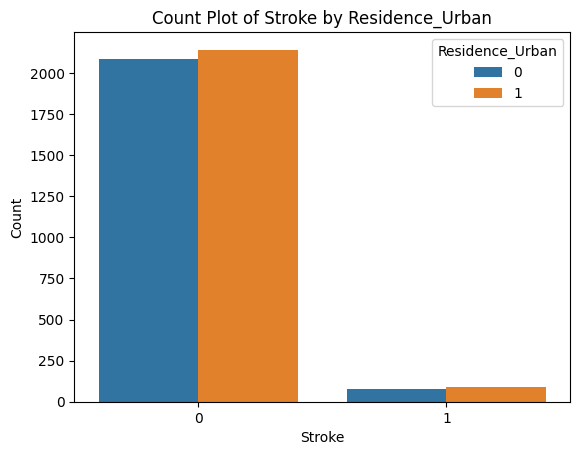

Pearson Correlation: -0.0015543414201269622



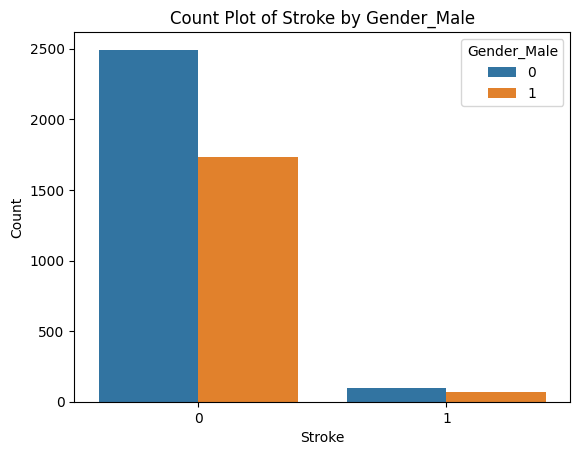

Pearson Correlation: 0.0016456991305393493



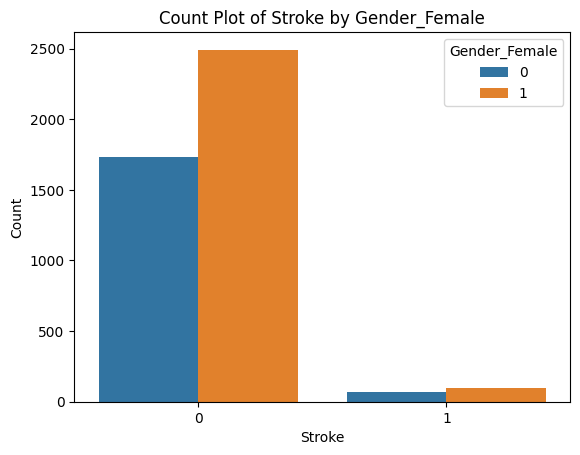

Pearson Correlation: -0.0006420373370947867



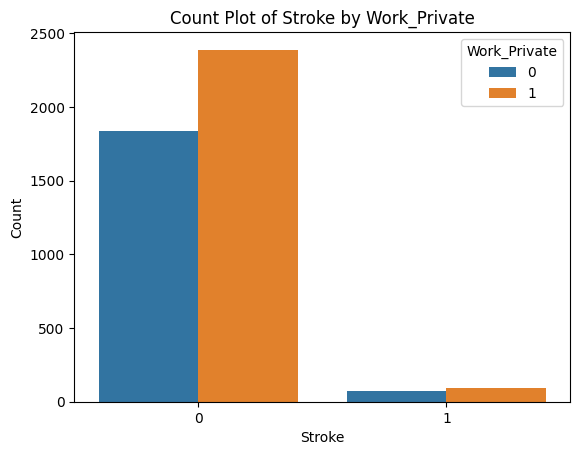

Pearson Correlation: 0.0009304162599973747



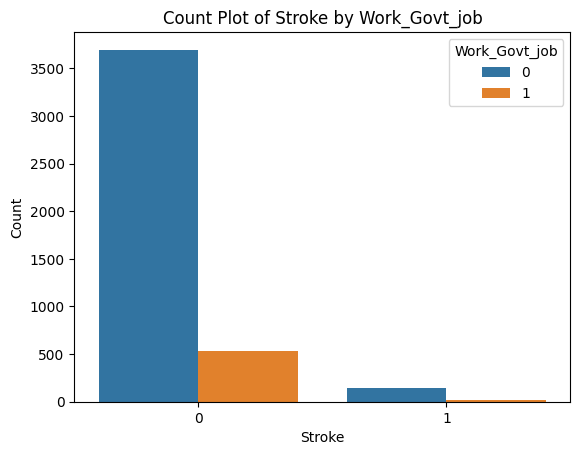

Pearson Correlation: 0.08091498529848544



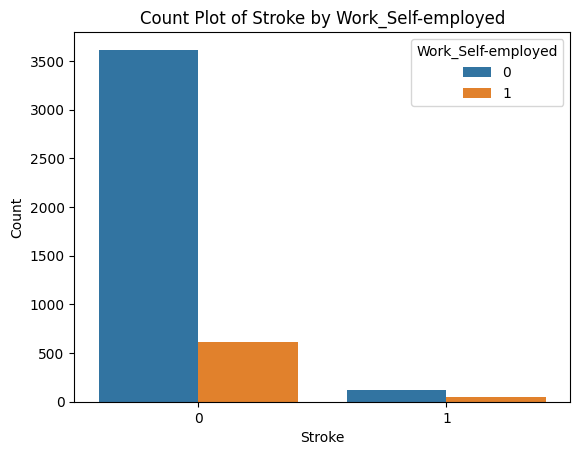

Pearson Correlation: -0.07749715252329376



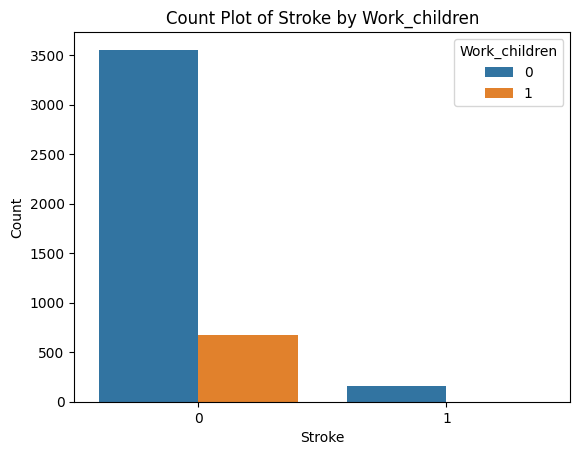

Pearson Correlation: -0.01402159903631002



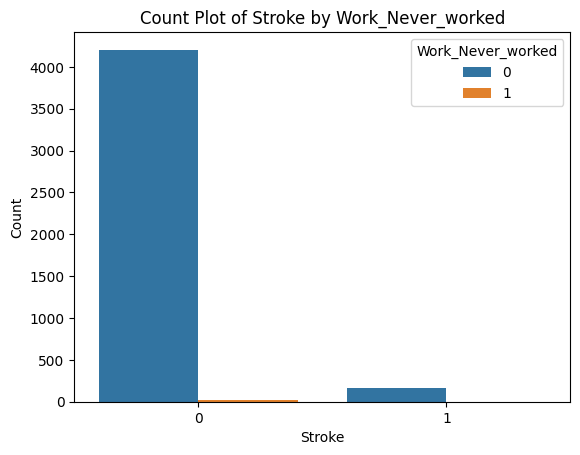

Pearson Correlation: -0.004818479021992111



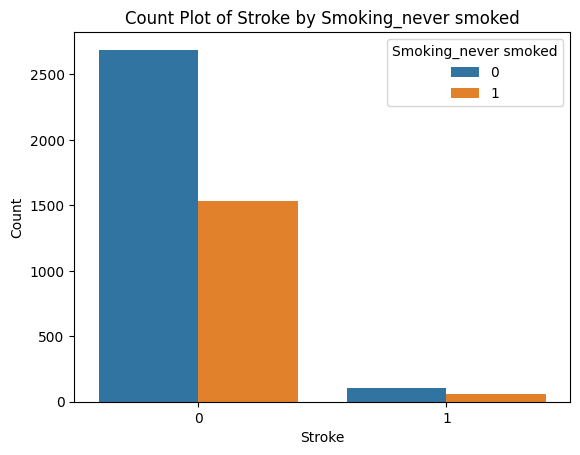

Pearson Correlation: -0.049387614067414



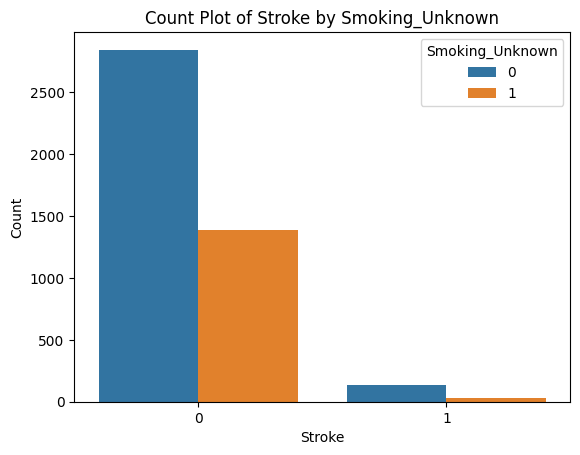

Pearson Correlation: 0.0027425494502516996



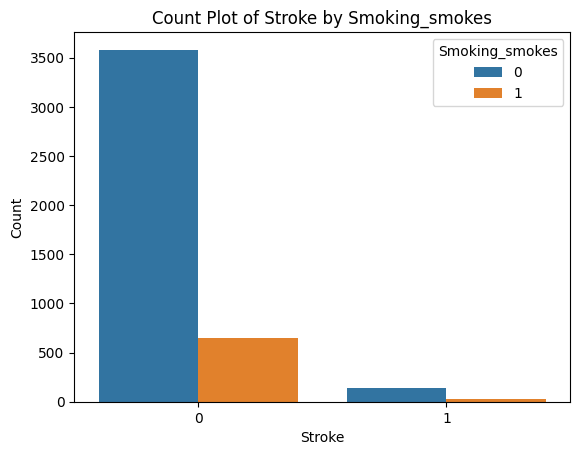

Pearson Correlation: 0.0664163998001853



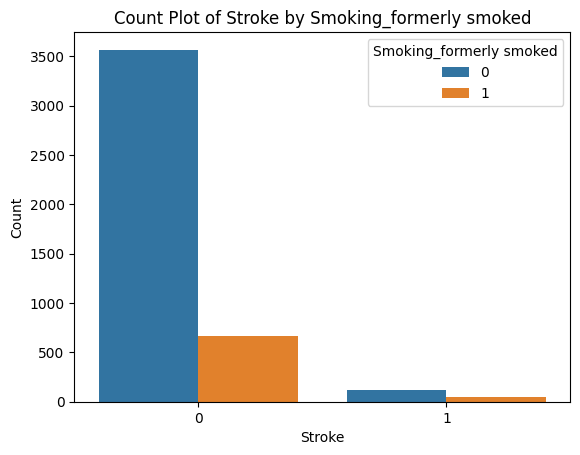

Pearson Correlation: 0.09445420992554553



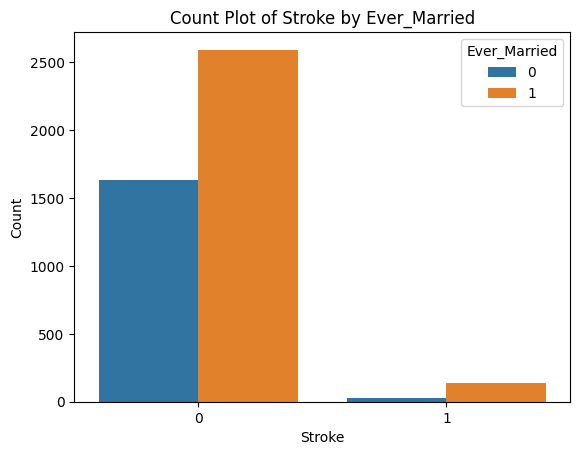

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'stroke' and i!='id':

    correlation = data[i].corr(data['stroke'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x='stroke', y=i, data=data)
        plt.title(f'Box Plot of {i} by Stroke')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='stroke', hue=i, data=data)
       plt.title('Count Plot of Stroke by '+ i)
       plt.xlabel('Stroke')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()



# Rural Residence and All variables

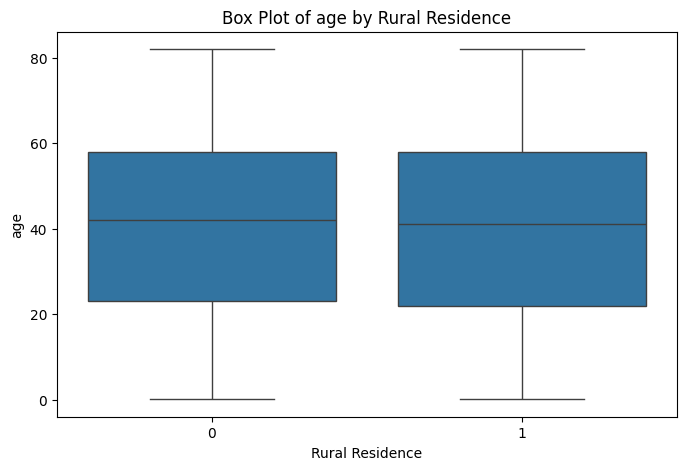

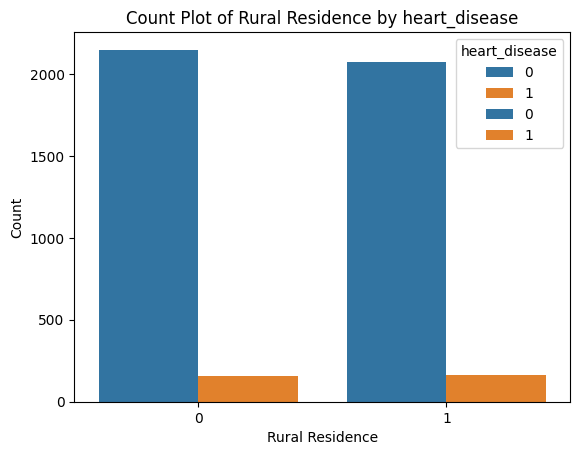

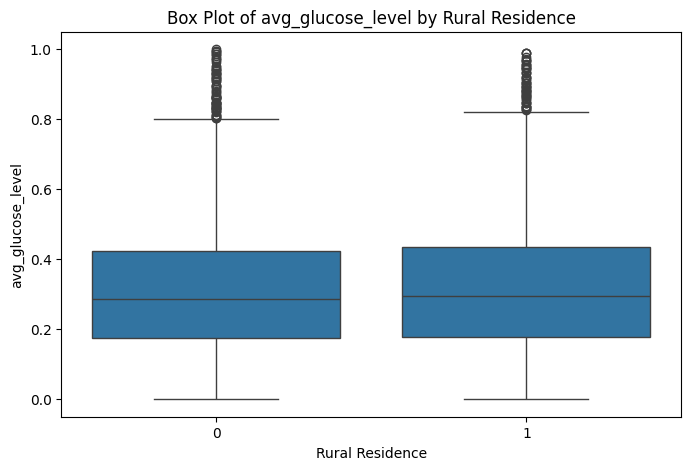

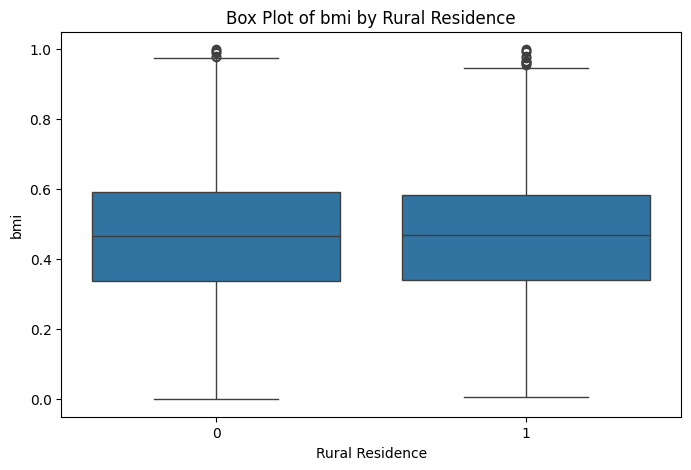

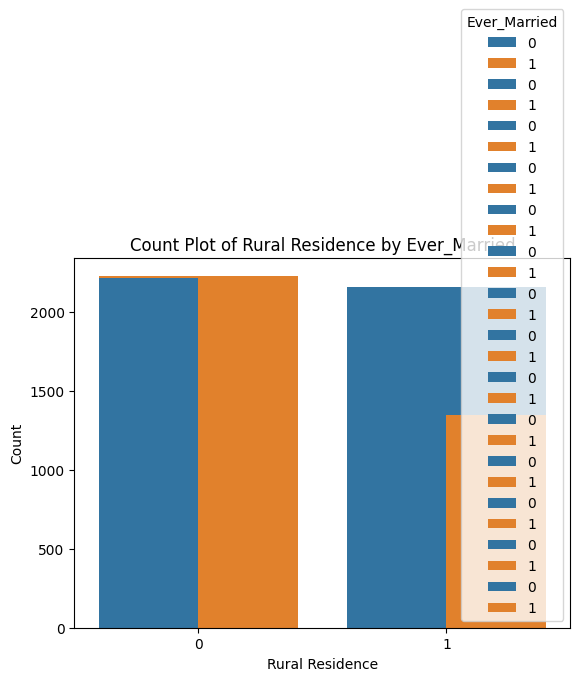

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Residence_Rural' and i!='id':

    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x='Residence_Rural', y=i, data=data)
        plt.title("Box Plot of "+i+" by Rural Residence")
        plt.xlabel("Rural Residence")
        plt.ylabel(i)
        plt.show()
    else:
       sns.countplot(x='Residence_Rural', hue=i, data=data)
       plt.title('Count Plot of Rural Residence by '+ i)
       plt.xlabel('Rural Residence')
       plt.ylabel('Count')
       plt.legend(title=i)



# Urban Residence and All Variables

Pearson Correlation: 0.011149661220754909



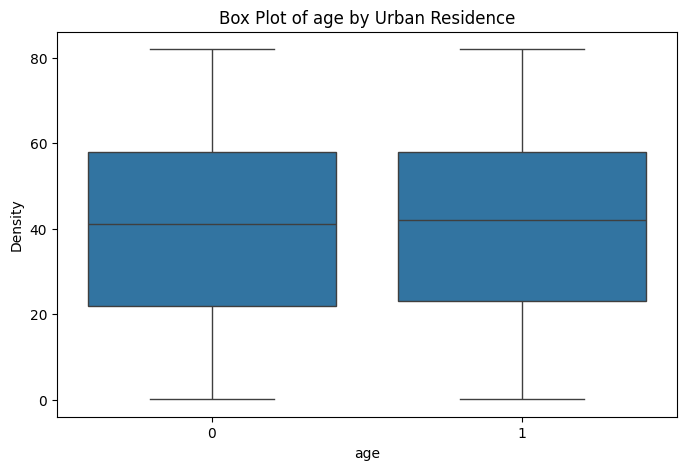

Pearson Correlation: -0.009663329083656741



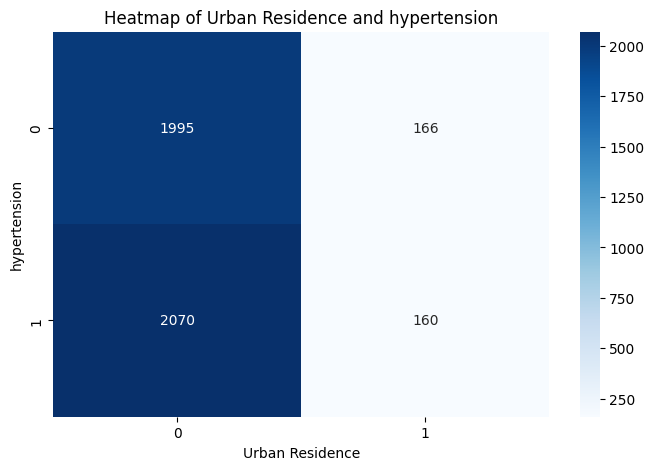

Pearson Correlation: -0.012565567236667461



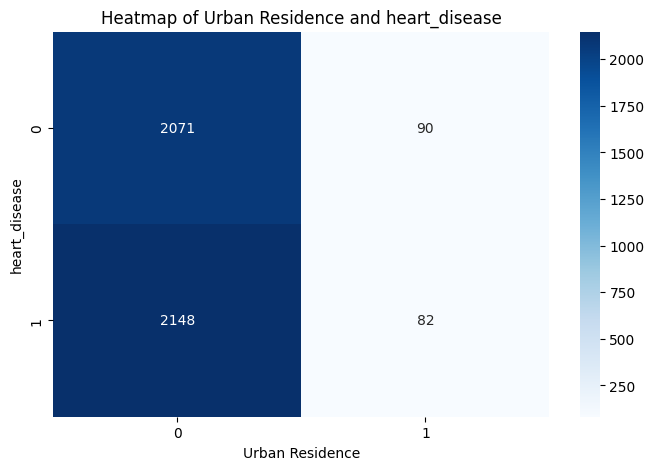

Pearson Correlation: -0.013237060198543711



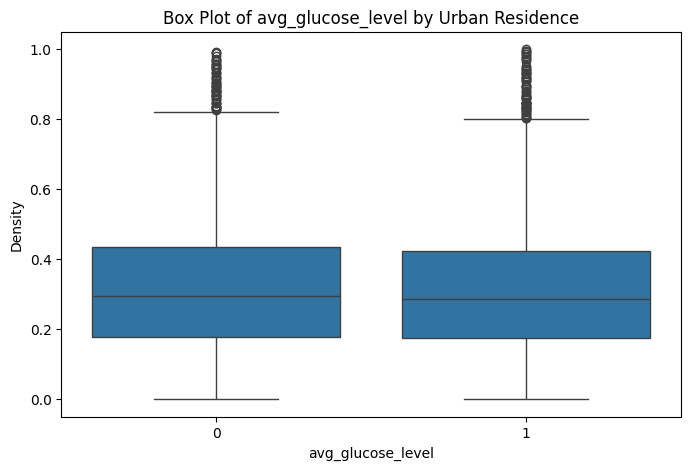

Pearson Correlation: 0.011357024992103702



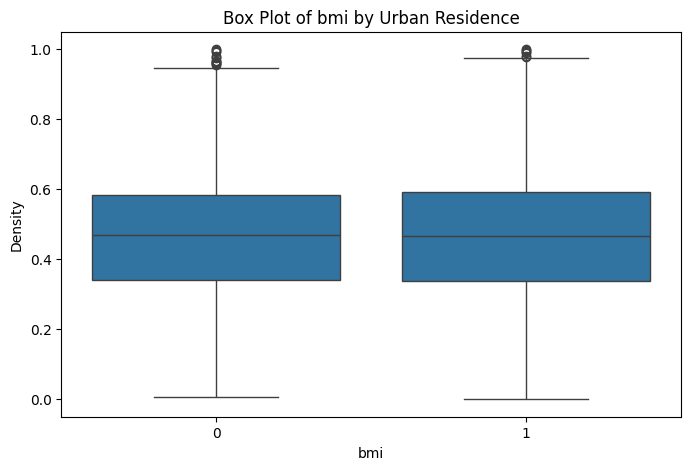

Pearson Correlation: 0.01006927282682943



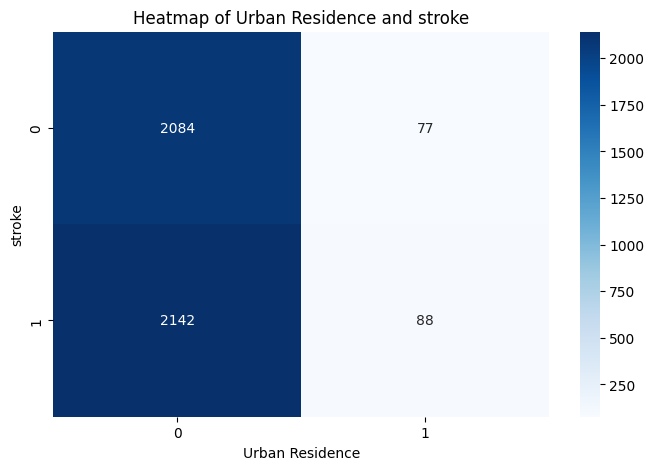

Pearson Correlation: -1.0



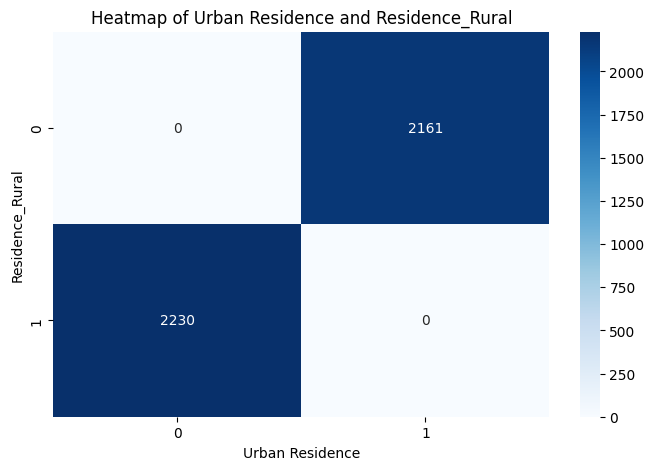

Pearson Correlation: -0.0038369215975603333



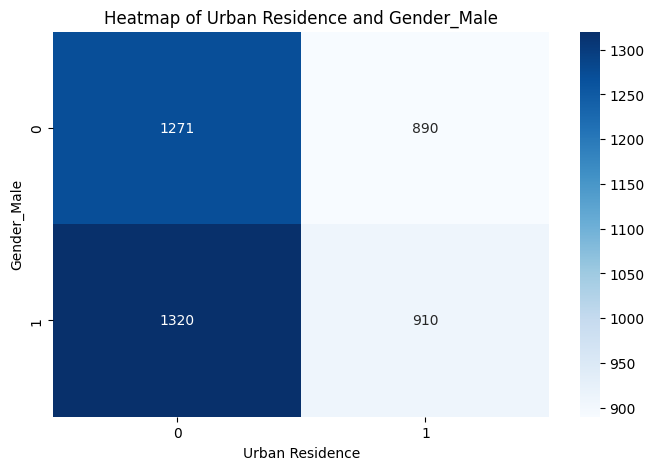

Pearson Correlation: 0.004306943596816924



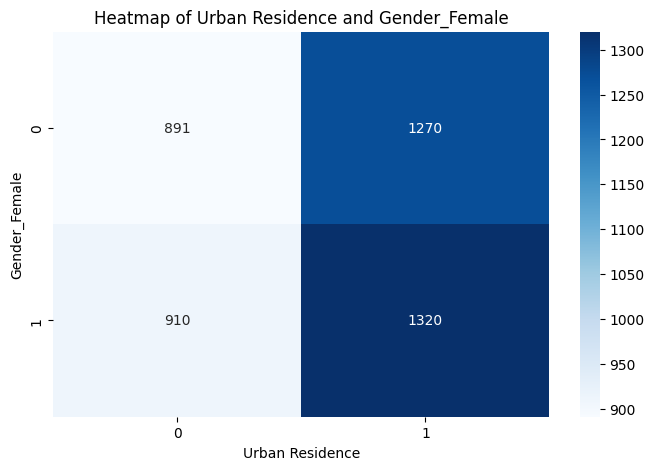

Pearson Correlation: -0.022514588807158765



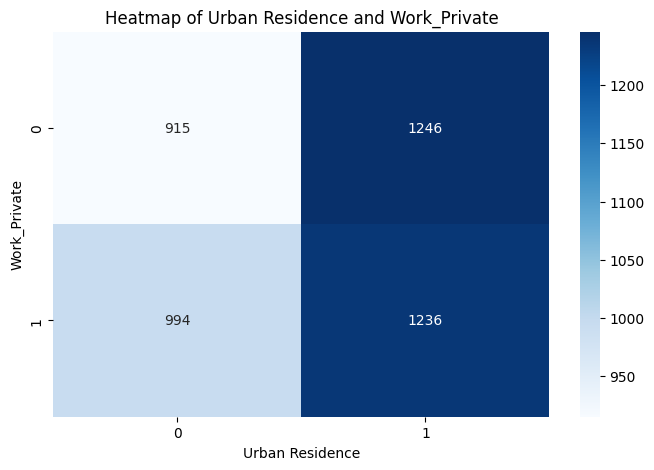

Pearson Correlation: 0.010529332626161552



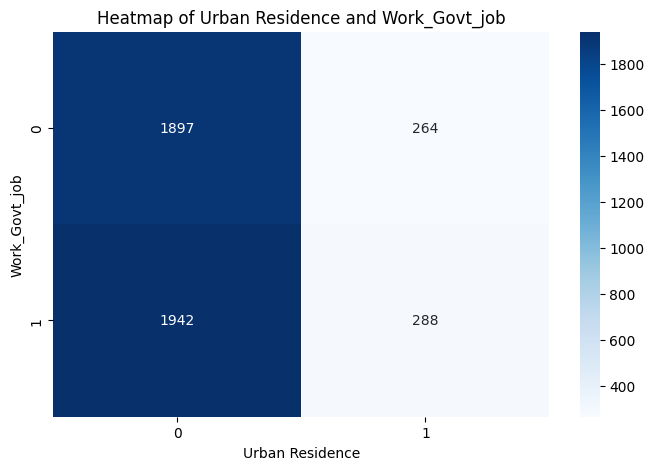

Pearson Correlation: 0.016950928535184425



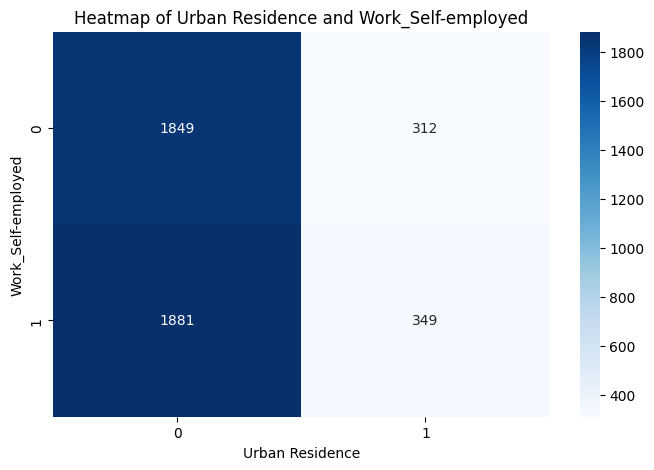

Pearson Correlation: -0.0003735671238203984



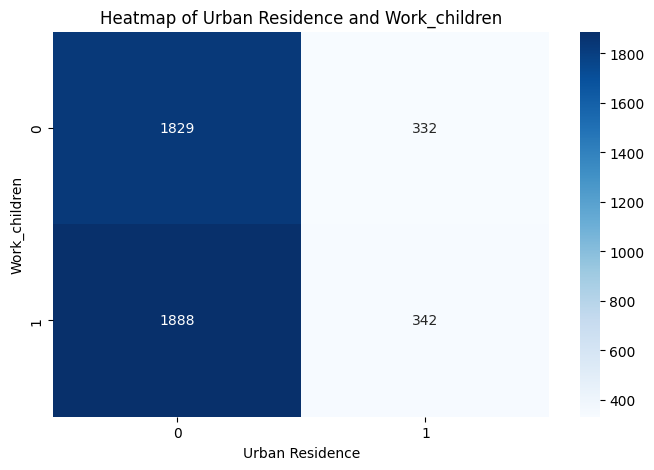

Pearson Correlation: 0.024692004024161475



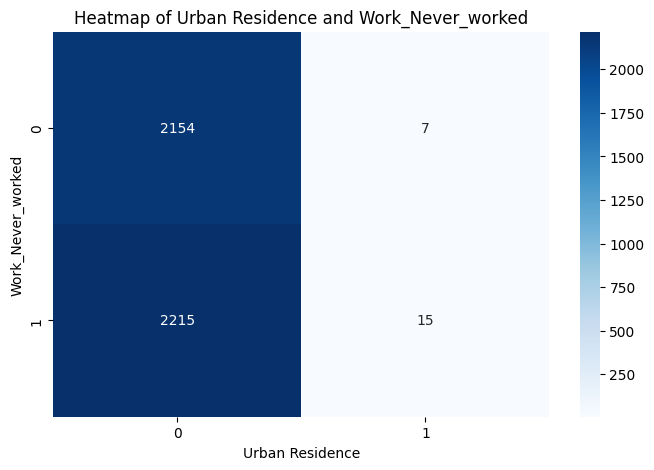

Pearson Correlation: -0.018026709625275177



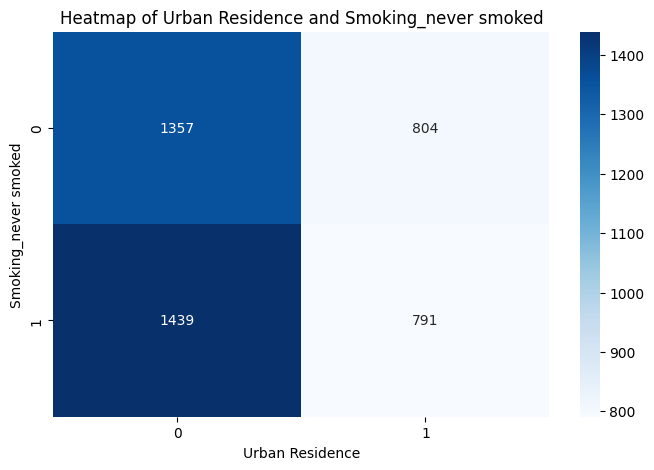

Pearson Correlation: -0.005008554155560694



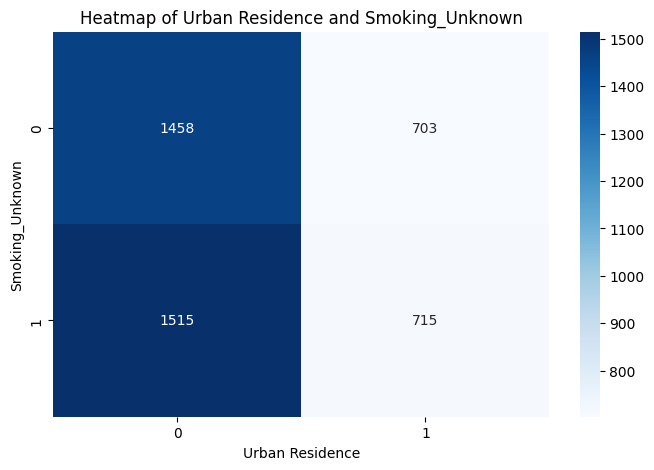

Pearson Correlation: 0.030069117735427378



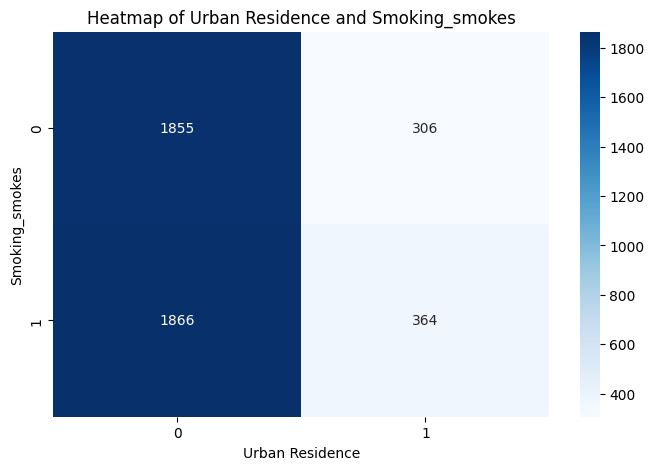

Pearson Correlation: 0.0005416315143669108



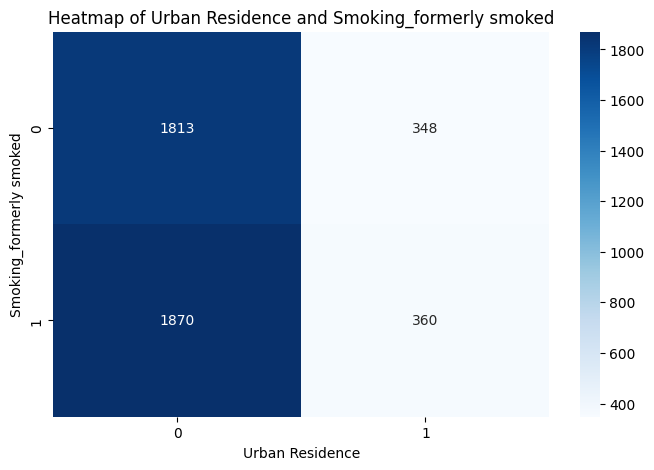

Pearson Correlation: 1.0488356327736103e-05



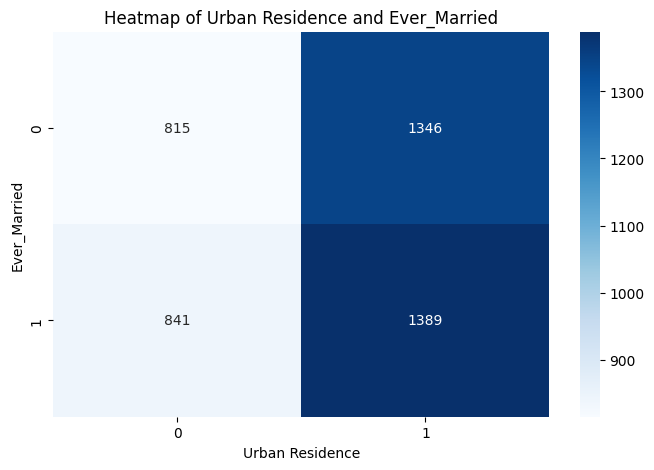

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Residence_Urban' and i!='id':

    correlation = data[i].corr(data['Residence_Urban'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x='Residence_Urban', y=i, data=data)
        plt.title(f'Box Plot of {i} by Urban Residence')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
      contingency_table = pd.crosstab(data['Residence_Urban'], data[i])
      # Plotting the heatmap
      plt.figure(figsize=(8, 5))
      sns.heatmap(contingency_table, annot=True, fmt='d', cmap='Blues')
      plt.title('Heatmap of Urban Residence and '+ i)
      plt.xlabel('Urban Residence')
      plt.ylabel(i)
      plt.show()


# Male Gender and All Variables

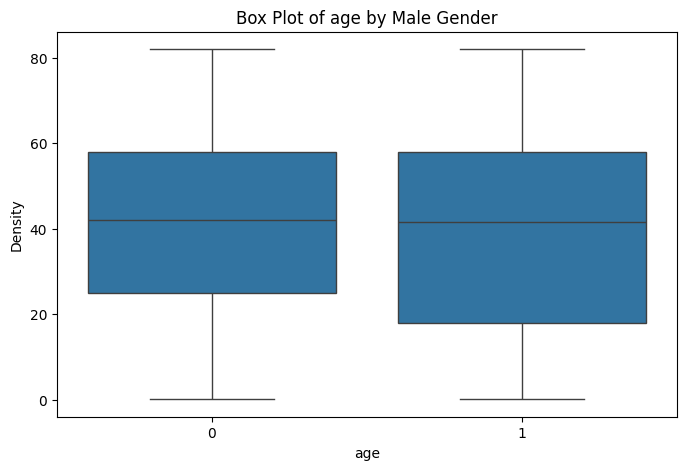

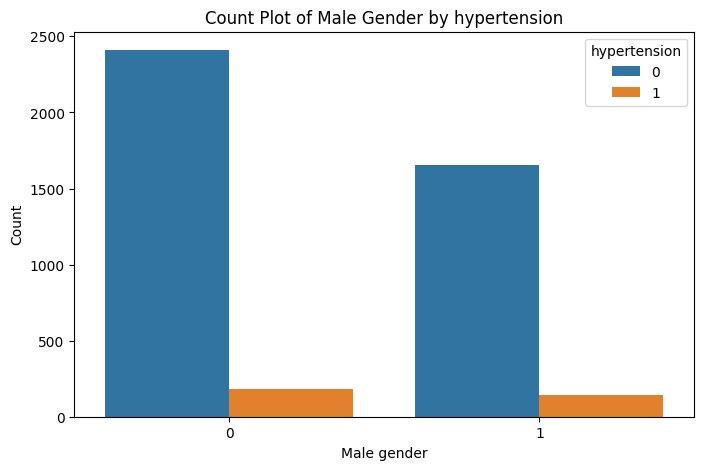

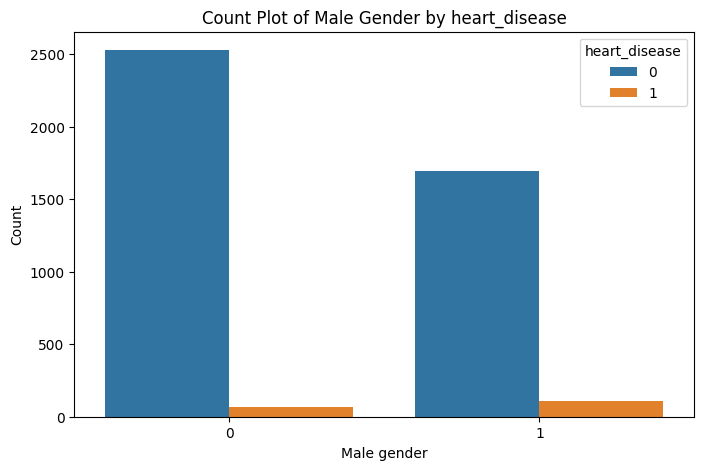

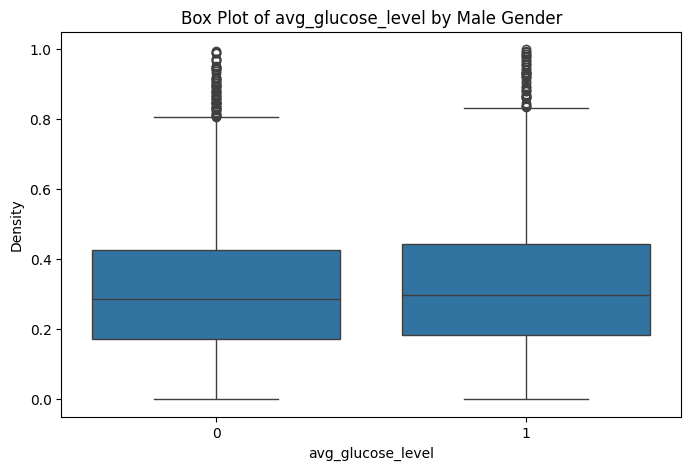

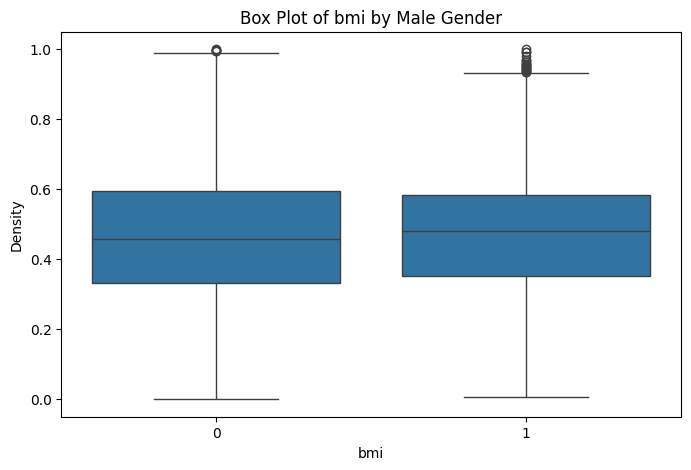

...

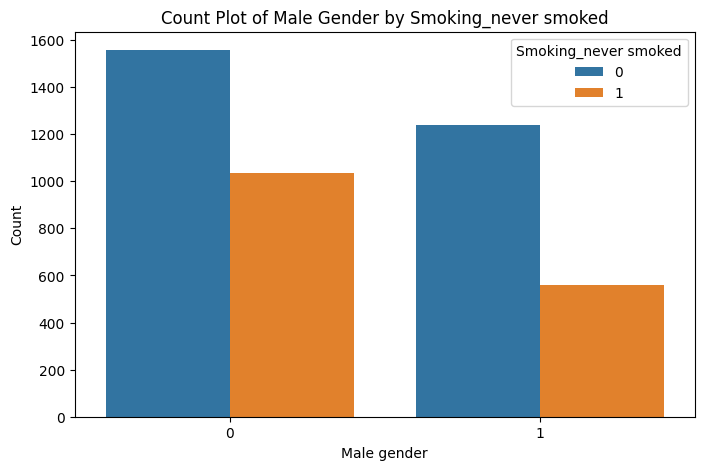

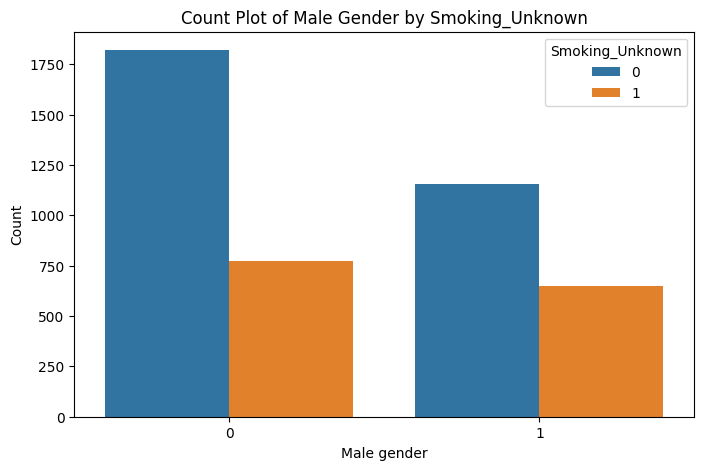

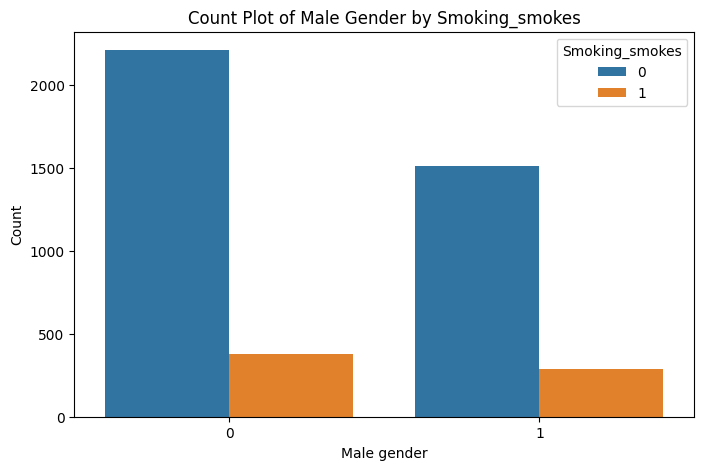

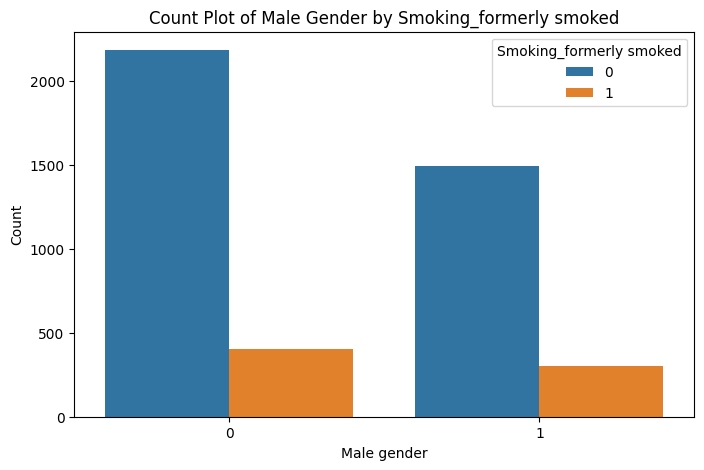

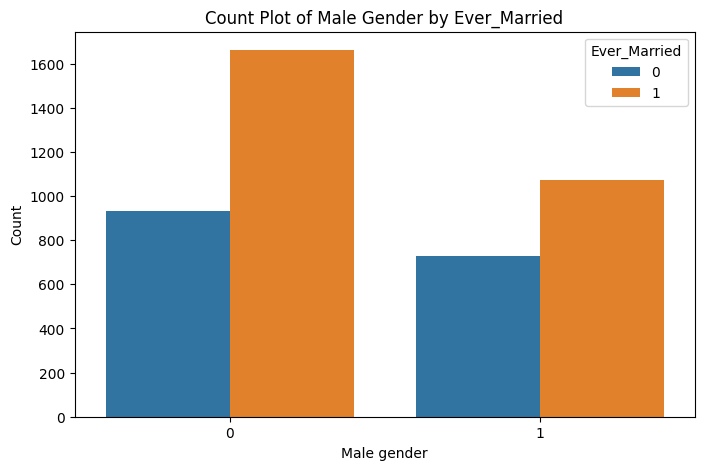

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Gender_Male' and i!='id':


    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x='Gender_Male', y=i, data=data)
        plt.title(f'Box Plot of {i} by Male Gender')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()

    else:
       plt.figure(figsize=(8, 5))
       sns.countplot(x='Gender_Male', hue=i, data=data)
       plt.title('Count Plot of Male Gender by '+ i)
       plt.xlabel('Male gender')
       plt.ylabel('Count')
       plt.legend(title=i)


# Female Gender and All Variables

Pearson Correlation: 0.04678460936254872



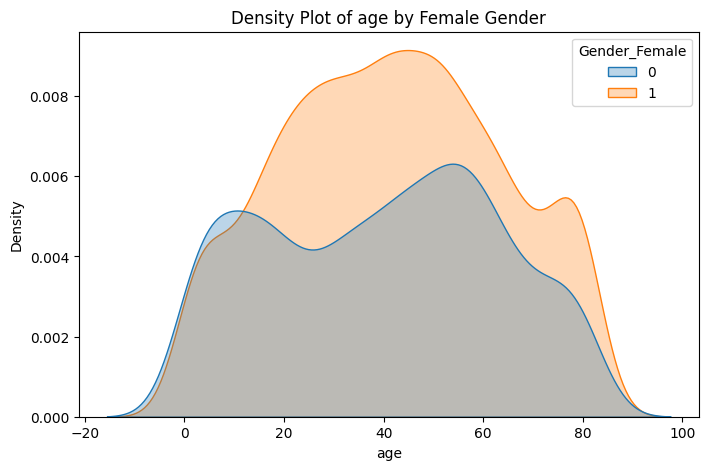

Pearson Correlation: -0.01993720819981809



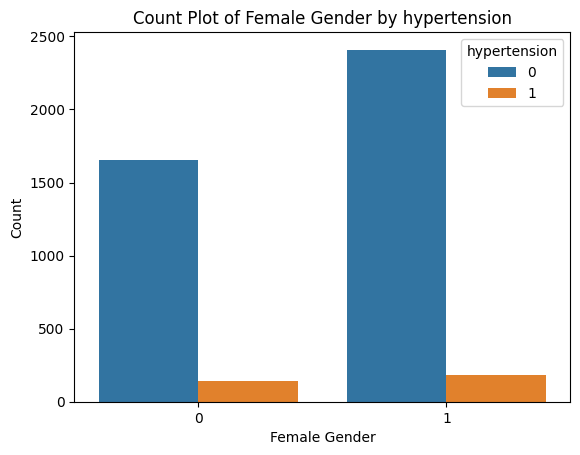

Pearson Correlation: -0.08938692518743668



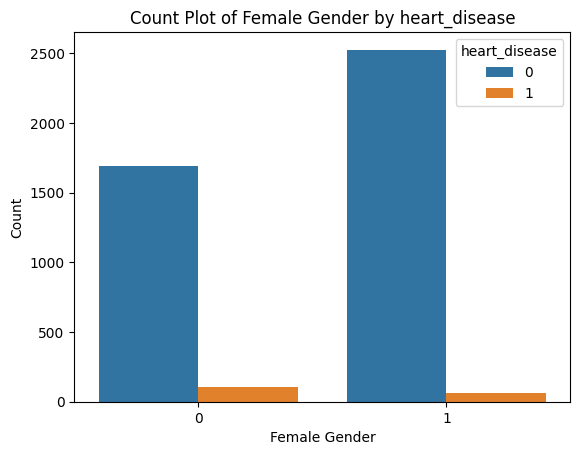

Pearson Correlation: -0.032077089170228834



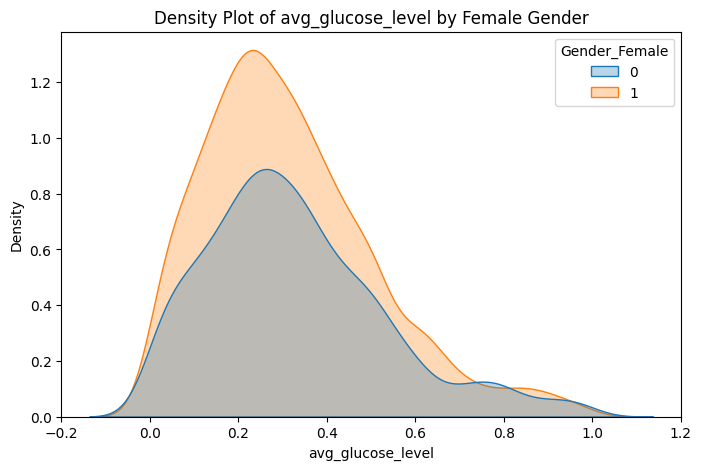

Pearson Correlation: 0.0019911094179934662



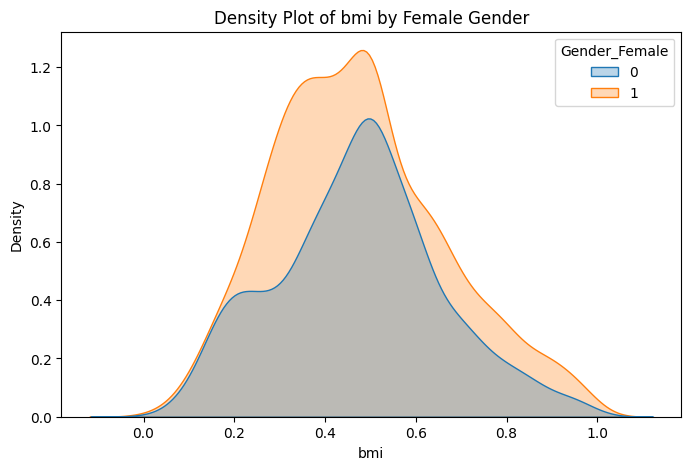

Pearson Correlation: 0.0016456991305393493



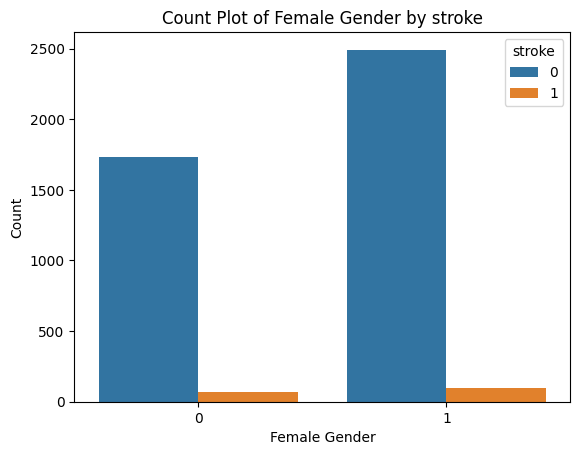

Pearson Correlation: -0.004306943596816924



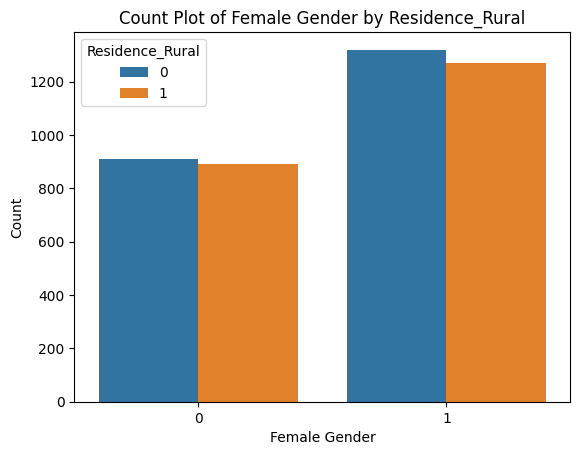

Pearson Correlation: 0.004306943596816924



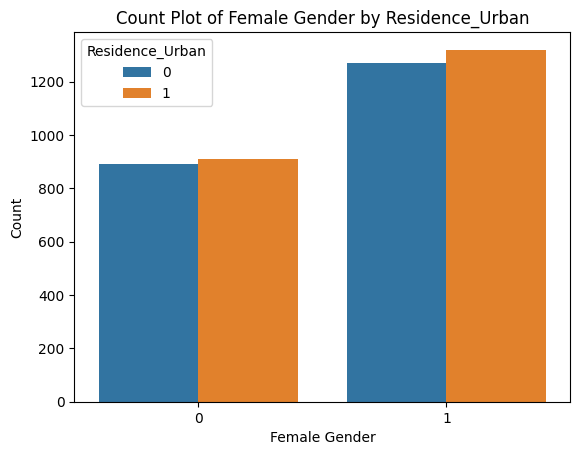

Pearson Correlation: -0.9995293971881449



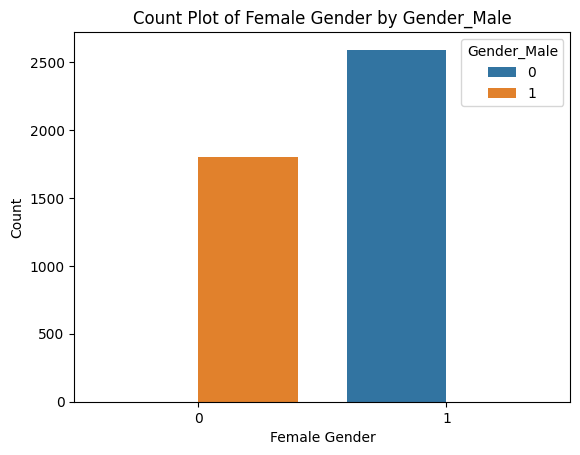

Pearson Correlation: 0.028963757265687746



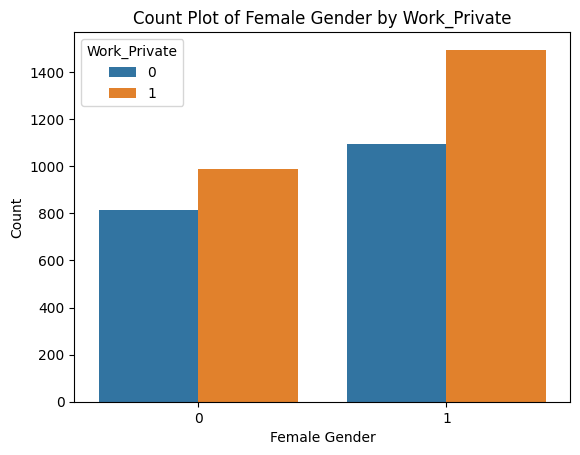

Pearson Correlation: 0.02570721363019386



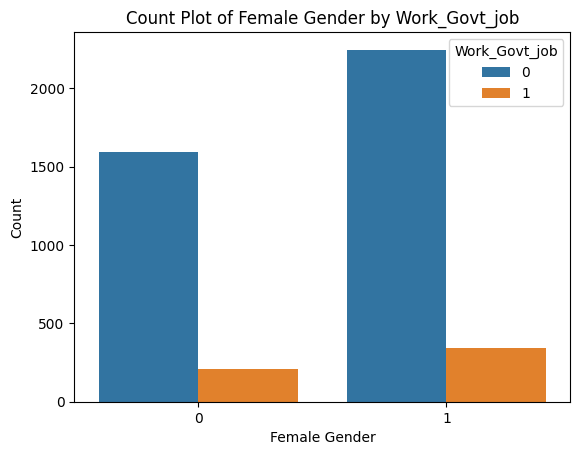

Pearson Correlation: 0.040286132403296884



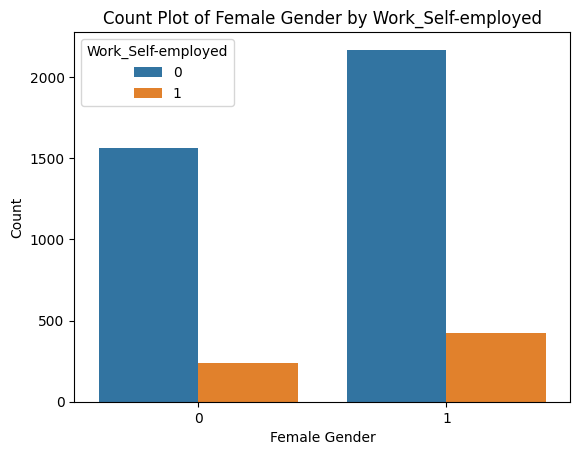

Pearson Correlation: -0.10090188050029315



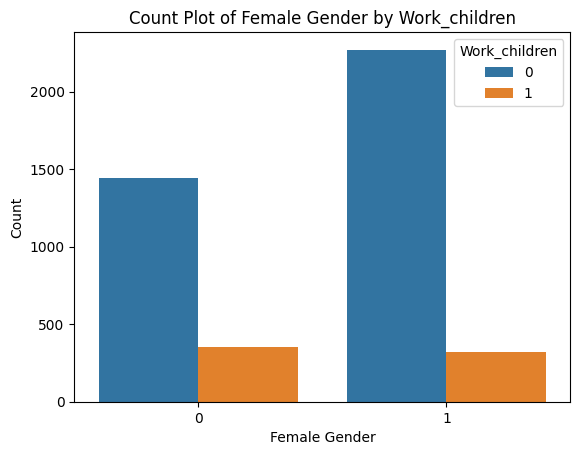

Pearson Correlation: -0.0129616588644965



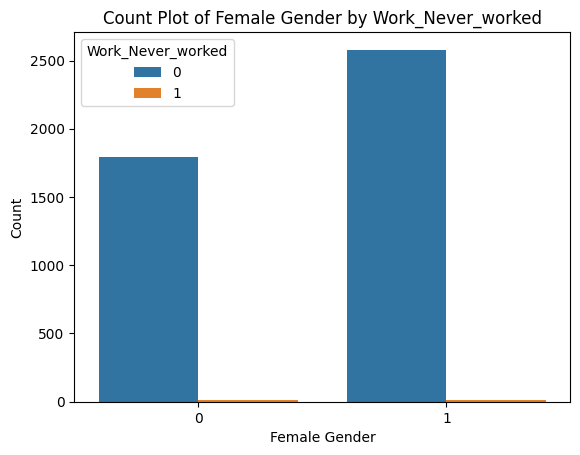

Pearson Correlation: 0.08972772471040519



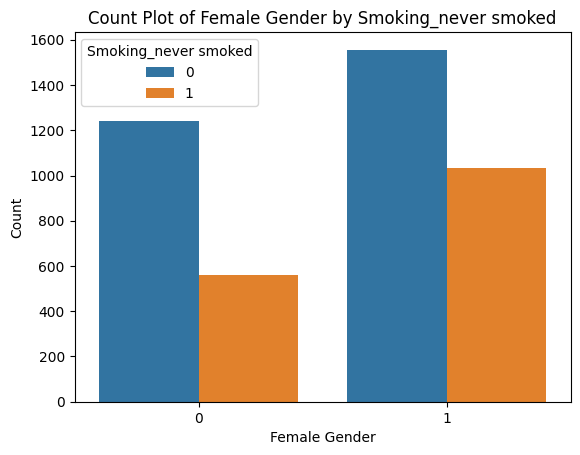

Pearson Correlation: -0.06475601631386571



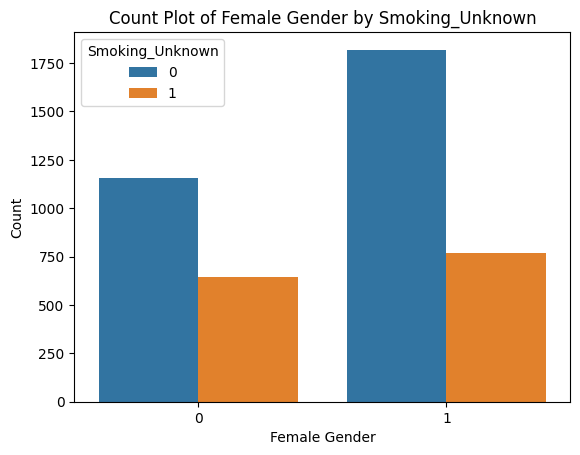

Pearson Correlation: -0.018277474402958797



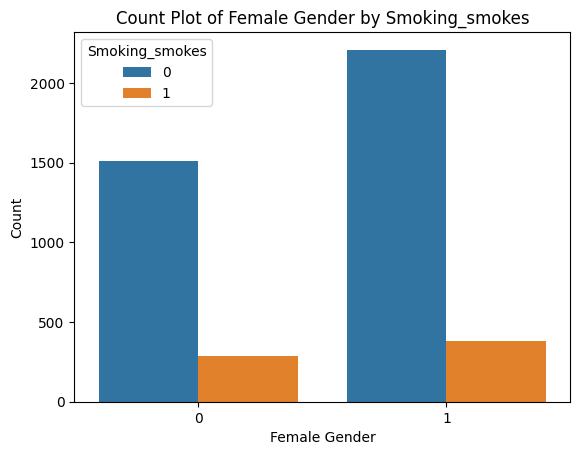

Pearson Correlation: -0.01713394197749201



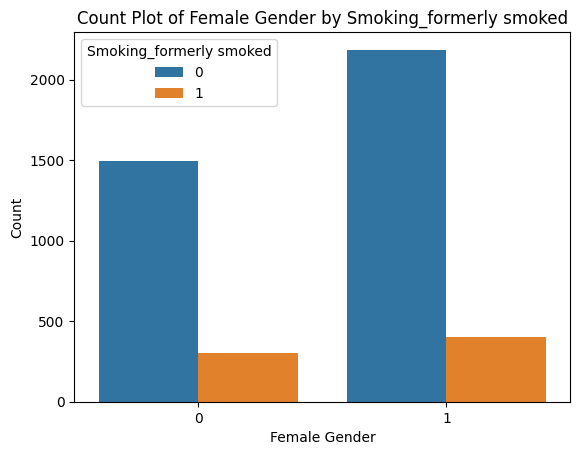

Pearson Correlation: 0.04564487098490415



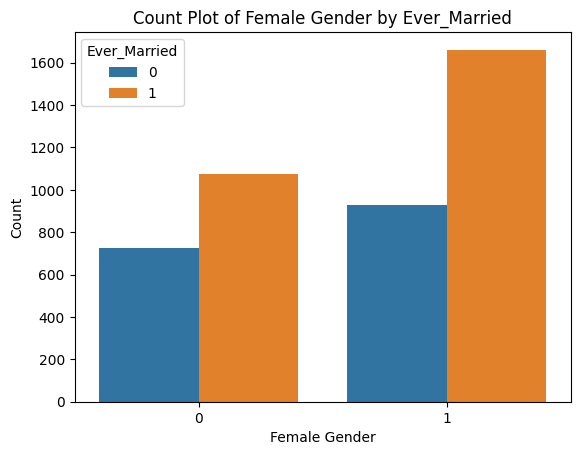

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Gender_Female' and i!='id':

    correlation = data[i].corr(data['Gender_Female'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Gender_Female', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Female Gender')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Gender_Female', hue=i, data=data)
       plt.title('Count Plot of Female Gender by '+ i)
       plt.xlabel('Female Gender')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()




# Self Employed and All Variables

Pearson Correlation: 0.33602020066583327



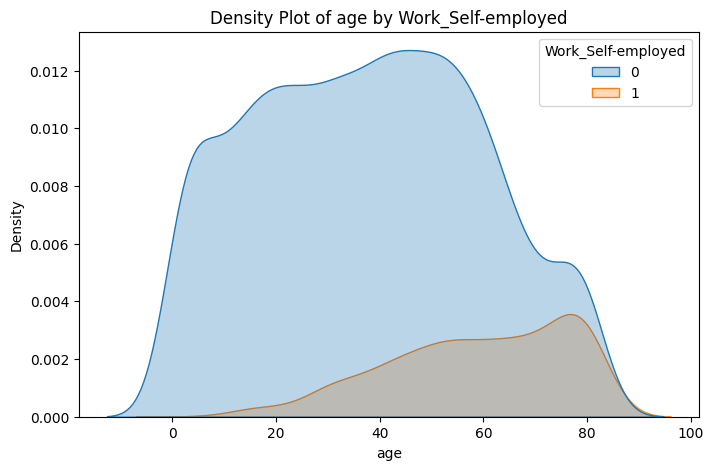

Pearson Correlation: 0.10184689016874013



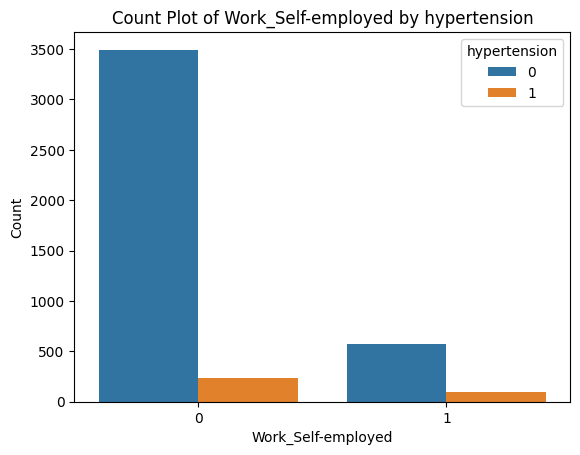

Pearson Correlation: 0.0988372068483594



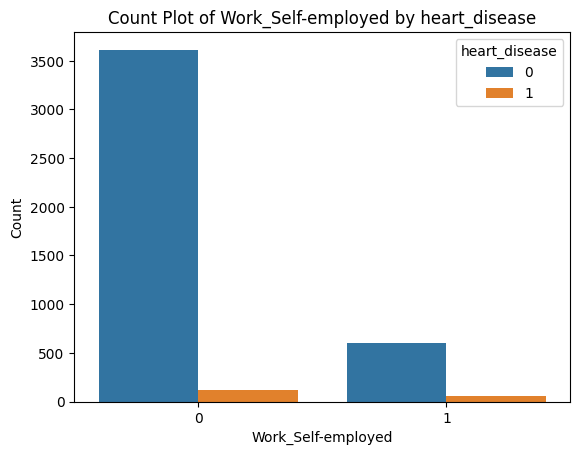

Pearson Correlation: -0.01611137134229846



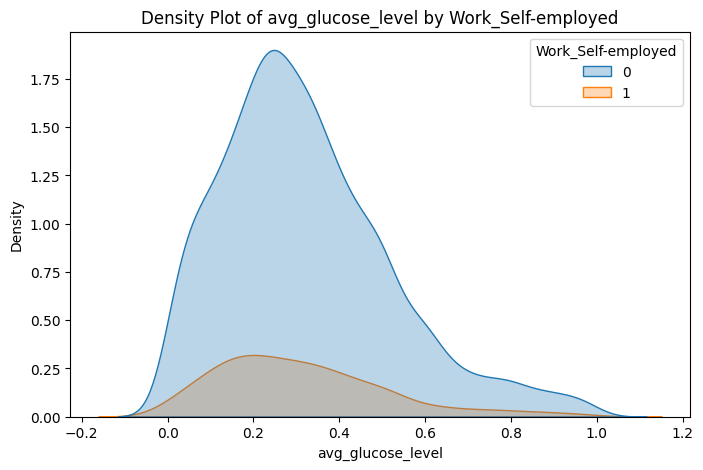

Pearson Correlation: 0.09352174760695159



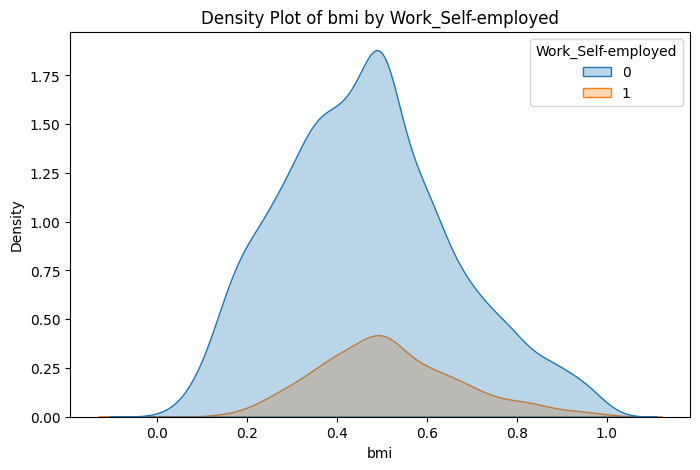

Pearson Correlation: 0.08091498529848544



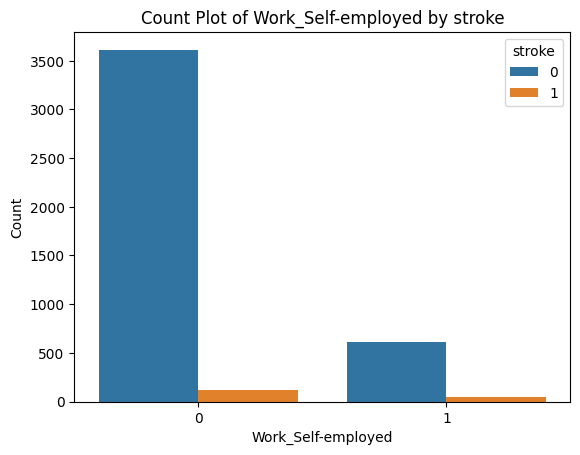

Pearson Correlation: -0.01695092853518442



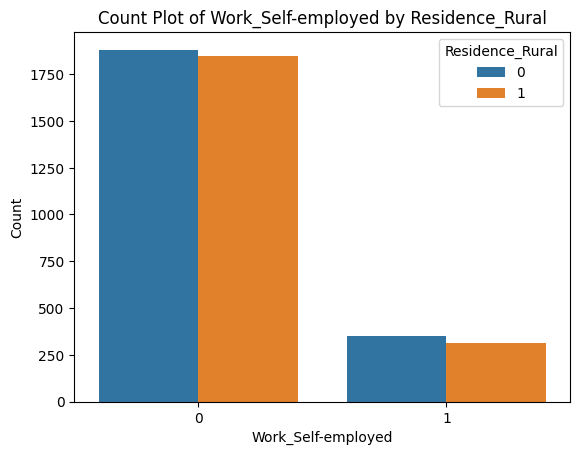

Pearson Correlation: 0.01695092853518442



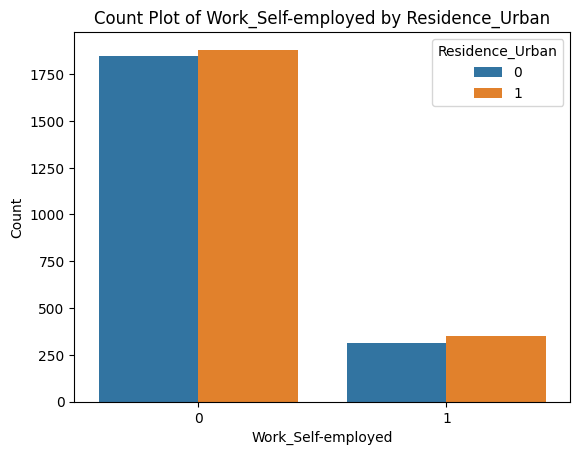

Pearson Correlation: -0.04009461533303077



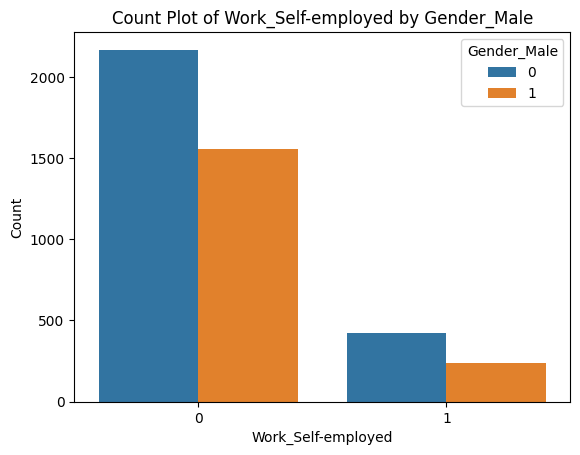

Pearson Correlation: 0.040286132403296884



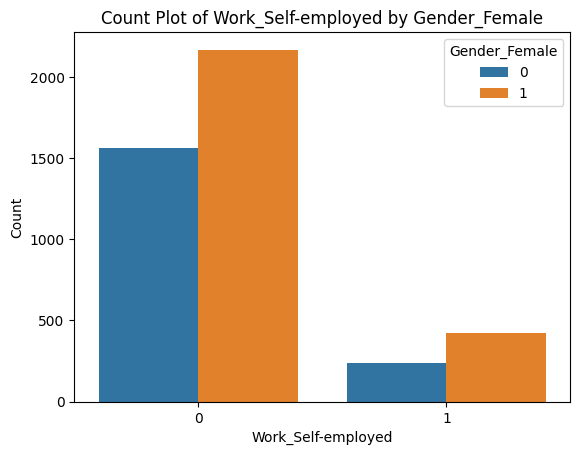

Pearson Correlation: -0.48000331667058393



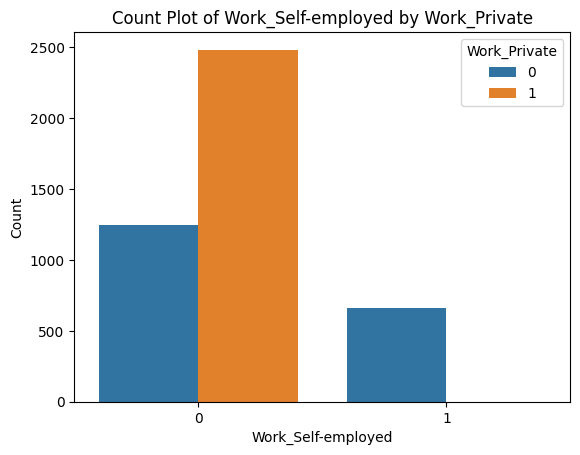

Pearson Correlation: -0.15962716355187861



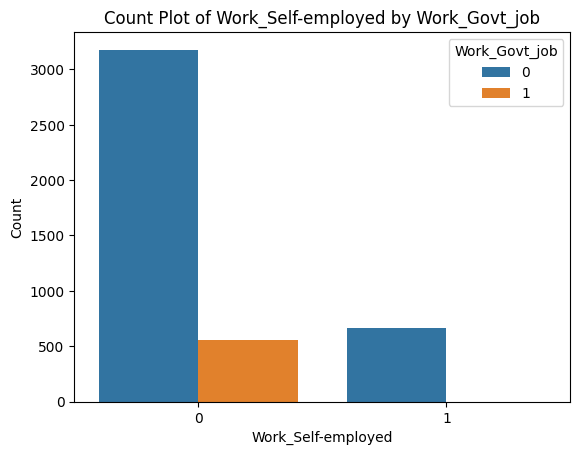

Pearson Correlation: -0.17925859227089655



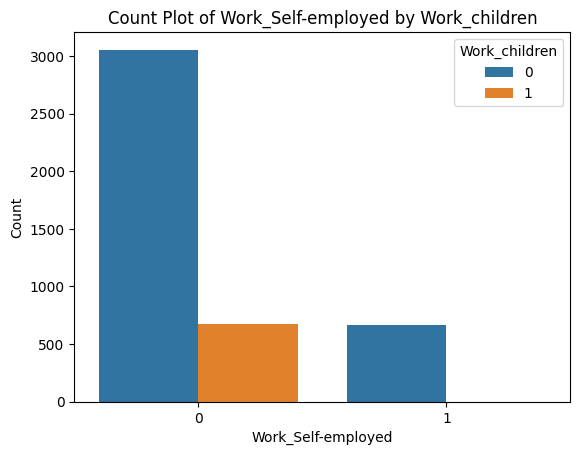

Pearson Correlation: -0.02987216035312097



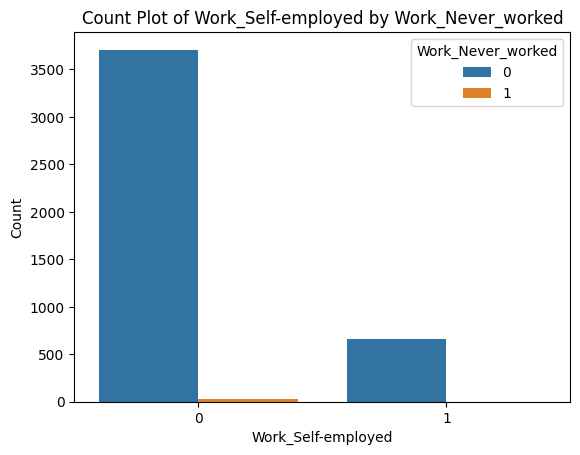

Pearson Correlation: 0.03164400620967565



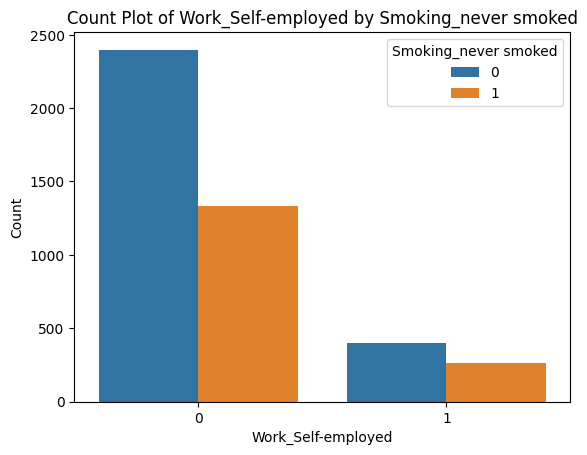

Pearson Correlation: -0.10413596080195114



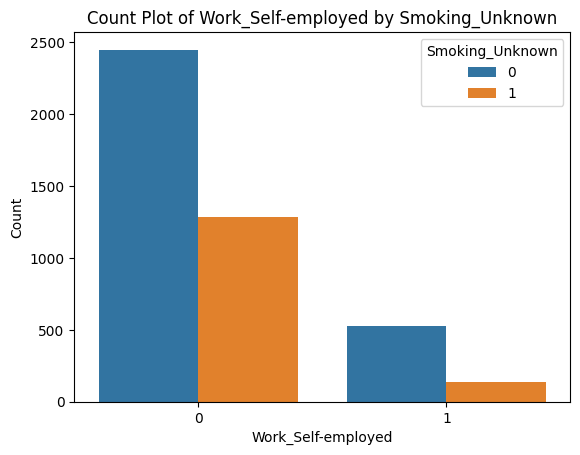

Pearson Correlation: -0.003291705672231734



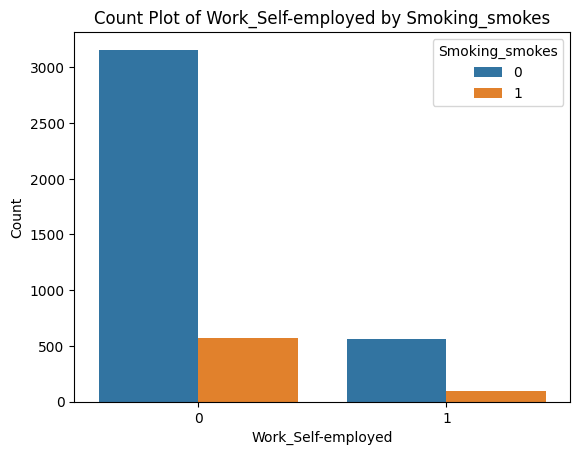

Pearson Correlation: 0.09424493688966235



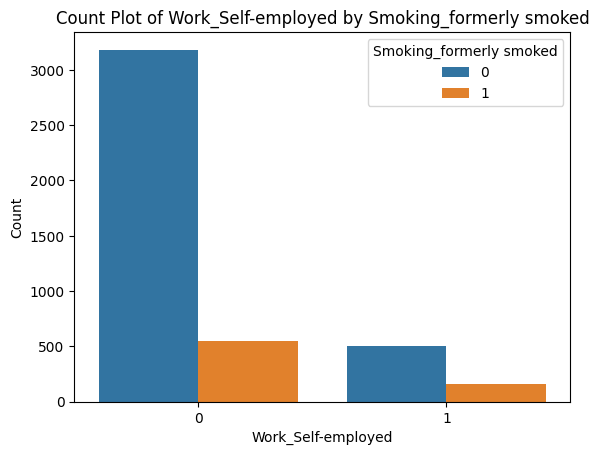

Pearson Correlation: 0.20010604197580453



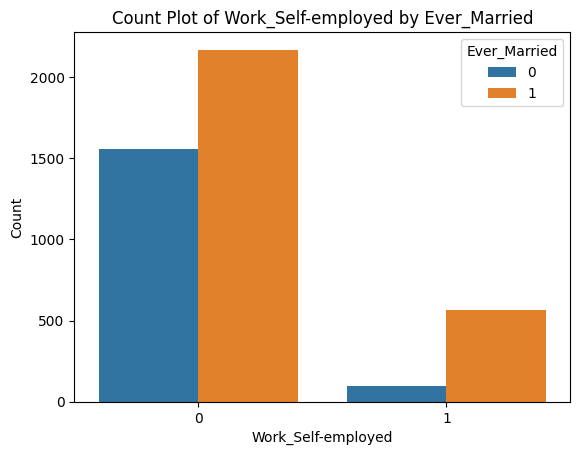

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Work_Self-employed' and i!='id':

    correlation = data[i].corr(data['Work_Self-employed'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Work_Self-employed', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Work_Self-employed')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Work_Self-employed', hue=i, data=data)
       plt.title('Count Plot of Work_Self-employed by '+ i)
       plt.xlabel('Work_Self-employed')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()



# Private Worker and All Variables

Pearson Correlation: 0.14164465061930823



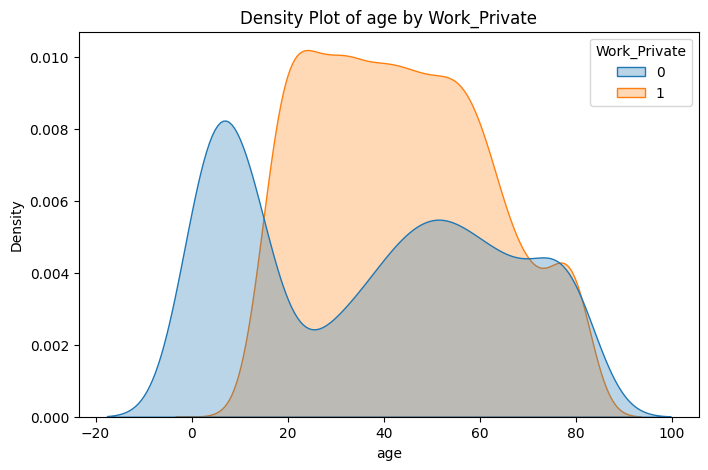

Pearson Correlation: 0.0012782447300337672



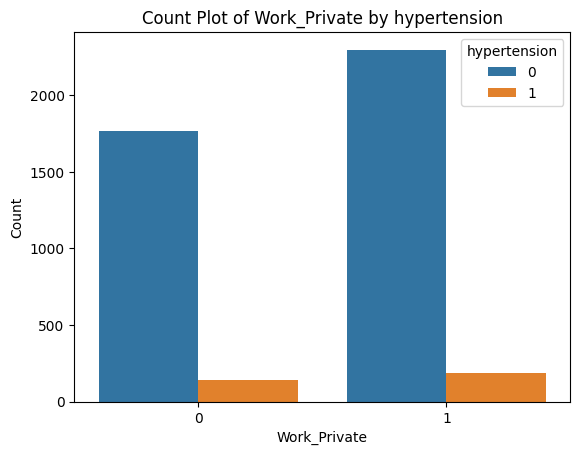

Pearson Correlation: -0.017103231846419747



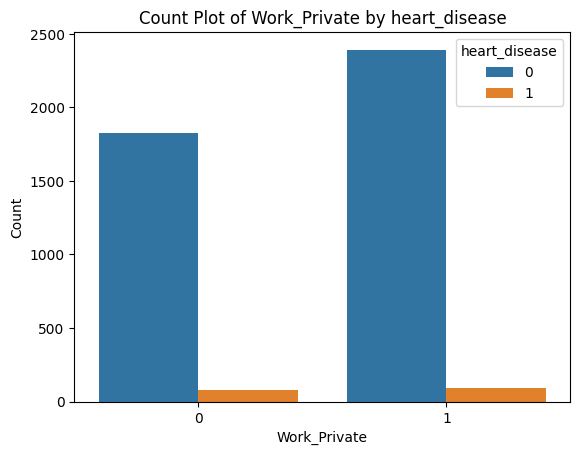

Pearson Correlation: 0.0035911368816676638



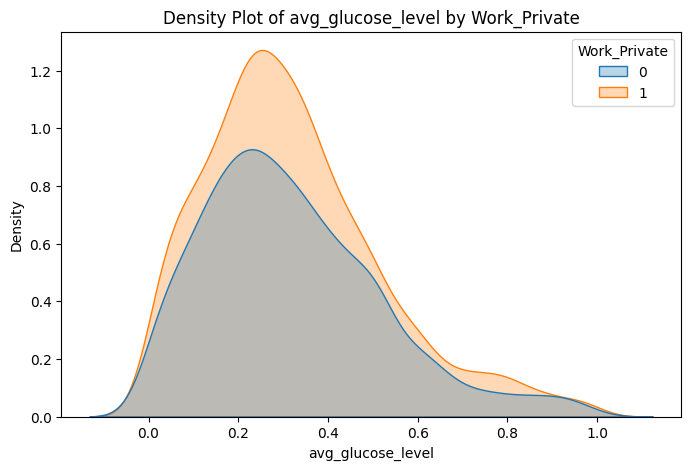

Pearson Correlation: 0.2253383579381038



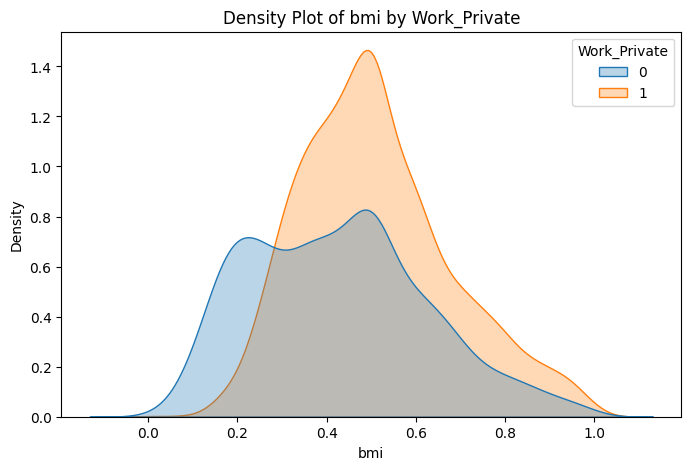

Pearson Correlation: -0.0006420373370947867



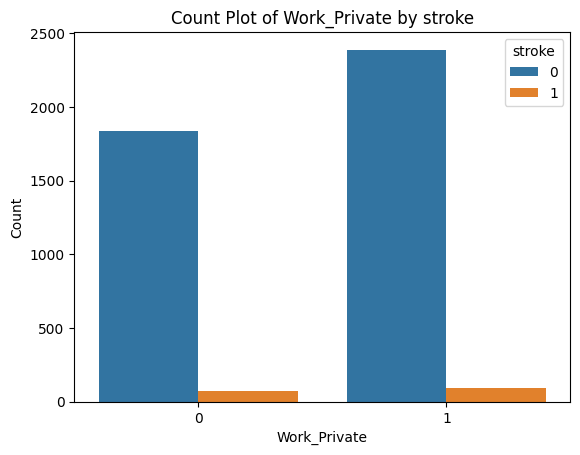

Pearson Correlation: 0.022514588807158765



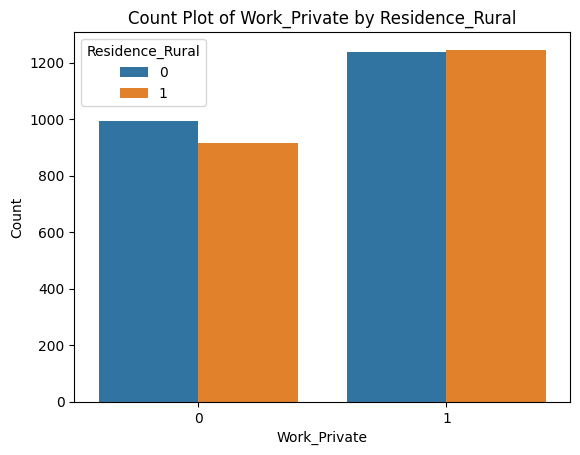

Pearson Correlation: -0.022514588807158765



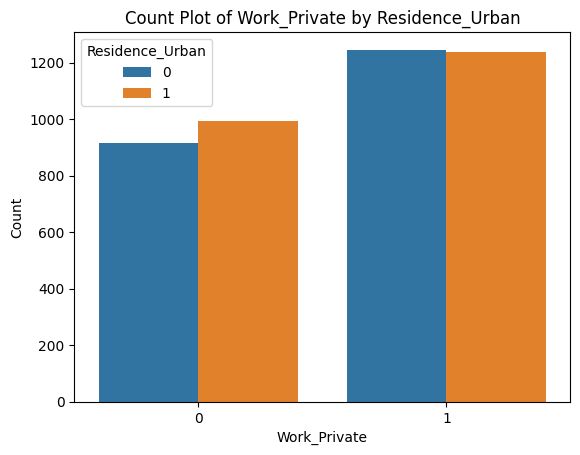

Pearson Correlation: -0.02937230942762841



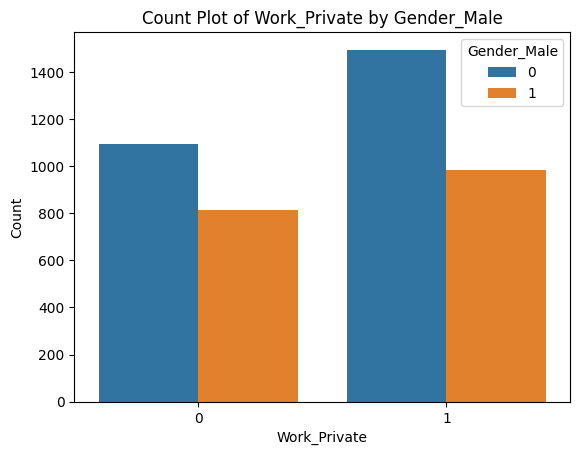

Pearson Correlation: 0.028963757265687746



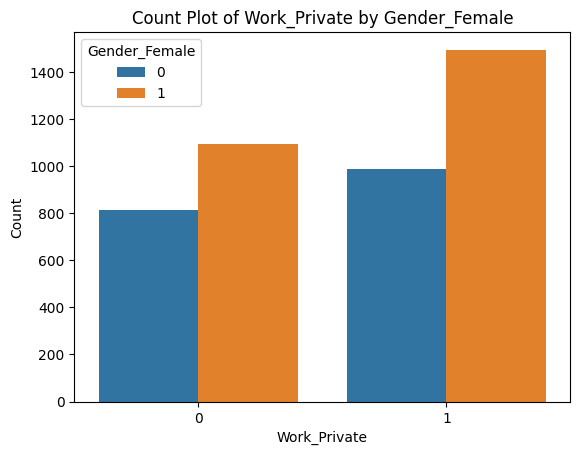

Pearson Correlation: -0.43237284175470836



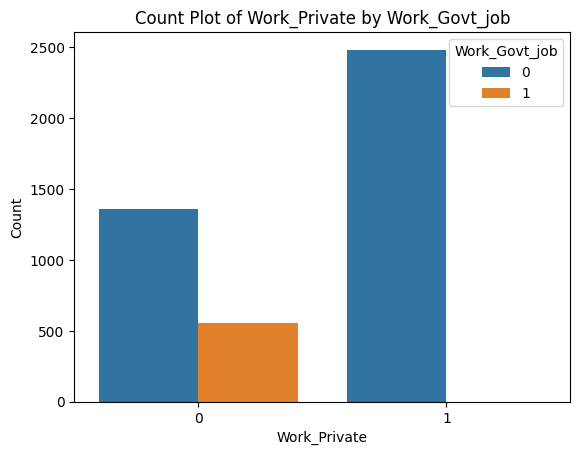

Pearson Correlation: -0.48000331667058393



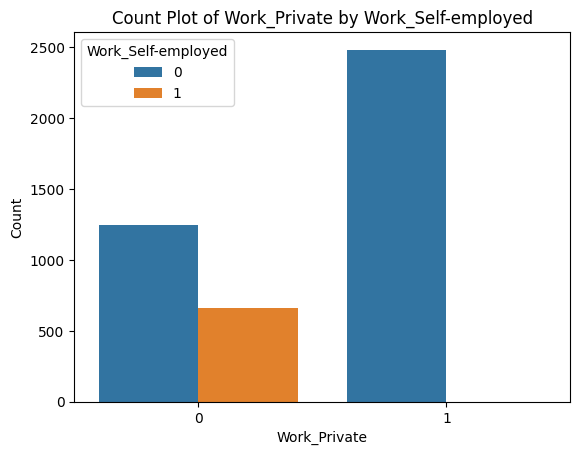

Pearson Correlation: -0.4855473543757281



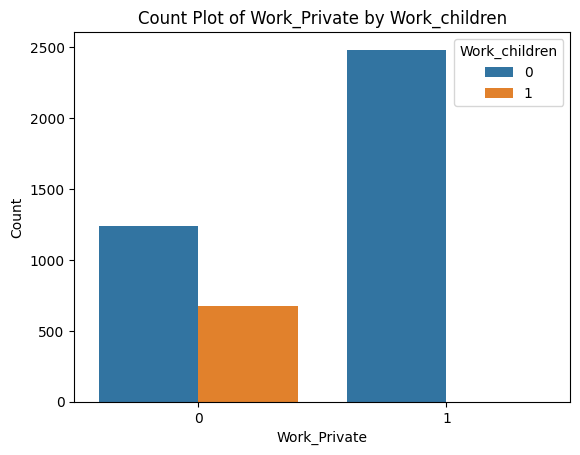

Pearson Correlation: -0.08091298857812257



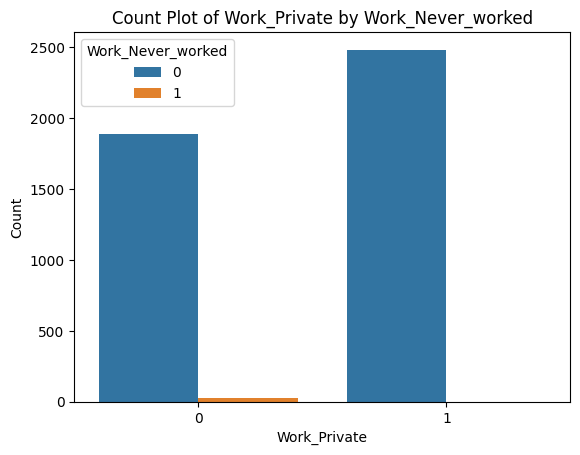

Pearson Correlation: 0.12745797425371932



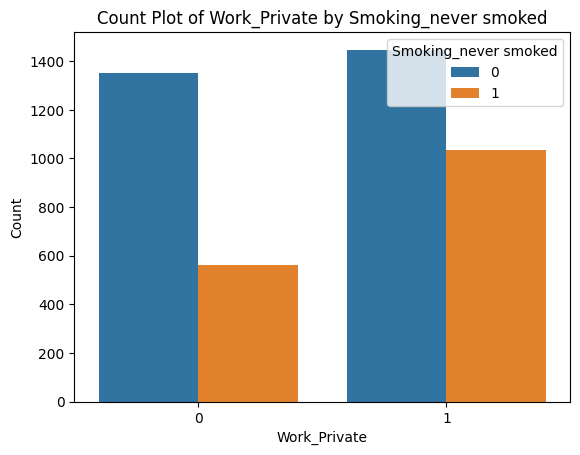

Pearson Correlation: -0.2422015105418057



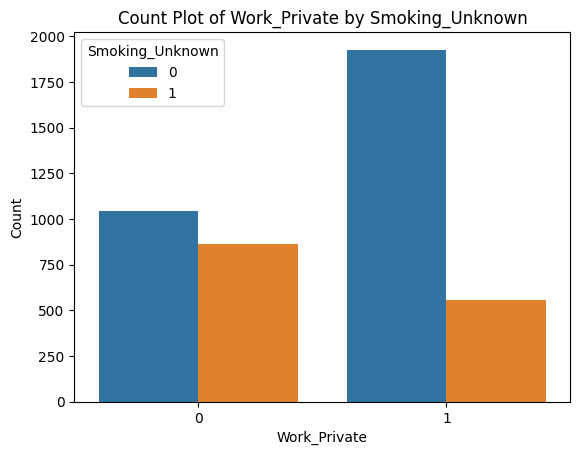

Pearson Correlation: 0.10895876645613335



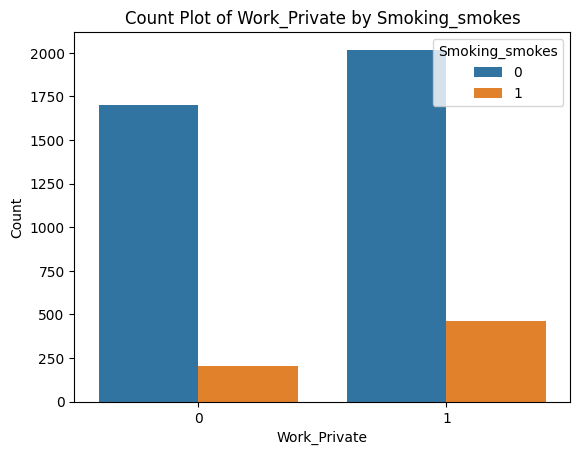

Pearson Correlation: 0.0347348851284011



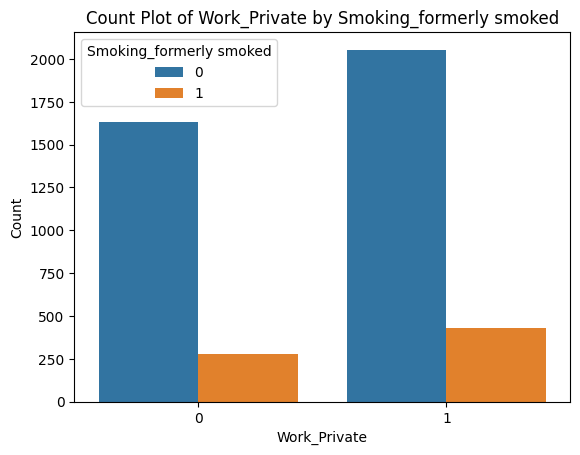

Pearson Correlation: 0.16782038022279513



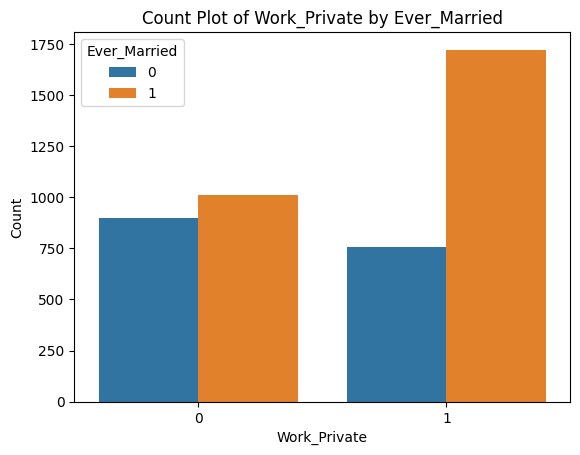

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Work_Private' and i!='id':

    correlation = data[i].corr(data['Work_Private'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Work_Private', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Work_Private')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Work_Private', hue=i, data=data)
       plt.title('Count Plot of Work_Private by '+ i)
       plt.xlabel('Work_Private')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()



# Govt Job and All Variables

Pearson Correlation: 0.1422899152977708



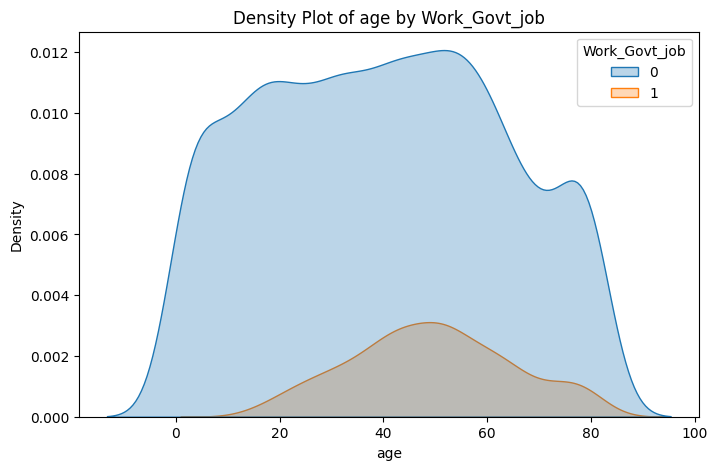

Pearson Correlation: 0.02362955709256888



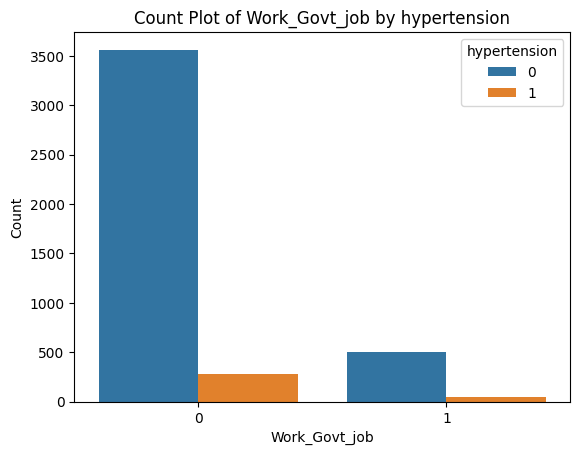

Pearson Correlation: 0.011959770718159249



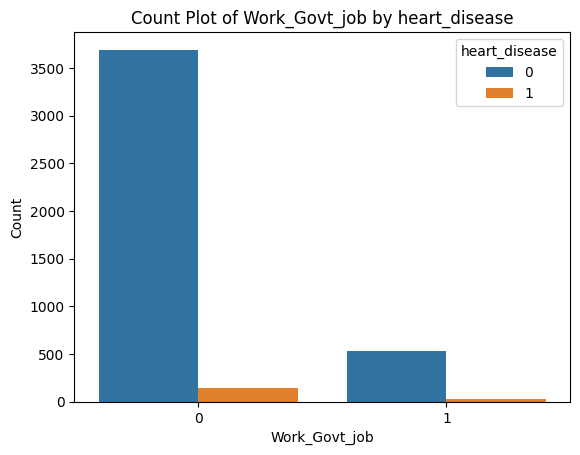

Pearson Correlation: -0.012174107523895764



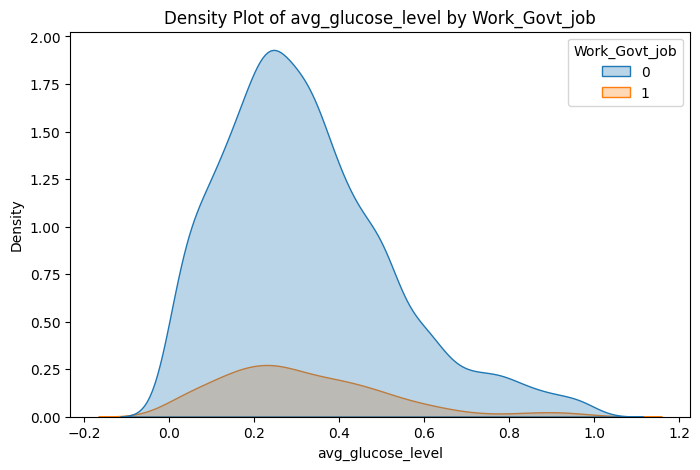

Pearson Correlation: 0.10478383732387286



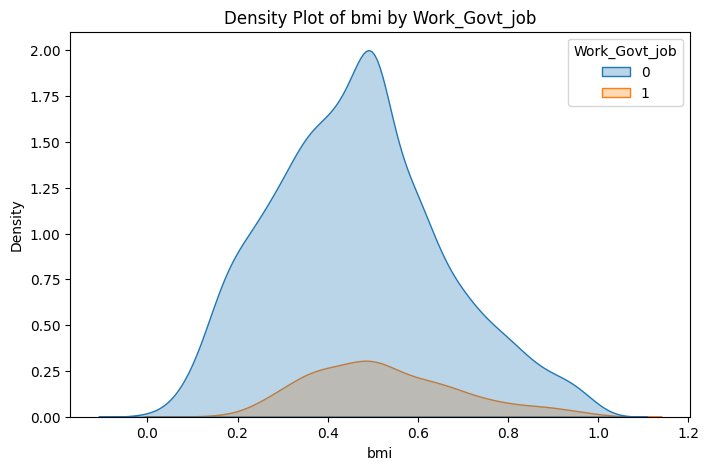

Pearson Correlation: 0.000930416259997375



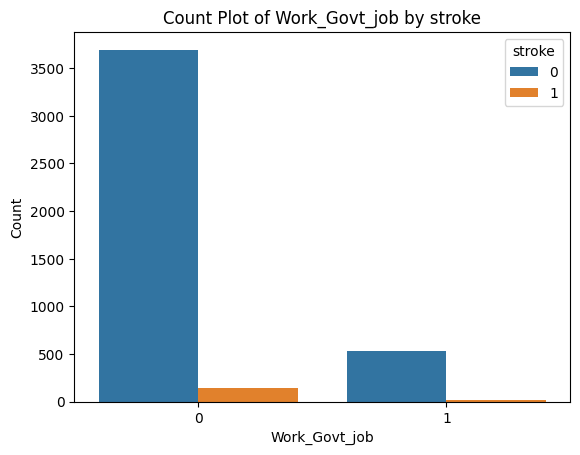

Pearson Correlation: -0.010529332626161552



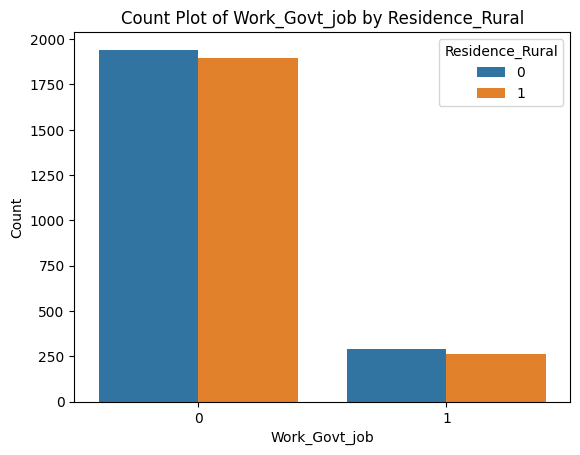

Pearson Correlation: 0.010529332626161552



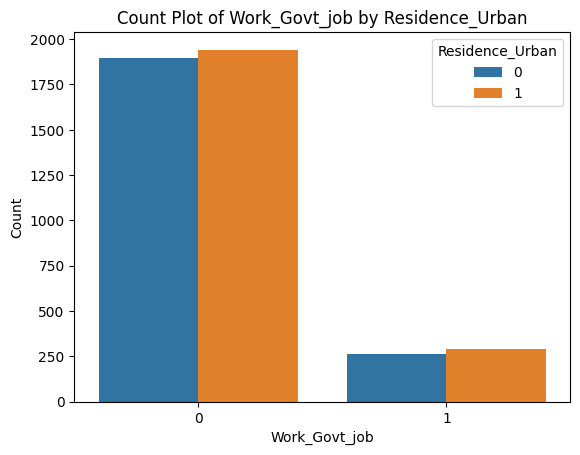

Pearson Correlation: -0.025533804549363326



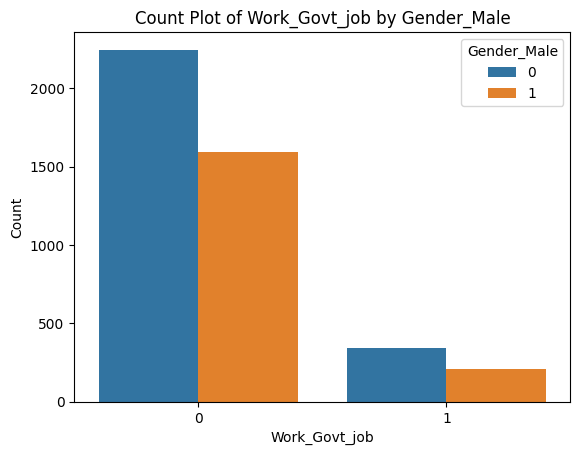

Pearson Correlation: 0.02570721363019386



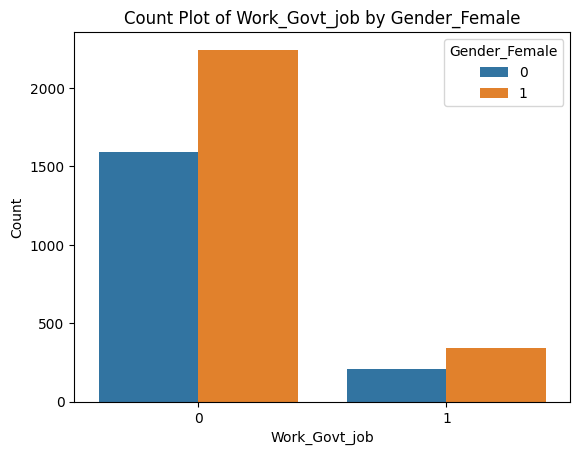

Pearson Correlation: -0.4323728417547083



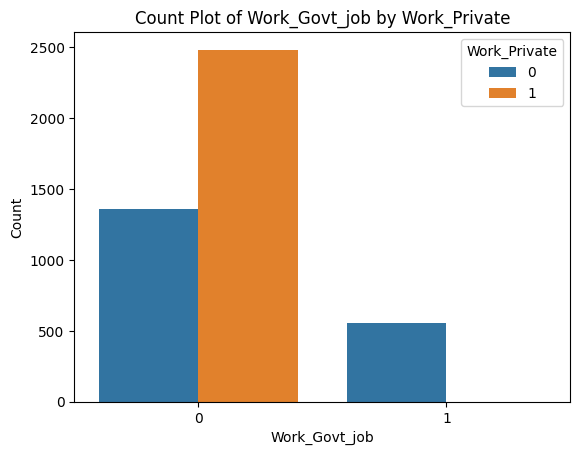

Pearson Correlation: -0.15962716355187861



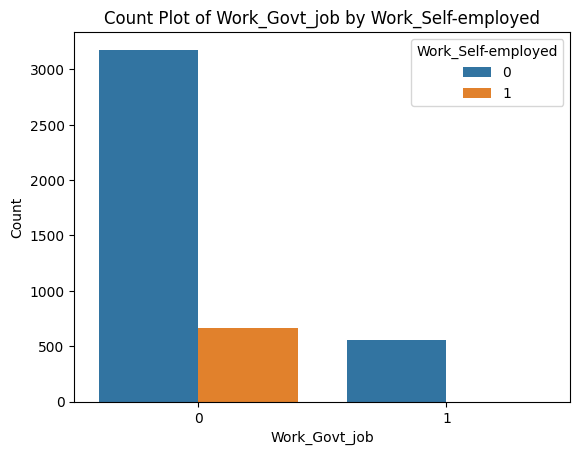

Pearson Correlation: -0.16147085709057146



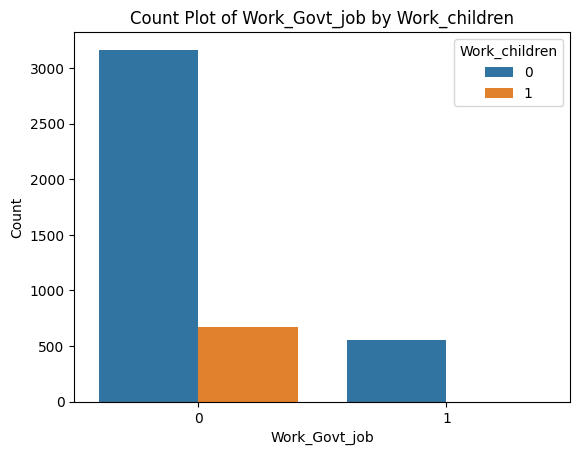

Pearson Correlation: -0.026907961700804468



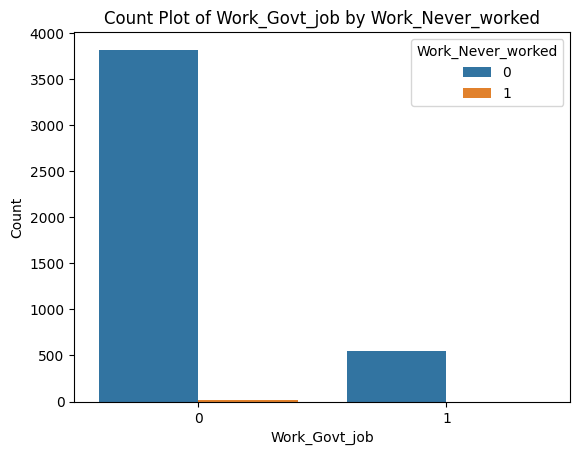

Pearson Correlation: 0.043550327516014065



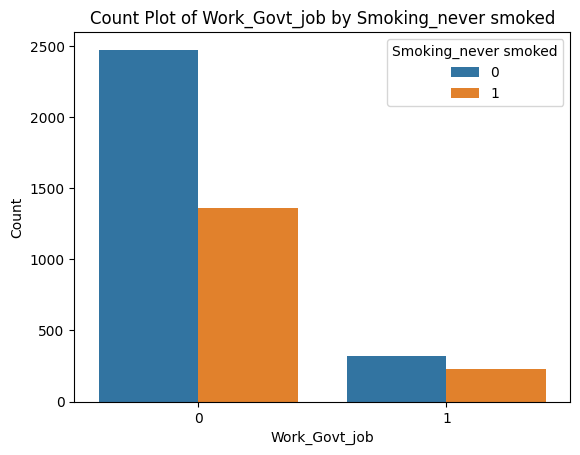

Pearson Correlation: -0.10174815261751519



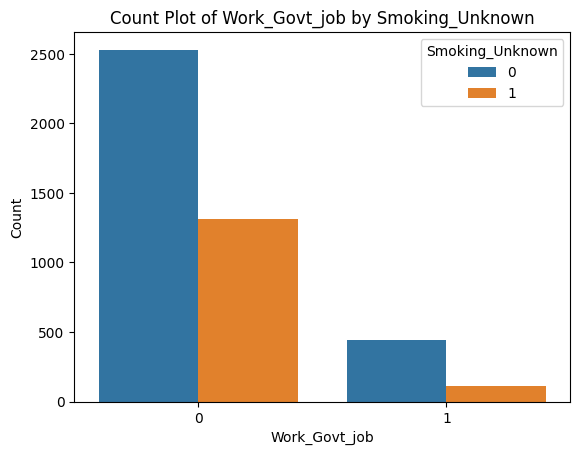

Pearson Correlation: 0.04159482650004109



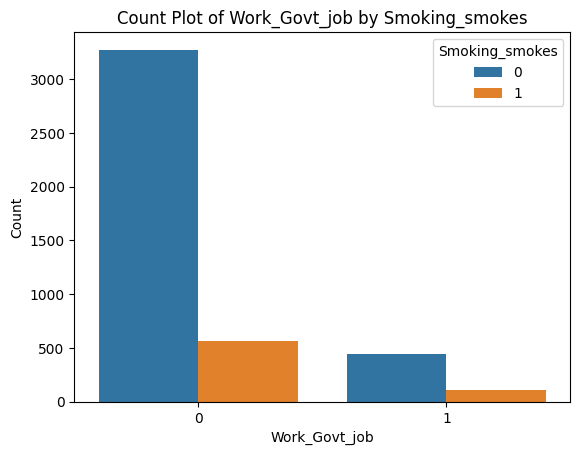

Pearson Correlation: 0.03174807213695434



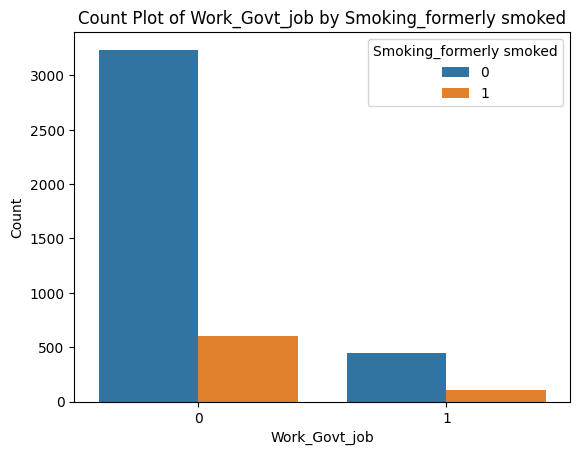

Pearson Correlation: 0.14765709051345205



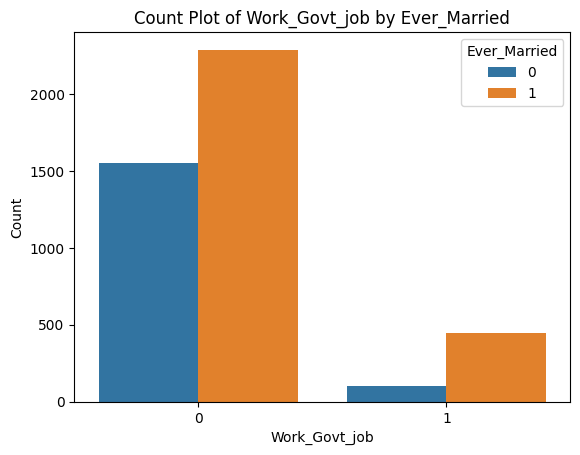

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Work_Govt_job' and i!='id':

    correlation = data[i].corr(data['Work_Govt_job'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Work_Govt_job', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Work_Govt_job')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Work_Govt_job', hue=i, data=data)
       plt.title('Count Plot of Work_Govt_job by '+ i)
       plt.xlabel('Work_Govt_job')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()



# Children Worker and All Variables

Pearson Correlation: -0.6437669911897849



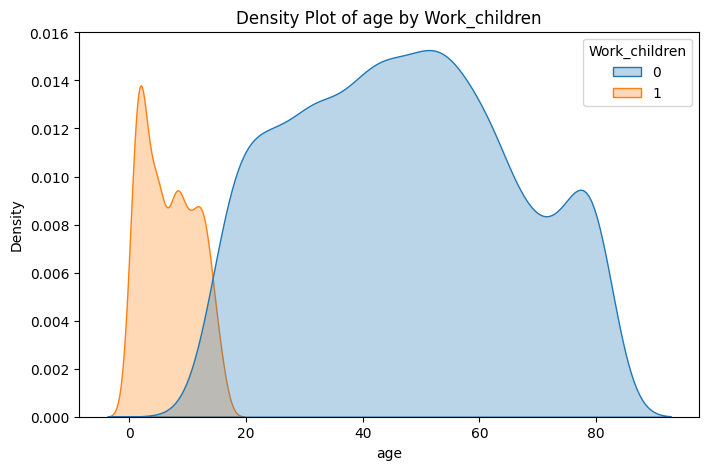

Pearson Correlation: -0.12059024924369634



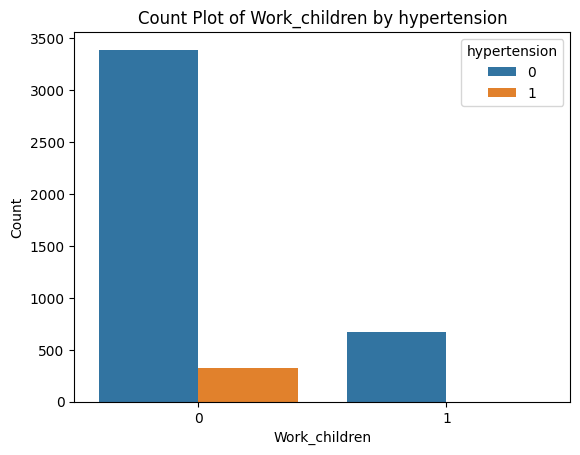

Pearson Correlation: -0.08272251774968509



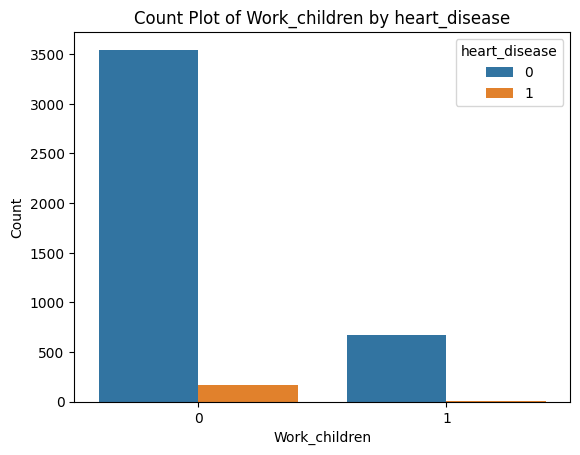

Pearson Correlation: 0.019440589121601192



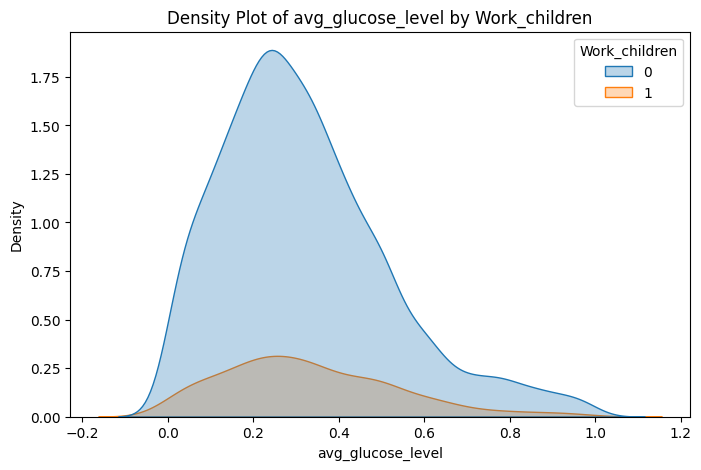

Pearson Correlation: -0.49424200798686296



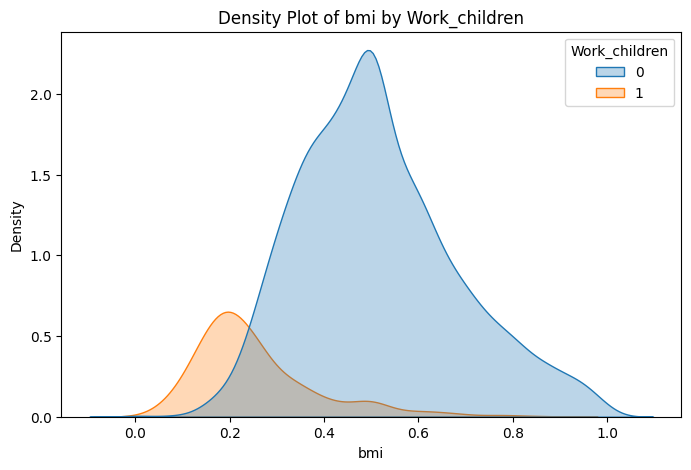

Pearson Correlation: -0.07749715252329376



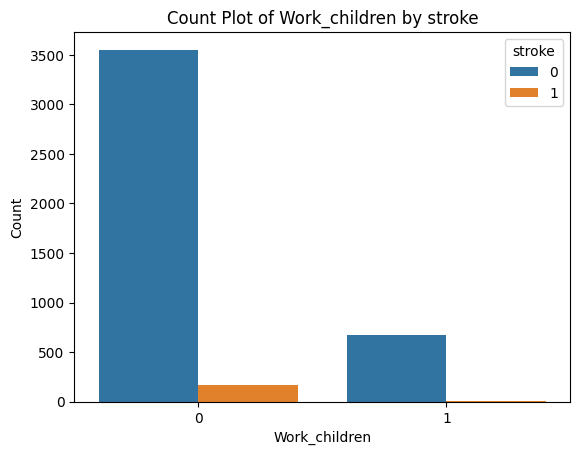

Pearson Correlation: 0.0003735671238203983



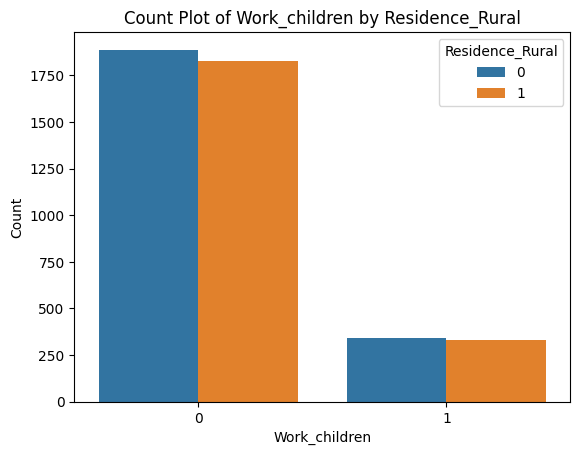

Pearson Correlation: -0.0003735671238203983



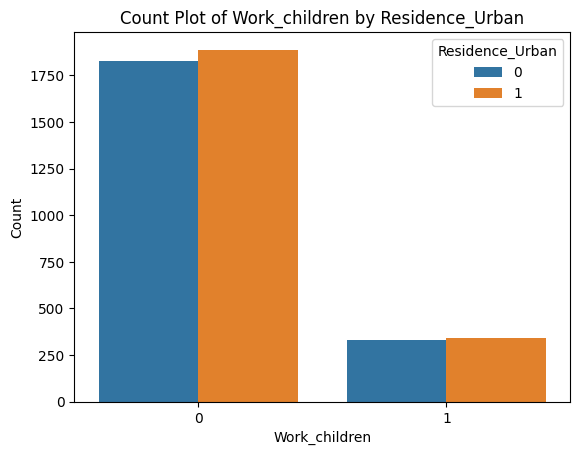

Pearson Correlation: 0.10110760639577761



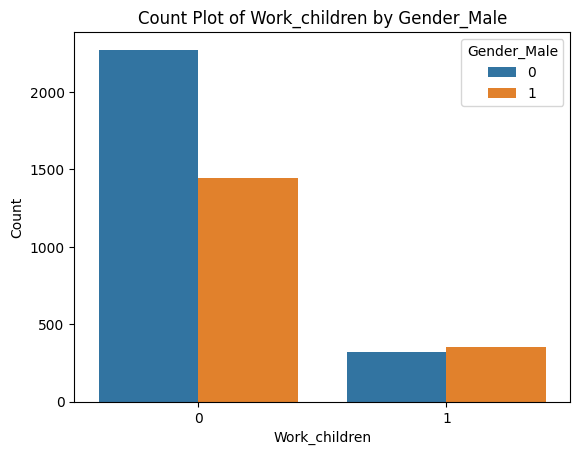

Pearson Correlation: -0.10090188050029314



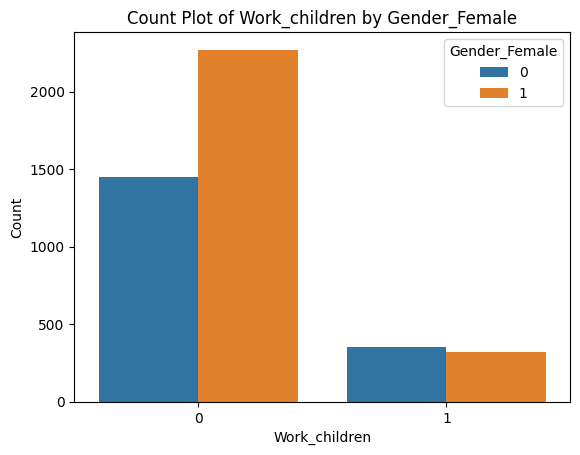

Pearson Correlation: -0.4855473543757281



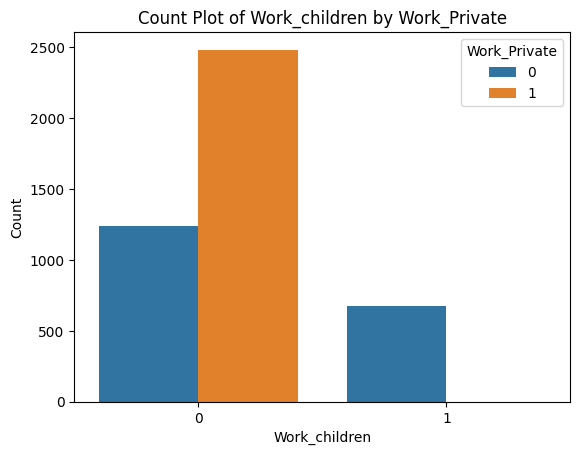

Pearson Correlation: -0.16147085709057146



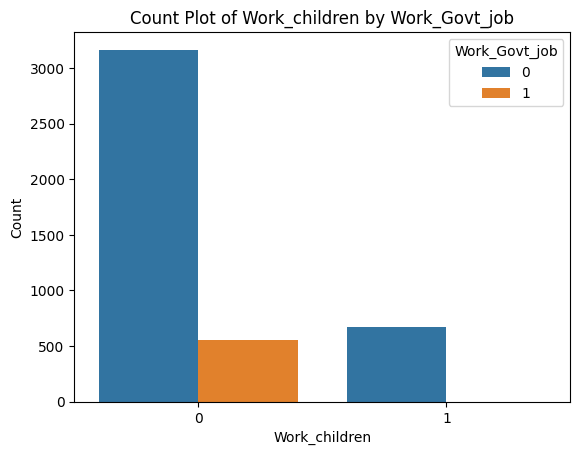

Pearson Correlation: -0.17925859227089655



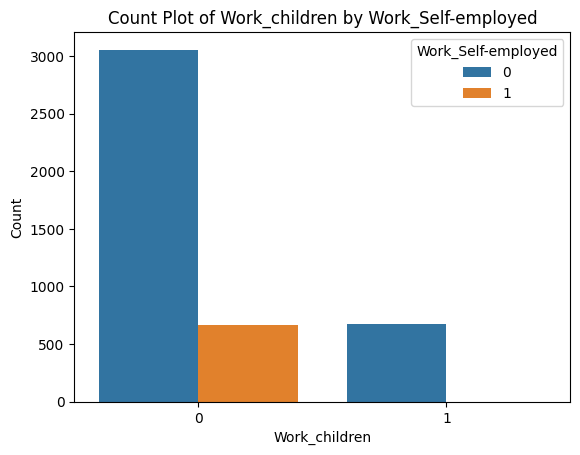

Pearson Correlation: -0.03021718376770996



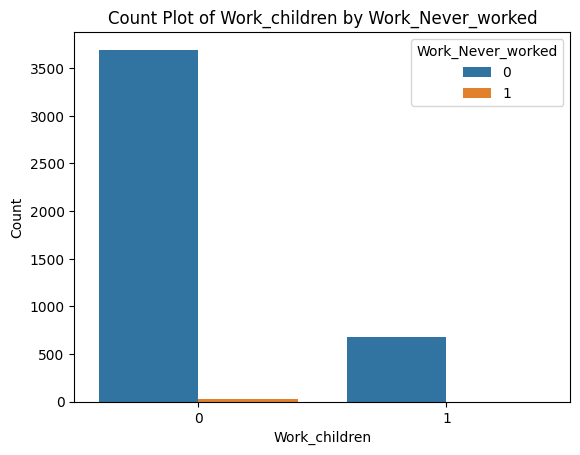

Pearson Correlation: -0.2546242843710483



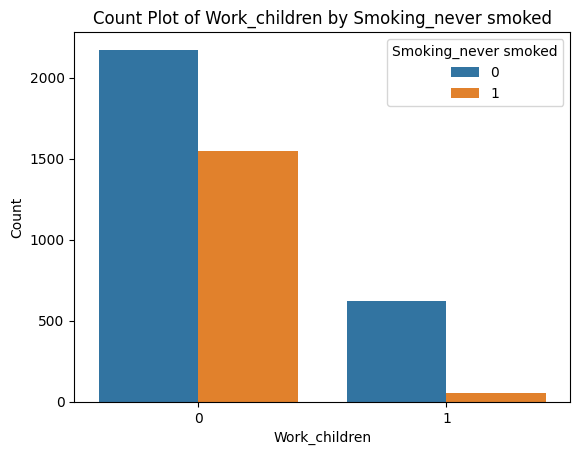

Pearson Correlation: 0.5287607131455585



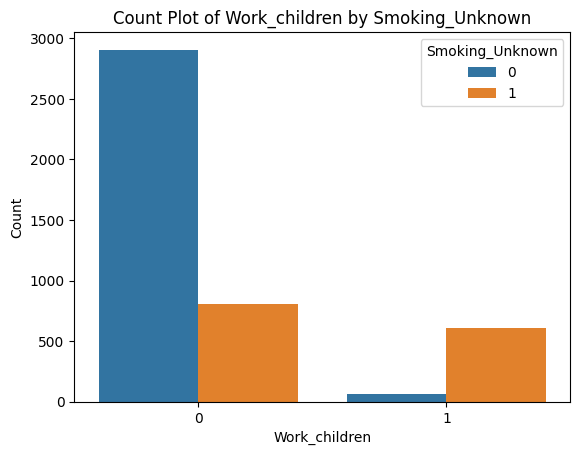

Pearson Correlation: -0.17893596797556632



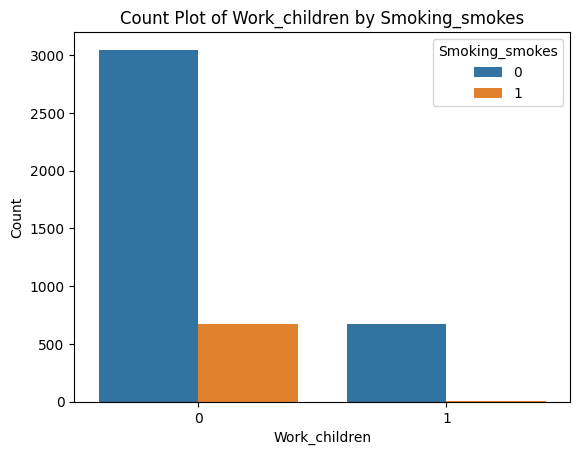

Pearson Correlation: -0.16436837759197134



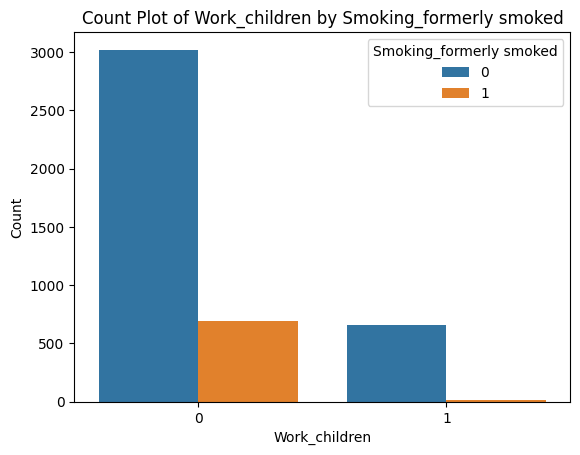

Pearson Correlation: -0.5472454593991949



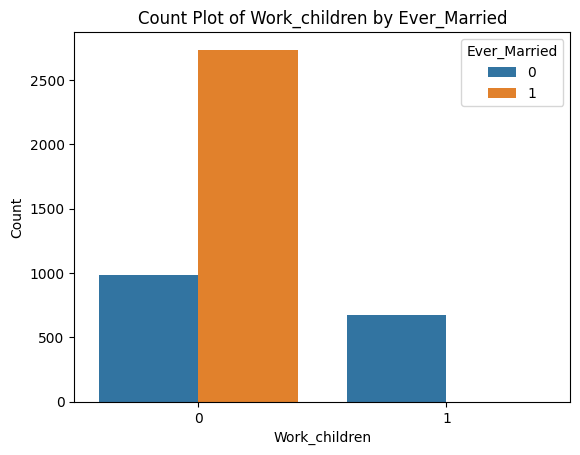

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Work_children' and i!='id':

    correlation = data[i].corr(data['Work_children'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Work_children', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Work_children')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Work_children', hue=i, data=data)
       plt.title('Count Plot of Work_children by '+ i)
       plt.xlabel('Work_children')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()


# Never Worked and All Variables

Pearson Correlation: -0.07780104800454121



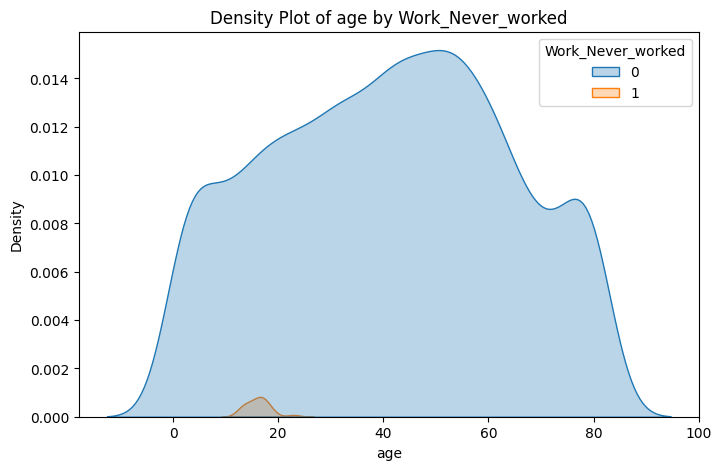

Pearson Correlation: -0.02009550123537025



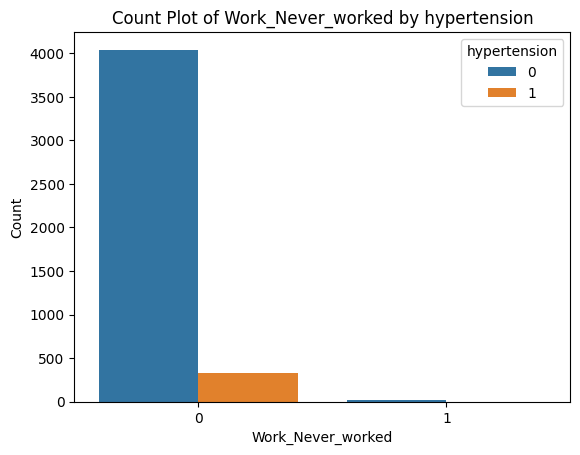

Pearson Correlation: -0.01432780884815642



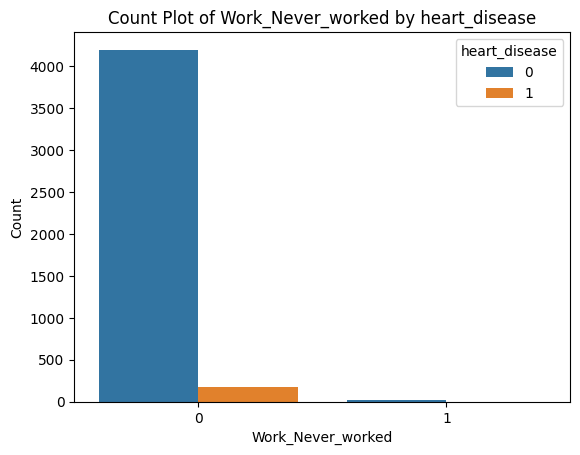

Pearson Correlation: 0.014297716719266959



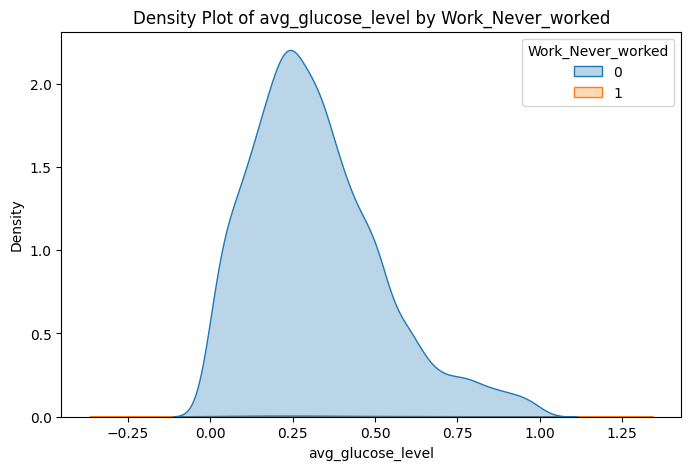

Pearson Correlation: -0.024505674986815384



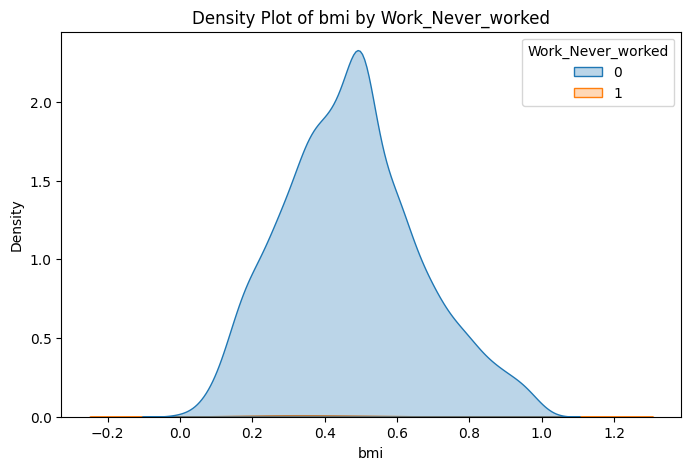

Pearson Correlation: -0.014021599036310022



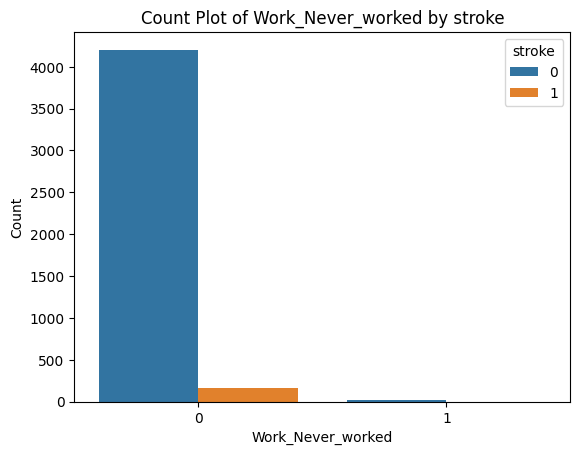

Pearson Correlation: -0.02469200402416148



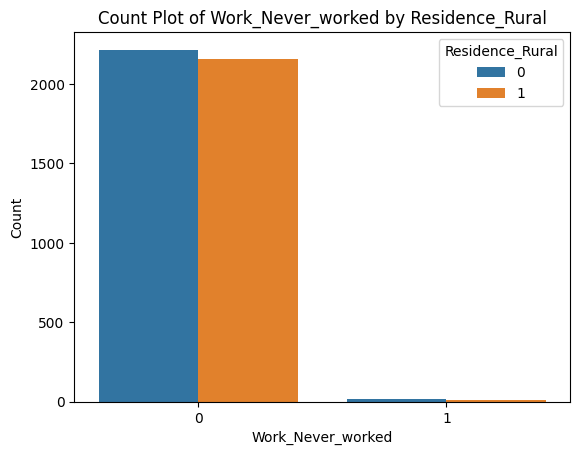

Pearson Correlation: 0.02469200402416148



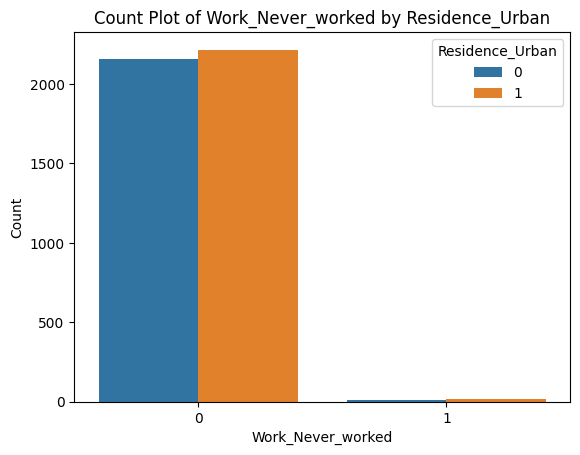

Pearson Correlation: 0.012995615302822743



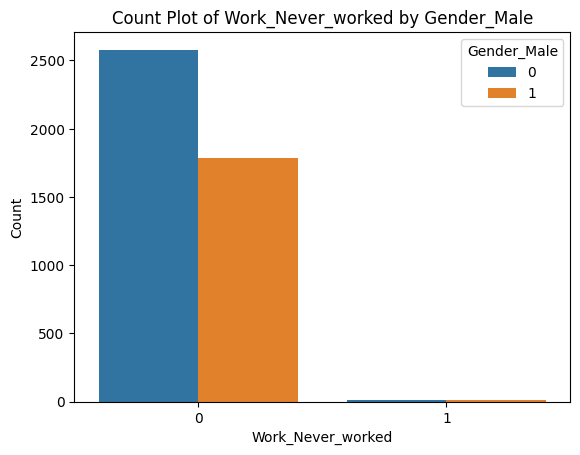

Pearson Correlation: -0.0129616588644965



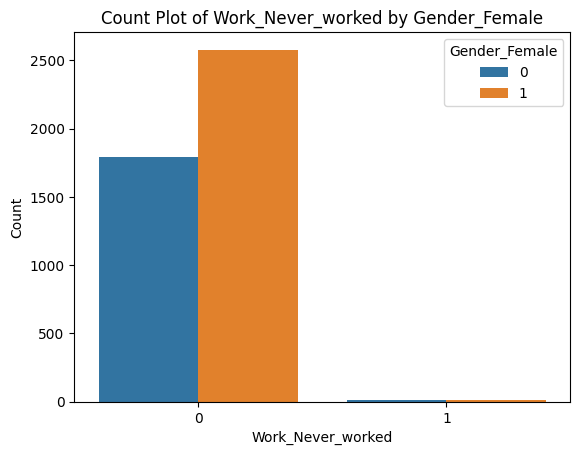

Pearson Correlation: -0.08091298857812257



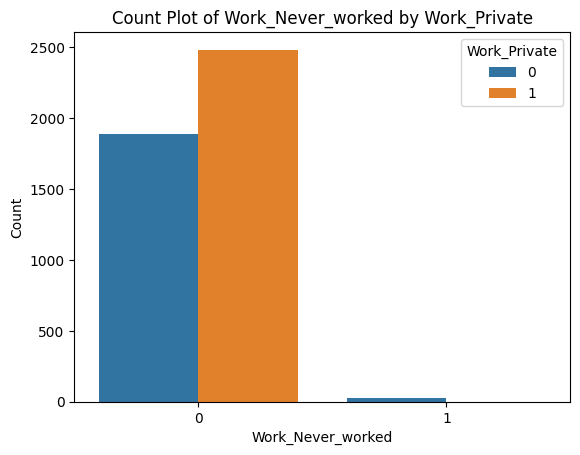

Pearson Correlation: -0.026907961700804468



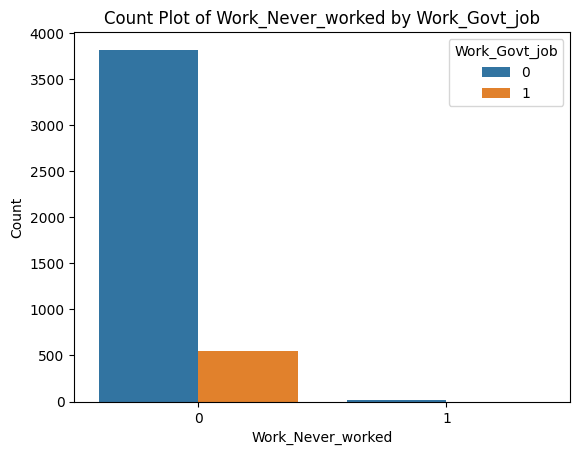

Pearson Correlation: -0.02987216035312097



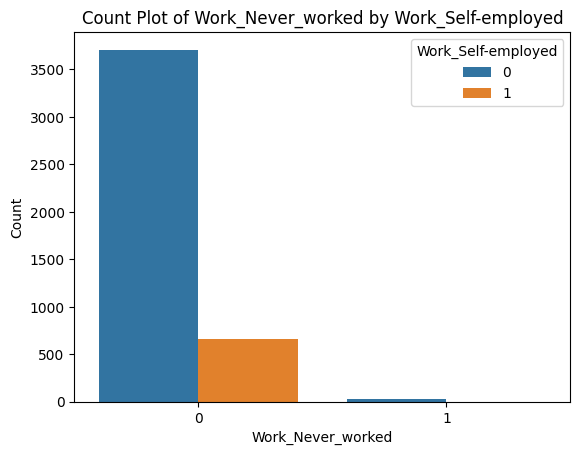

Pearson Correlation: -0.03021718376770996



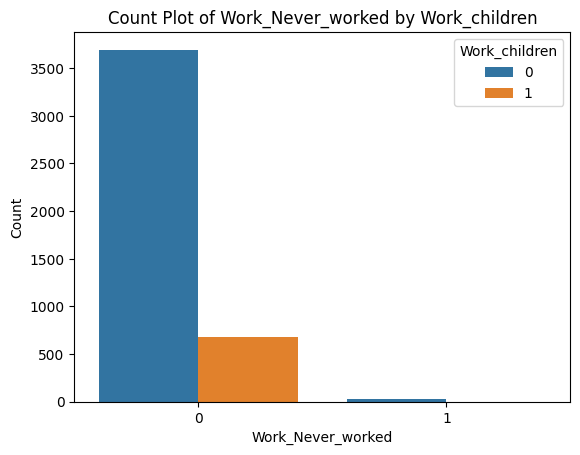

Pearson Correlation: 0.04029854335814927



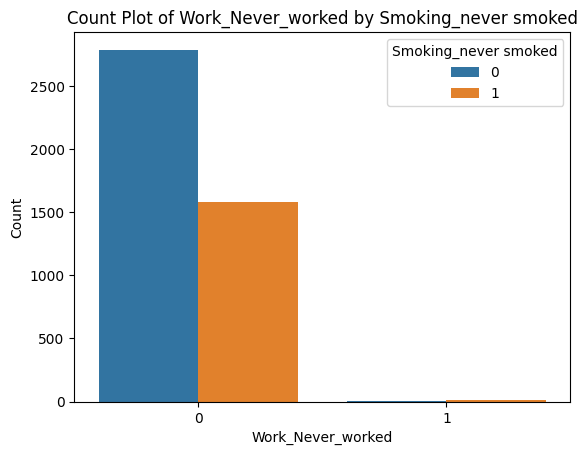

Pearson Correlation: 0.006176971198788289



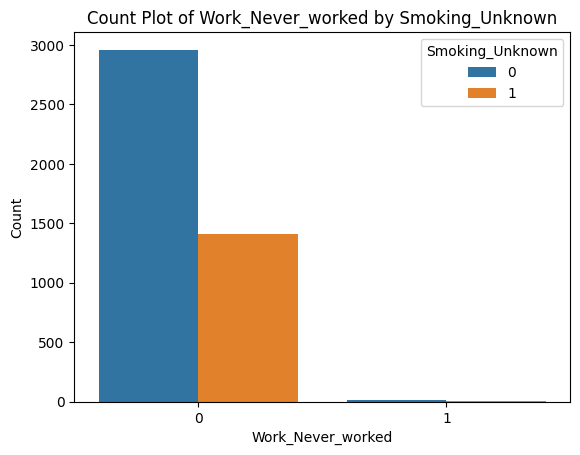

Pearson Correlation: -0.030111187583231475



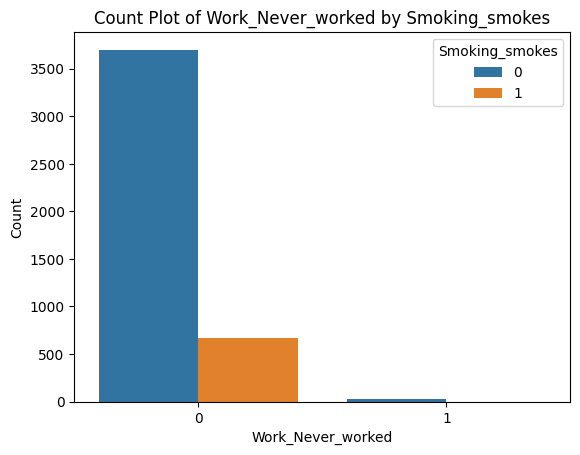

Pearson Correlation: -0.03111258438082945



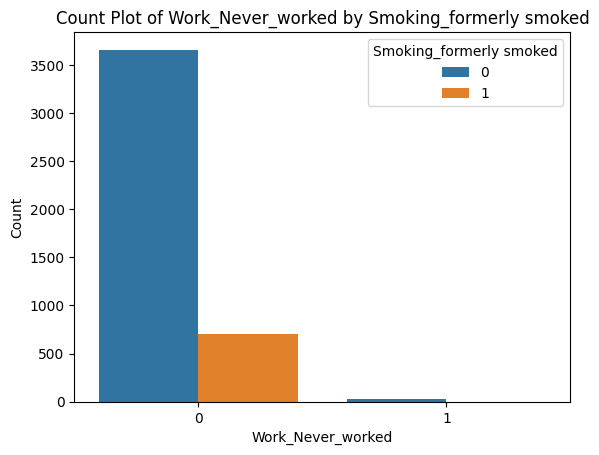

Pearson Correlation: -0.09119453583003594



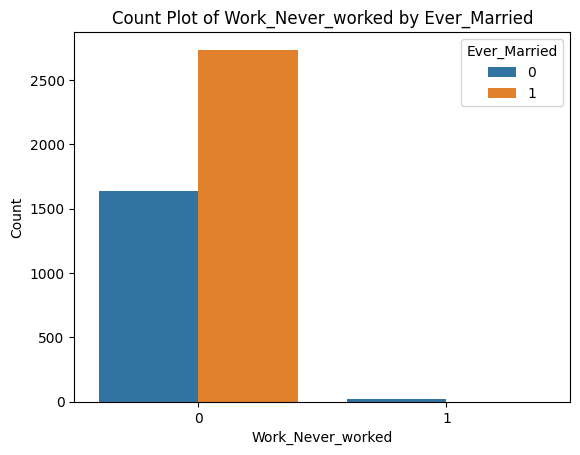

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Work_Never_worked' and i!='id':

    correlation = data[i].corr(data['Work_Never_worked'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Work_Never_worked', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Work_Never_worked')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Work_Never_worked', hue=i, data=data)
       plt.title('Count Plot of Work_Never_worked by '+ i)
       plt.xlabel('Work_Never_worked')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()


# Never Smoked and All Variables

Pearson Correlation: 0.1279161395582494



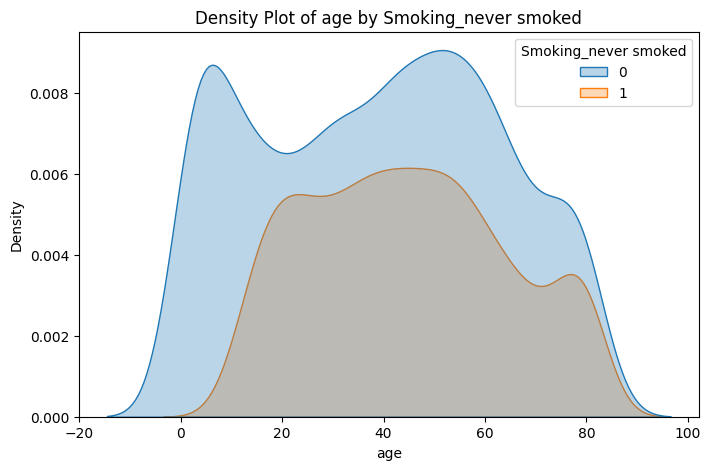

Pearson Correlation: 0.05523984325435023



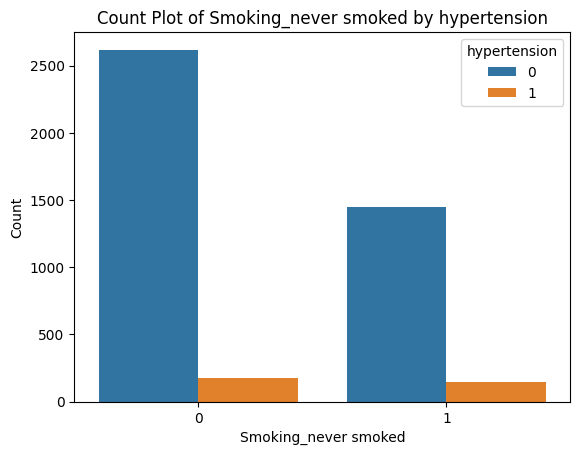

Pearson Correlation: -0.013370613590016582



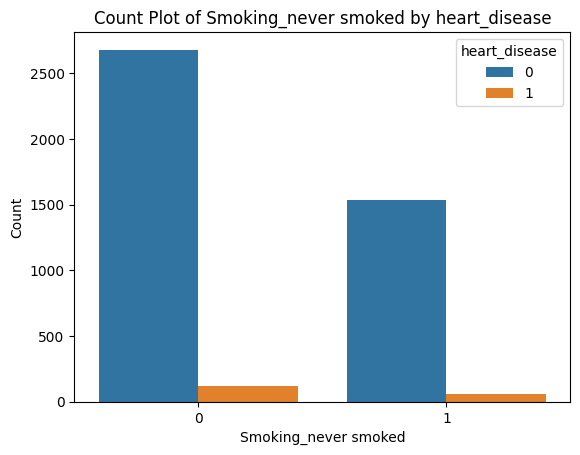

Pearson Correlation: -0.0033095630774196204



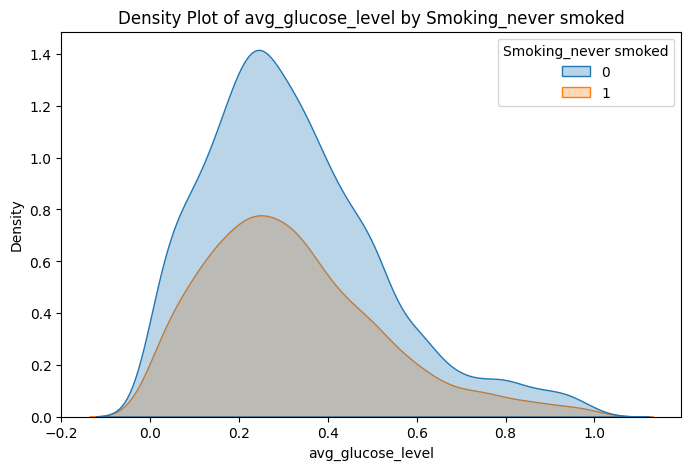

Pearson Correlation: 0.12430575469110851



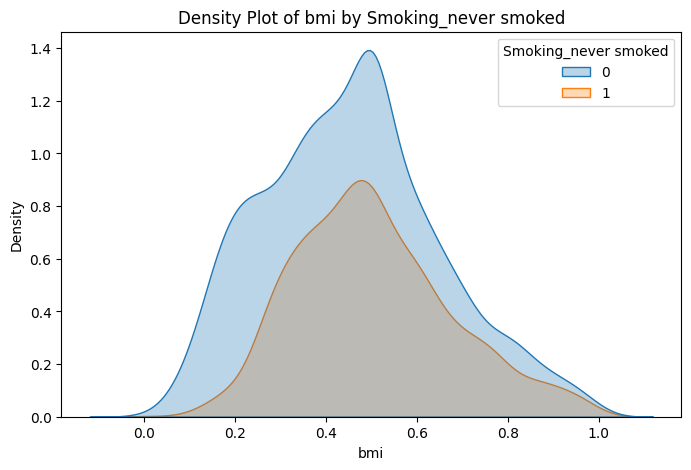

Pearson Correlation: -0.004818479021992111



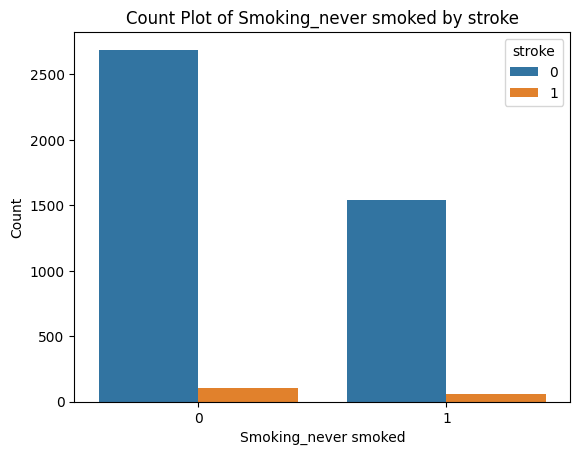

Pearson Correlation: 0.018026709625275177



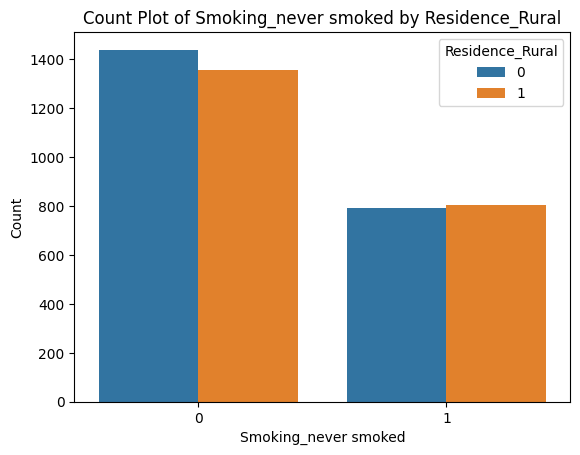

Pearson Correlation: -0.018026709625275177



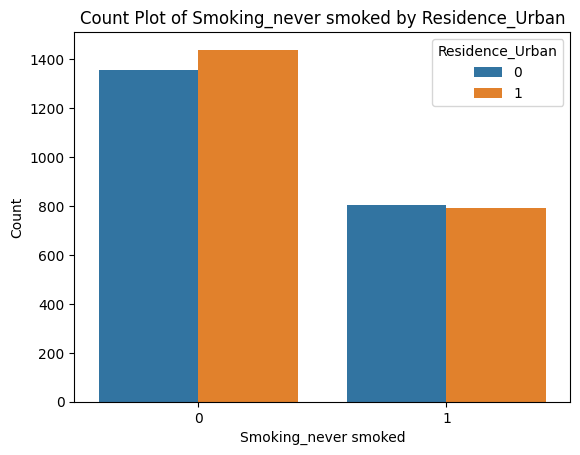

Pearson Correlation: -0.08938558669010452



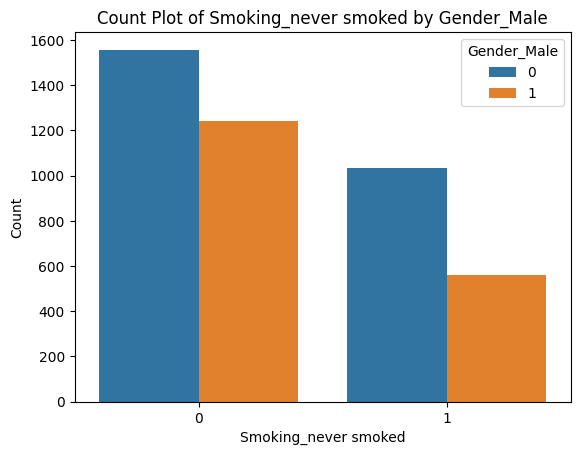

Pearson Correlation: 0.08972772471040519



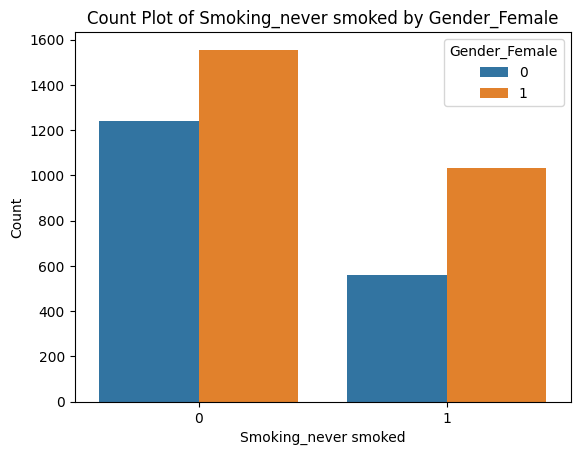

Pearson Correlation: 0.12745797425371935



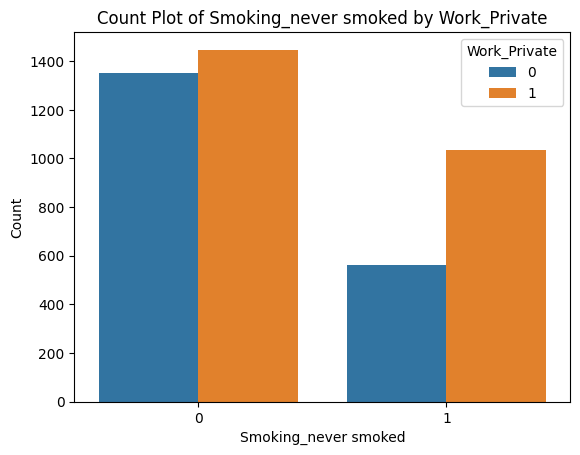

Pearson Correlation: 0.04355032751601406



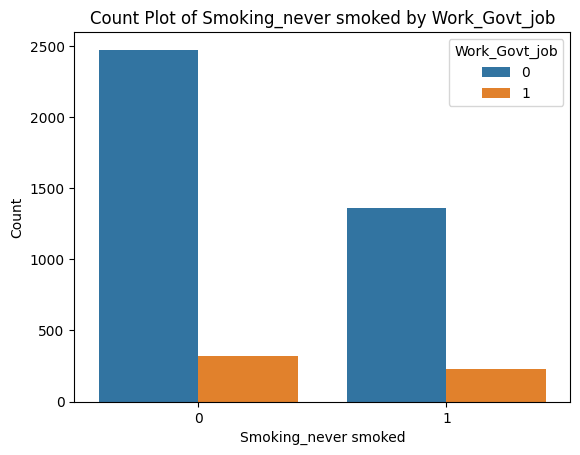

Pearson Correlation: 0.03164400620967565



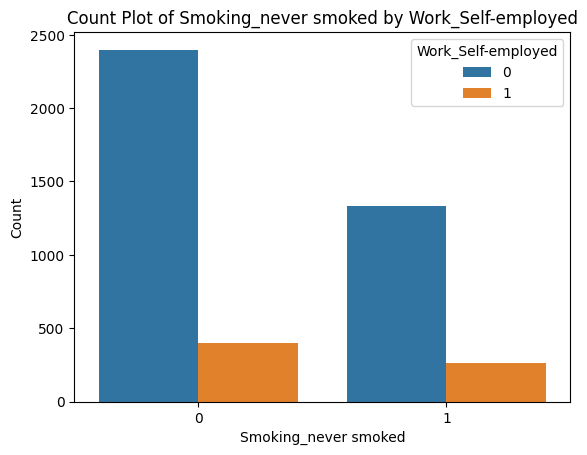

Pearson Correlation: -0.2546242843710483



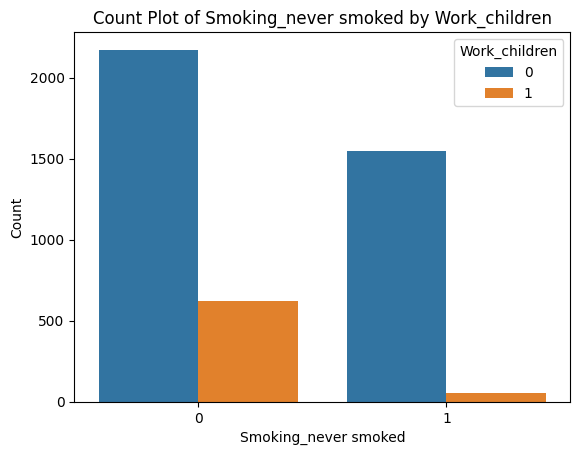

Pearson Correlation: 0.04029854335814928



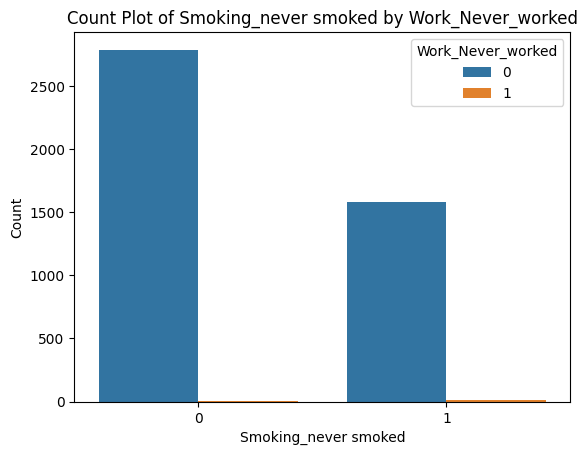

Pearson Correlation: -0.5216178214722434



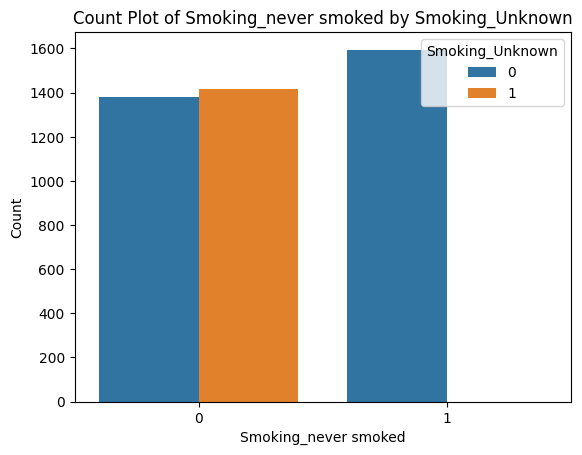

Pearson Correlation: -0.320493574223136



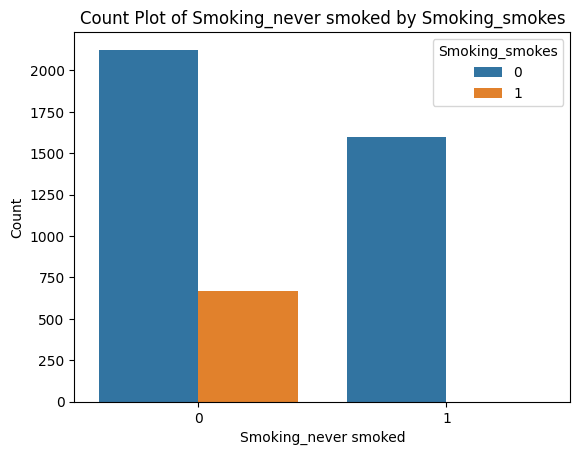

Pearson Correlation: -0.33115211228280705



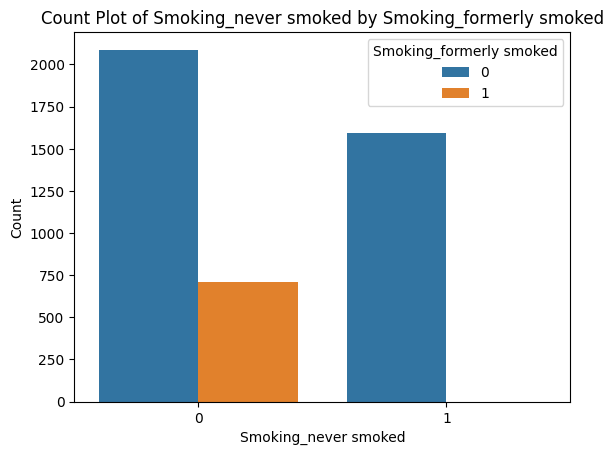

Pearson Correlation: 0.10896799253146872



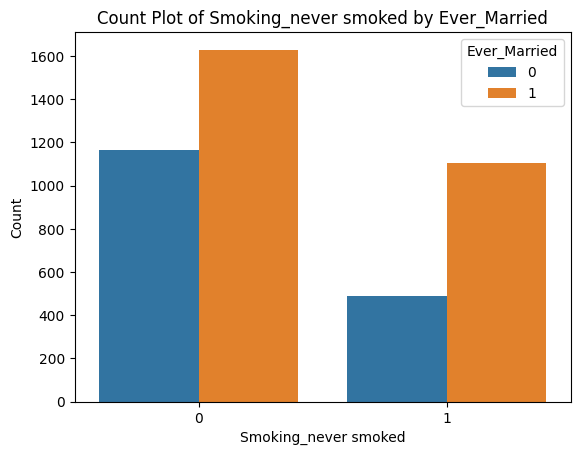

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Smoking_never smoked' and i!='id':

    correlation = data[i].corr(data['Smoking_never smoked'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Smoking_never smoked', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Smoking_never smoked')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Smoking_never smoked', hue=i, data=data)
       plt.title('Count Plot of Smoking_never smoked by '+ i)
       plt.xlabel('Smoking_never smoked')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()


# Smokes and All Variables

Pearson Correlation: 0.09593120600455926



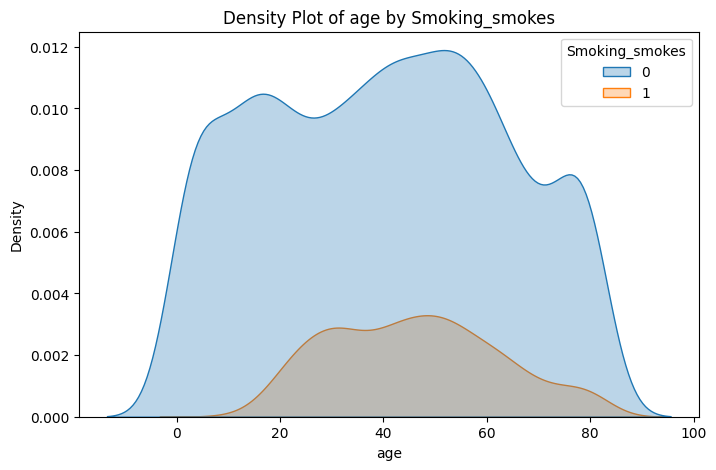

Pearson Correlation: 0.05135303762382945



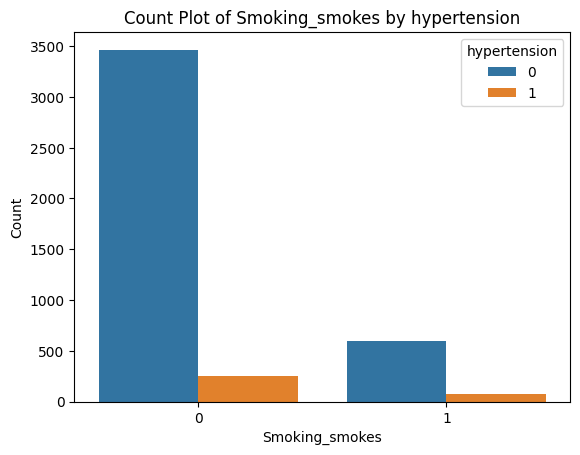

Pearson Correlation: 0.05143478046186324



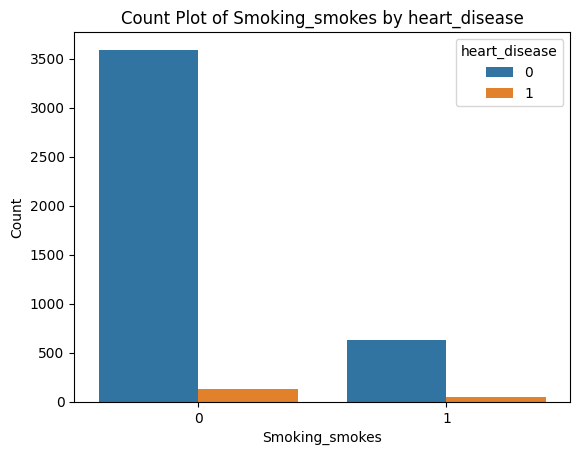

Pearson Correlation: 0.005398891644884235



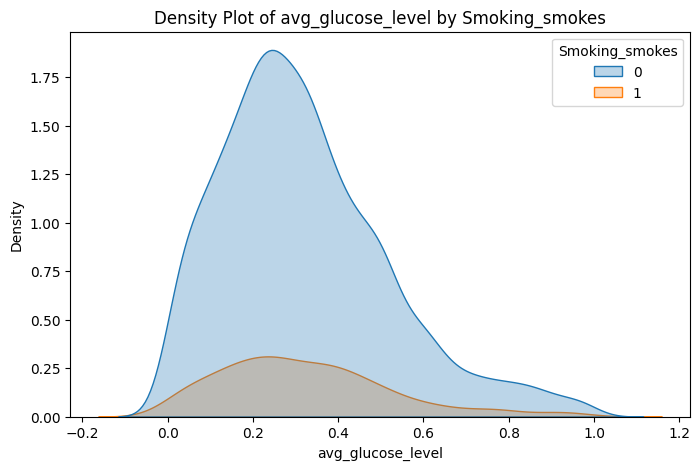

Pearson Correlation: 0.11218128532719697



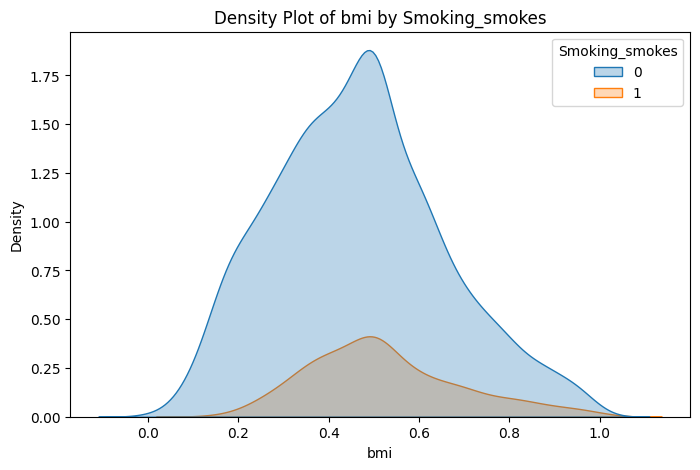

Pearson Correlation: 0.0027425494502516996



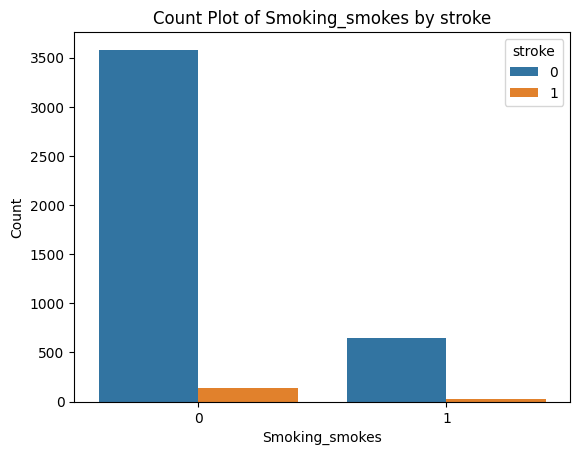

Pearson Correlation: -0.030069117735427378



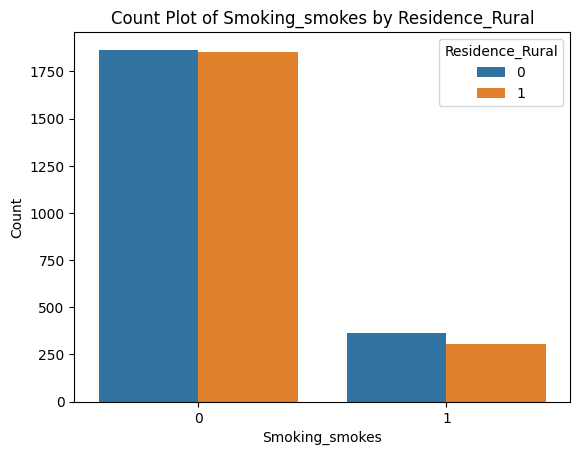

Pearson Correlation: 0.030069117735427378



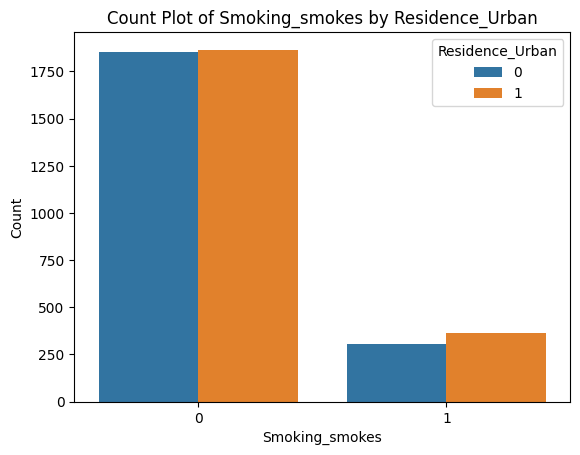

Pearson Correlation: 0.018475511058651382



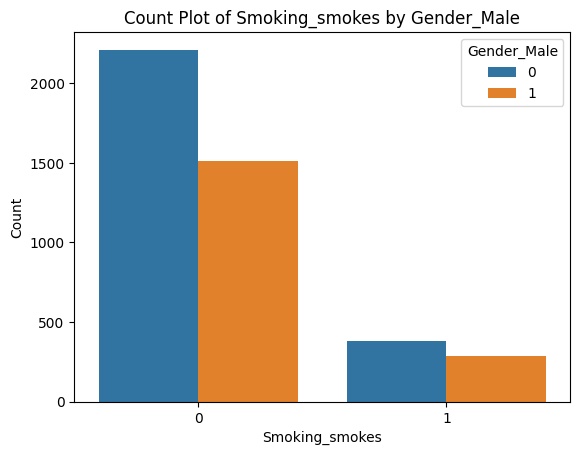

Pearson Correlation: -0.018277474402958797



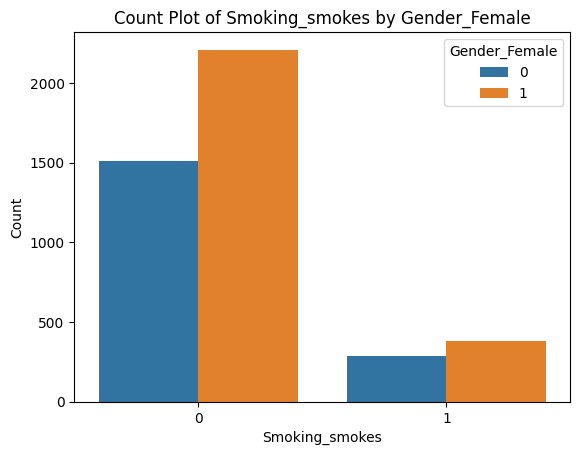

Pearson Correlation: 0.10895876645613335



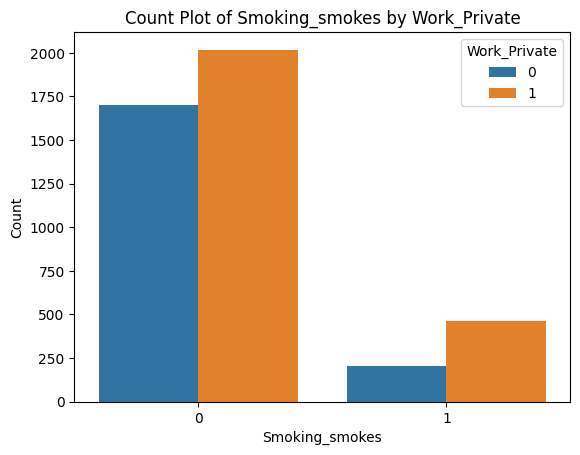

Pearson Correlation: 0.04159482650004109



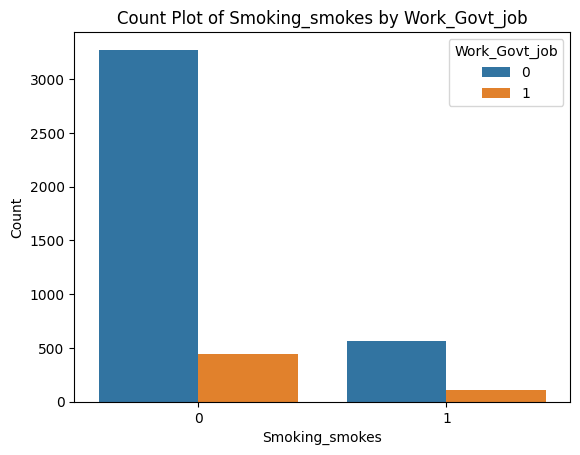

Pearson Correlation: -0.003291705672231734



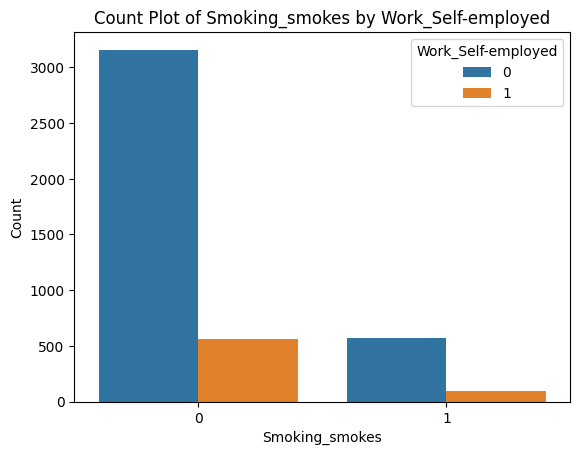

Pearson Correlation: -0.17893596797556635



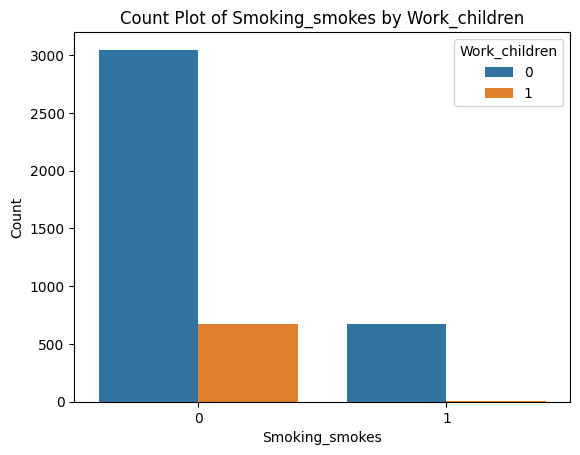

Pearson Correlation: -0.030111187583231478



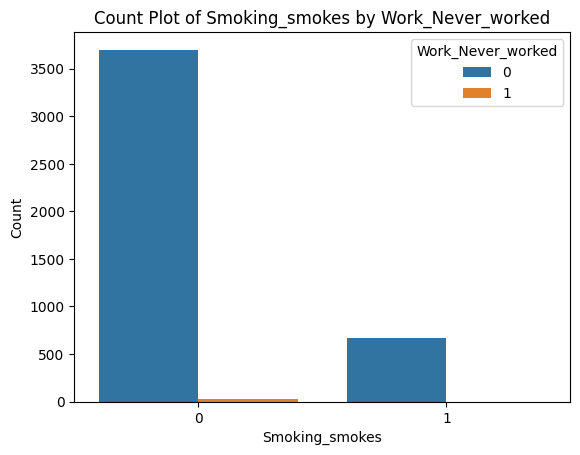

Pearson Correlation: -0.320493574223136



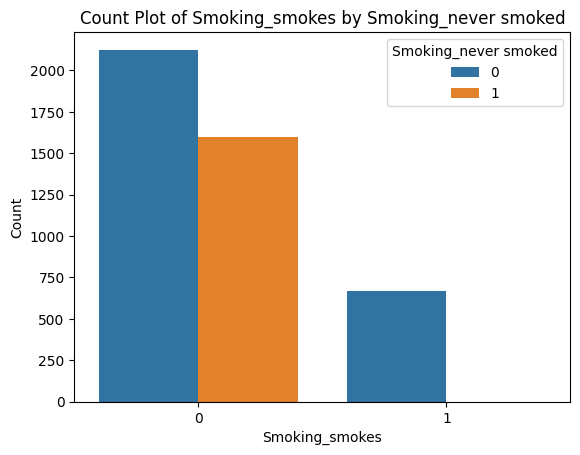

Pearson Correlation: -0.2930543870282264



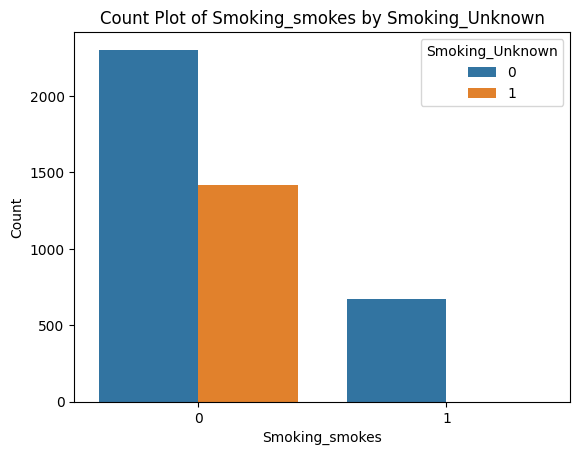

Pearson Correlation: -0.18604728458899988



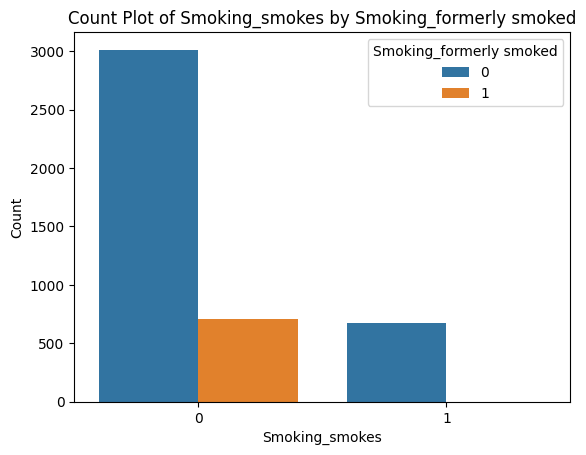

Pearson Correlation: 0.11849531858498331



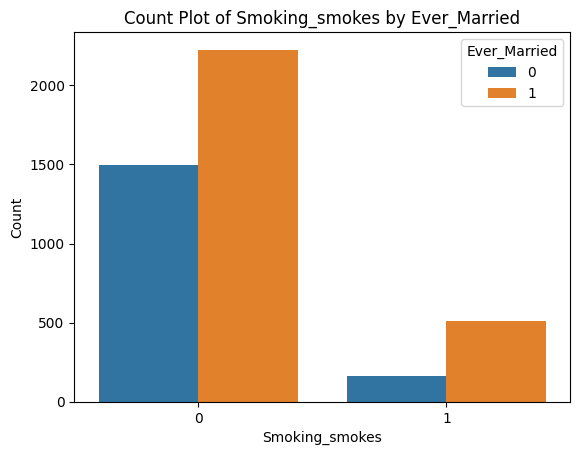

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Smoking_smokes' and i!='id':

    correlation = data[i].corr(data['Smoking_smokes'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Smoking_smokes', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Smoking_smokes')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Smoking_smokes', hue=i, data=data)
       plt.title('Count Plot of Smoking_smokes by '+ i)
       plt.xlabel('Smoking_smokes')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()


# Formerly Smokes and All Variables

Pearson Correlation: 0.23206757396856084



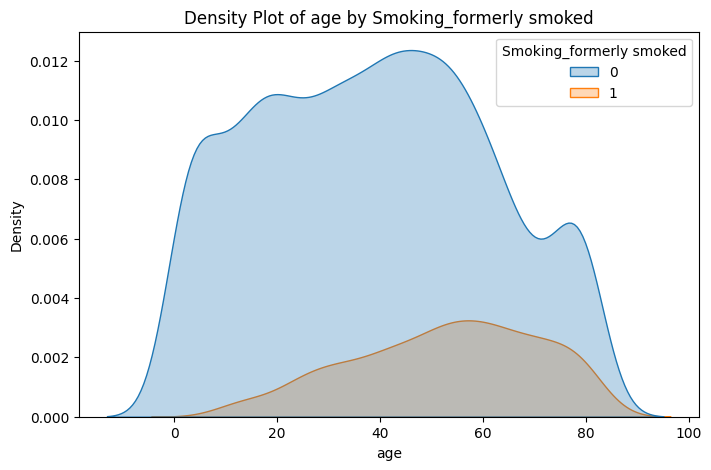

Pearson Correlation: 0.045910966000592385



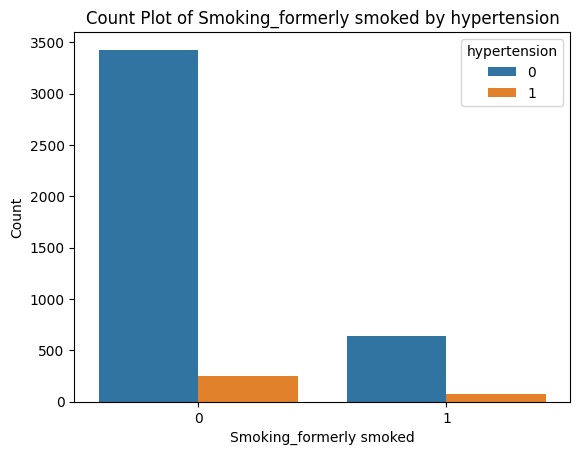

Pearson Correlation: 0.04873355534085961



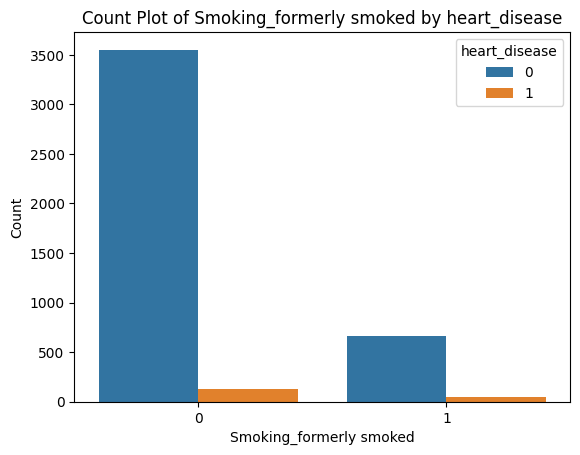

Pearson Correlation: -0.01702966809443245



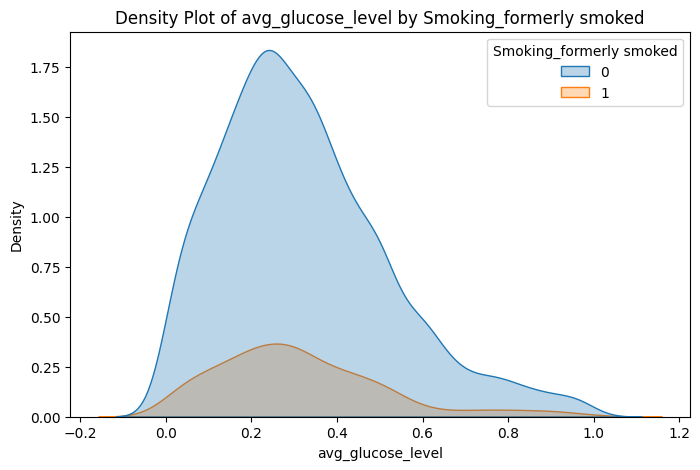

Pearson Correlation: 0.11461301402104793



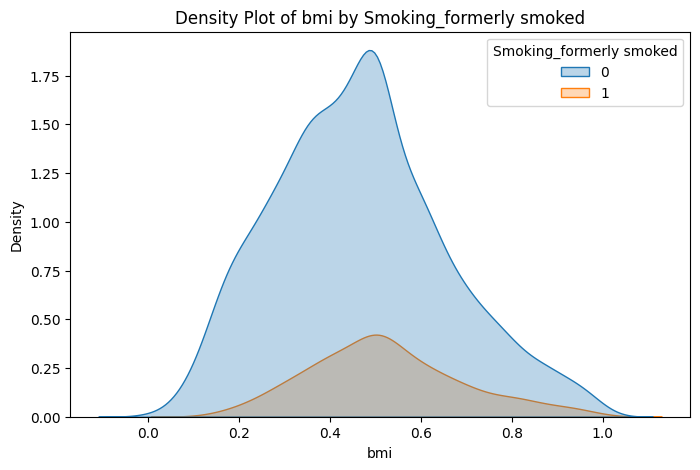

Pearson Correlation: 0.0664163998001853



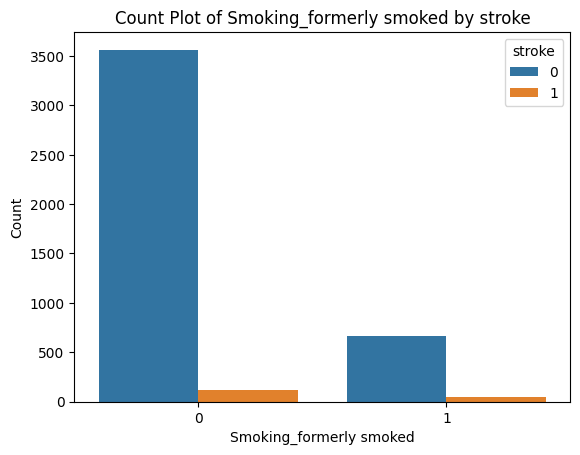

Pearson Correlation: -0.0005416315143669108



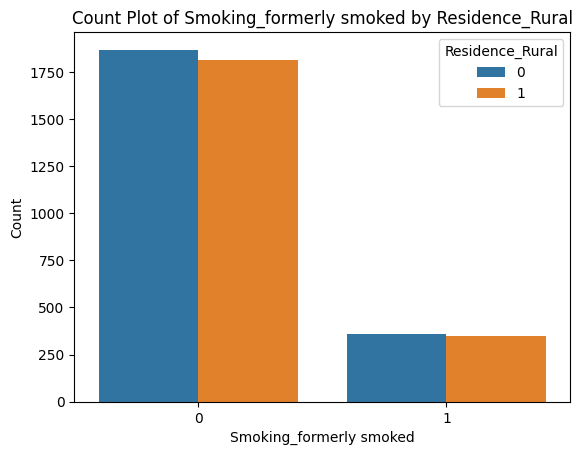

Pearson Correlation: 0.0005416315143669108



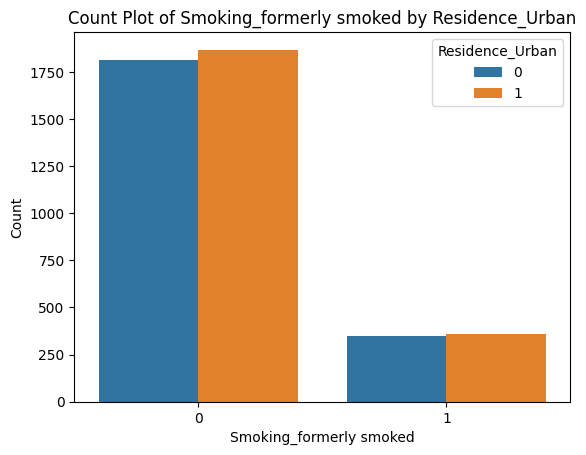

Pearson Correlation: 0.016079270630524525



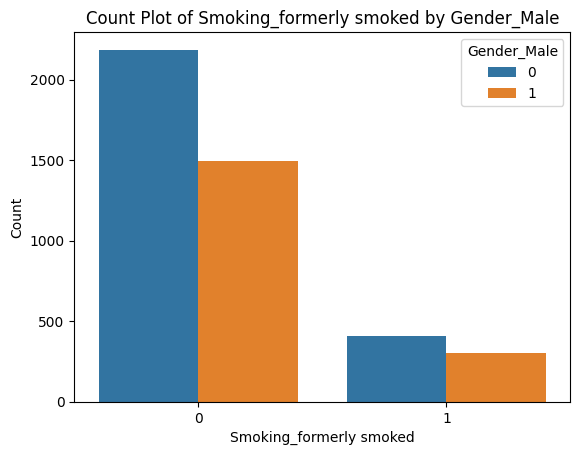

Pearson Correlation: -0.01713394197749201



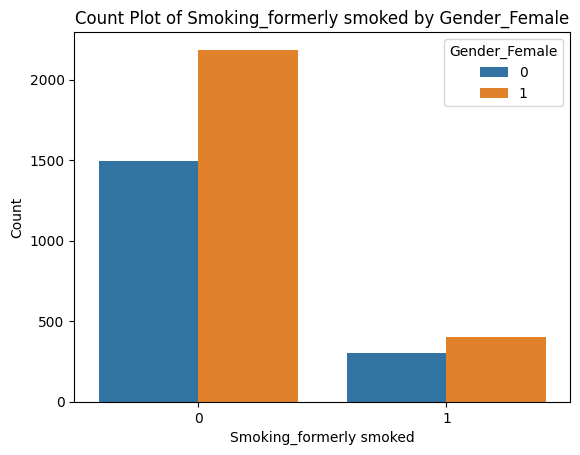

Pearson Correlation: 0.0347348851284011



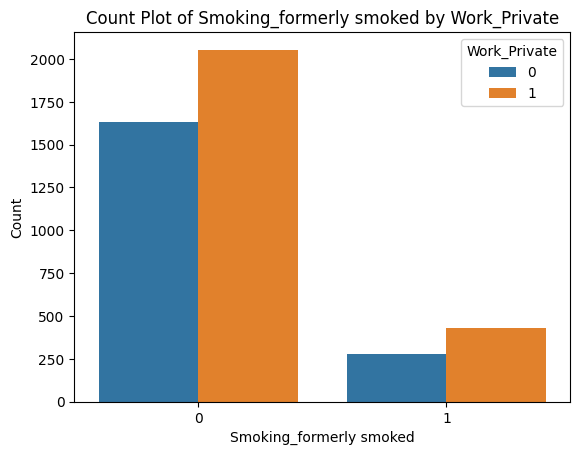

Pearson Correlation: 0.03174807213695434



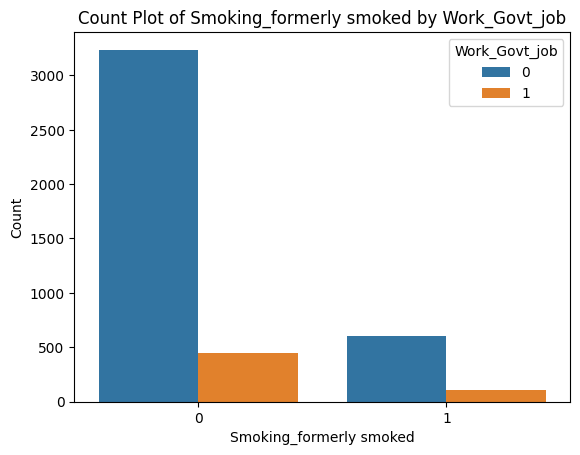

Pearson Correlation: 0.09424493688966236



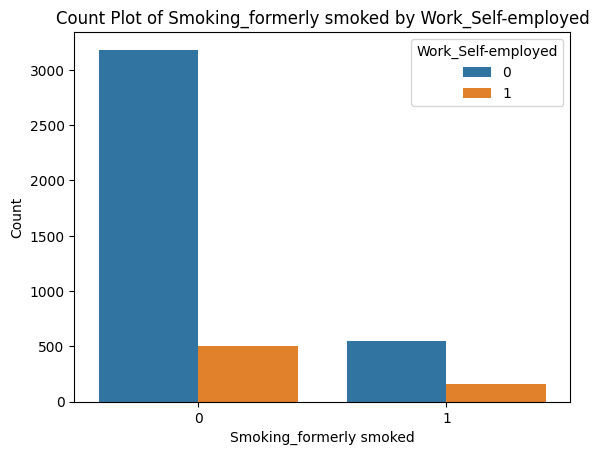

Pearson Correlation: -0.16436837759197134



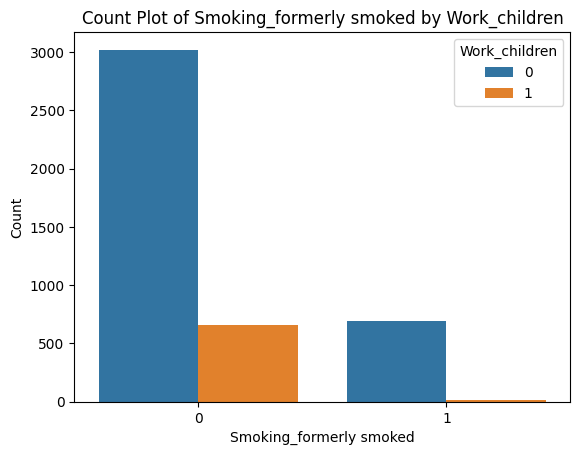

Pearson Correlation: -0.031112584380829453



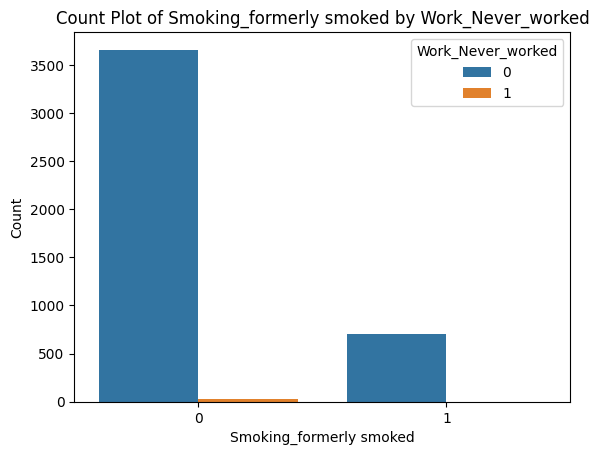

Pearson Correlation: -0.33115211228280705



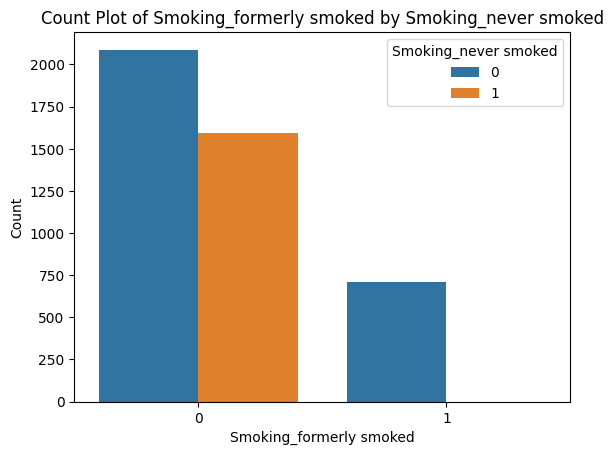

Pearson Correlation: -0.3028003900339517



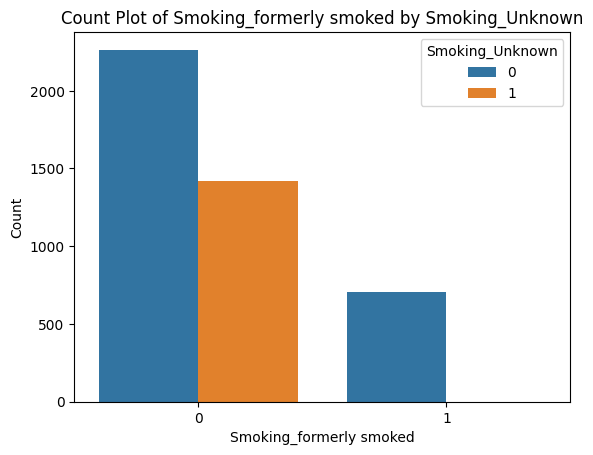

Pearson Correlation: -0.1860472845889999



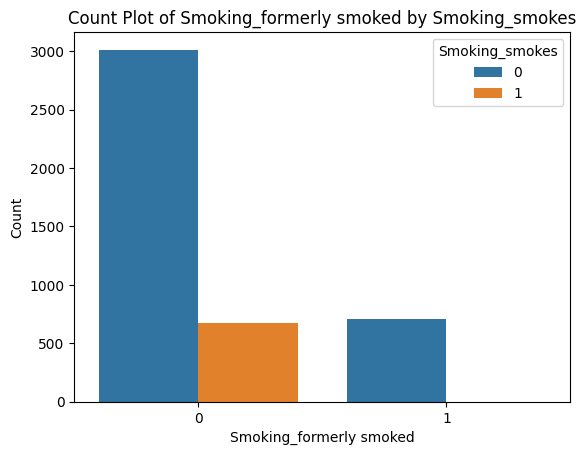

Pearson Correlation: 0.17634077868028383



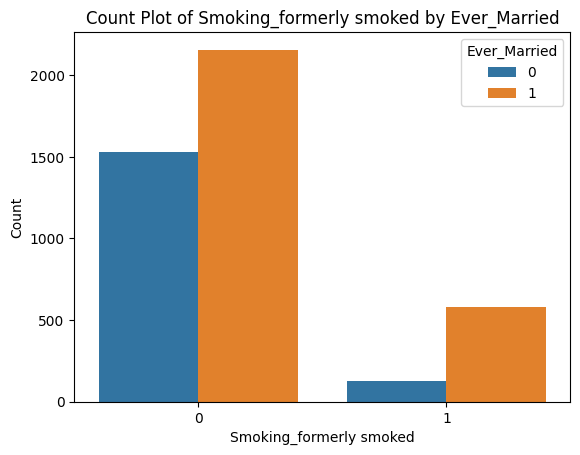

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Smoking_formerly smoked' and i!='id':

    correlation = data[i].corr(data['Smoking_formerly smoked'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Smoking_formerly smoked', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Smoking_formerly smoked')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Smoking_formerly smoked', hue=i, data=data)
       plt.title('Count Plot of Smoking_formerly smoked by '+ i)
       plt.xlabel('Smoking_formerly smoked')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()


# Unknown Smoker and All Variables

Pearson Correlation: -0.3878505795536403



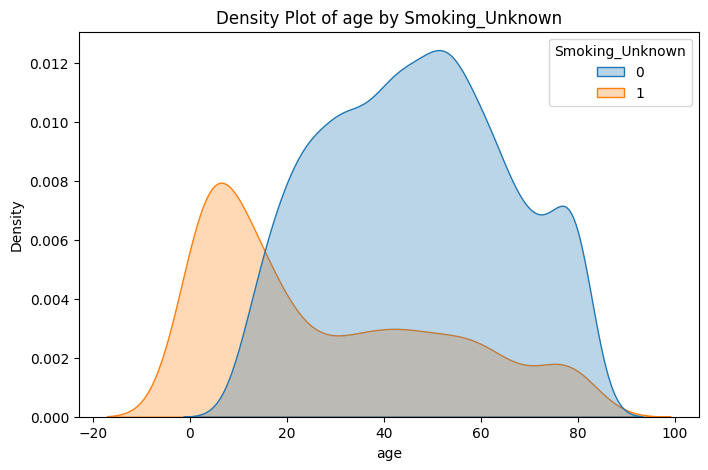

Pearson Correlation: -0.13241391169949393



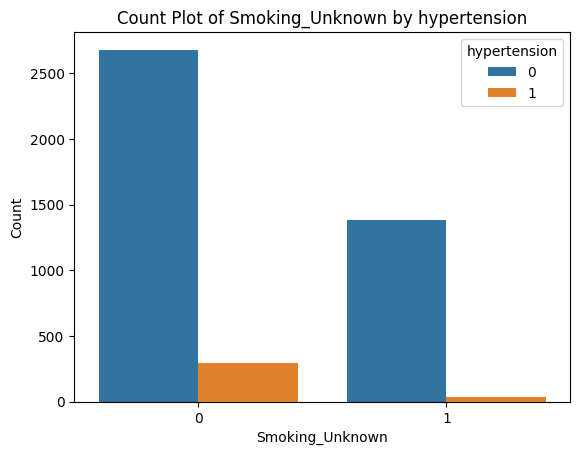

Pearson Correlation: -0.06412932613525626



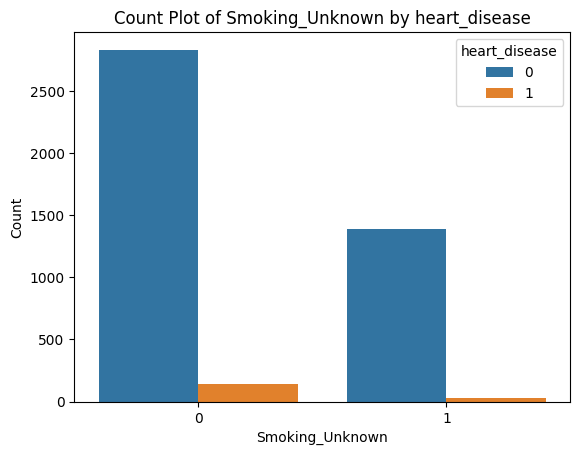

Pearson Correlation: 0.012645473627567575



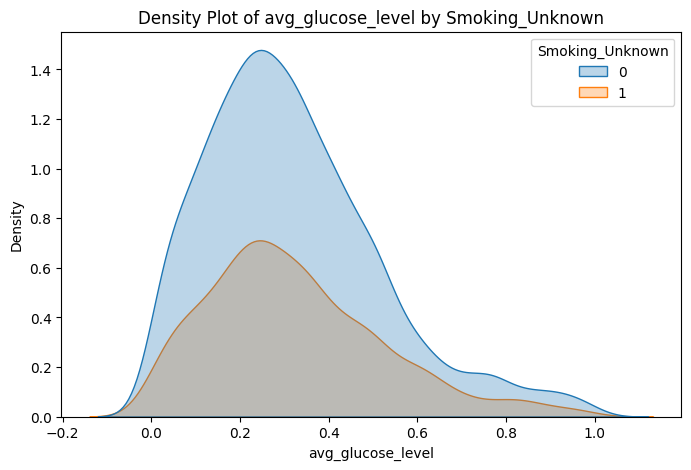

Pearson Correlation: -0.30425924939107835



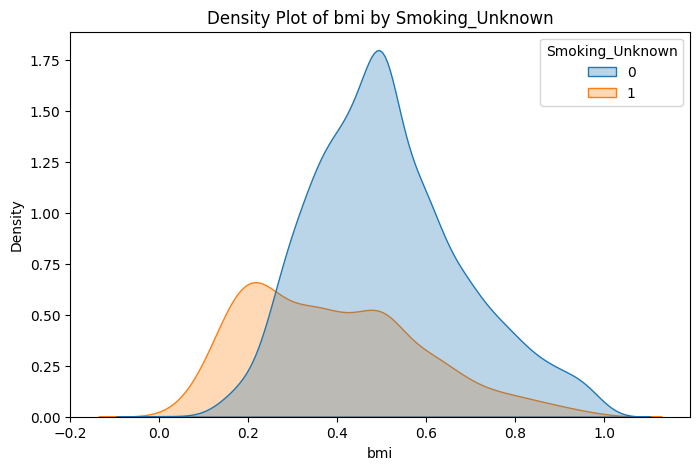

Pearson Correlation: -0.049387614067414



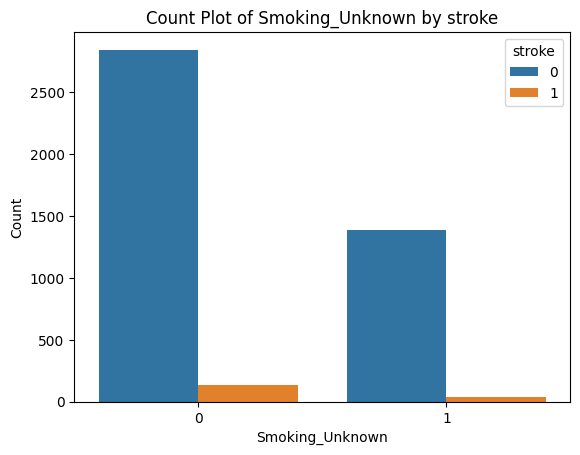

Pearson Correlation: 0.005008554155560693



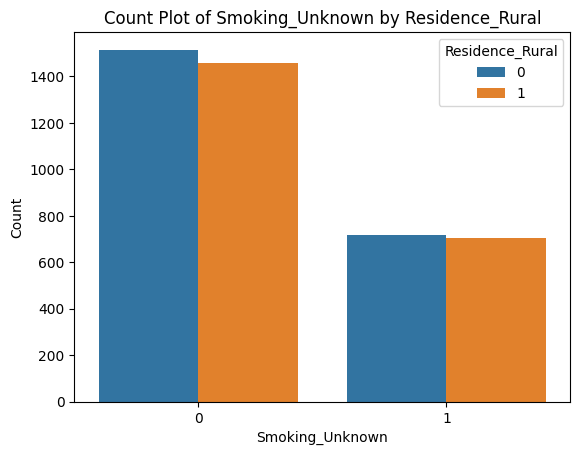

Pearson Correlation: -0.005008554155560693



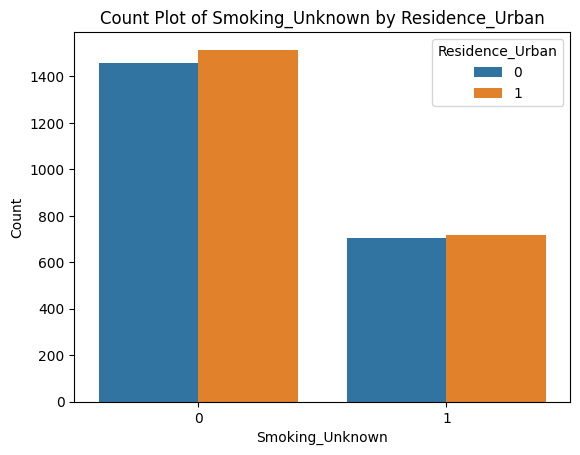

Pearson Correlation: 0.06508129487250847



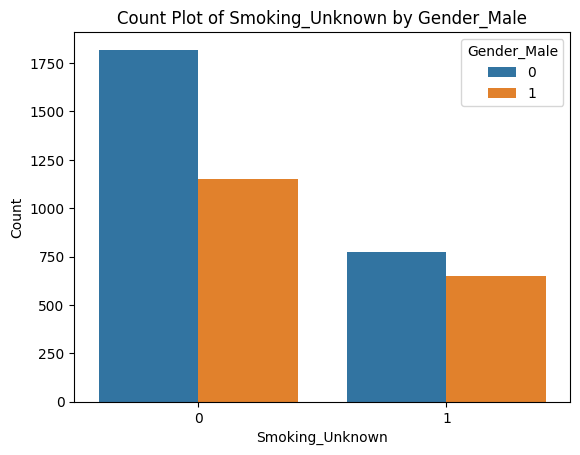

Pearson Correlation: -0.06475601631386571



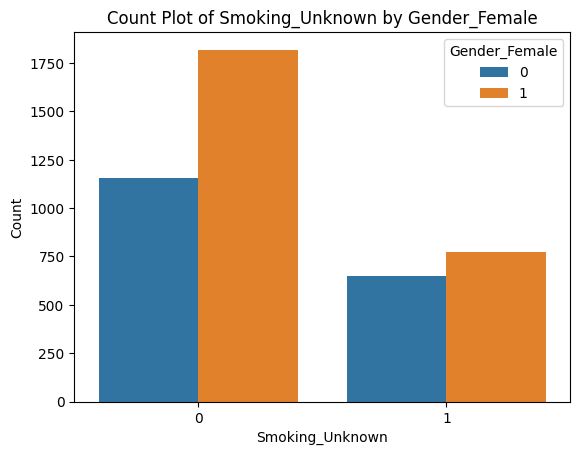

Pearson Correlation: -0.2422015105418057



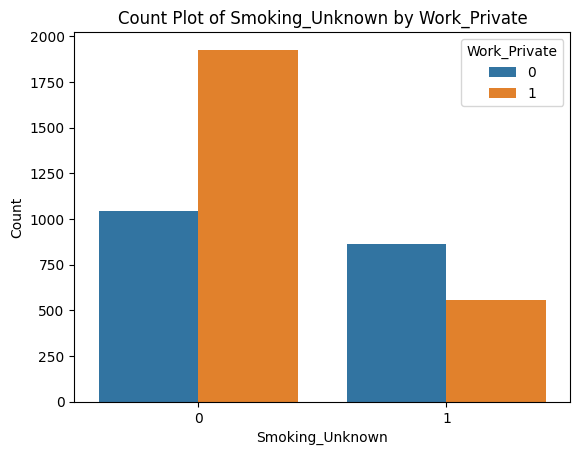

Pearson Correlation: -0.1017481526175152



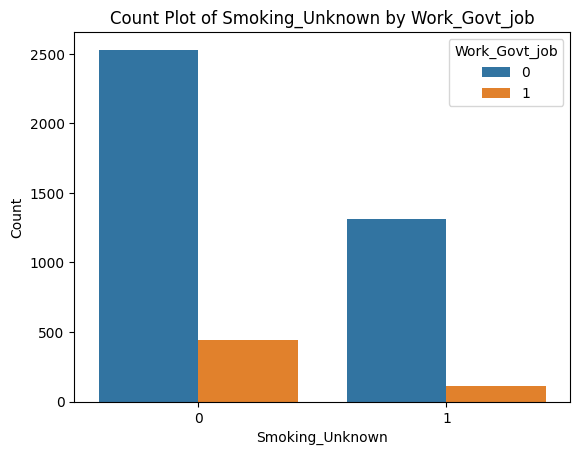

Pearson Correlation: -0.10413596080195116



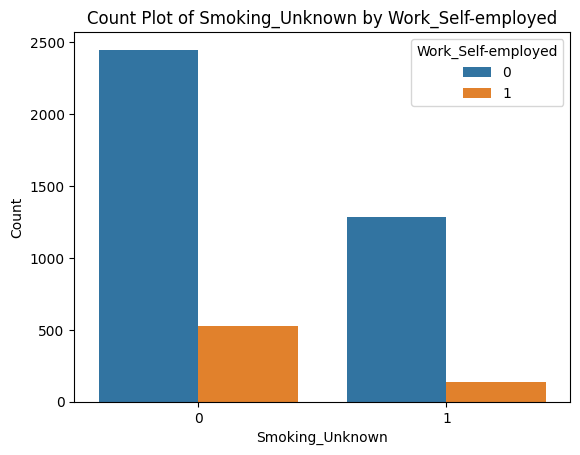

Pearson Correlation: 0.5287607131455585



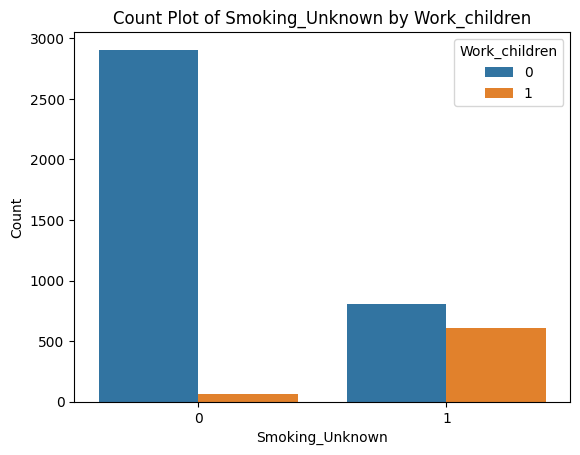

Pearson Correlation: 0.006176971198788289



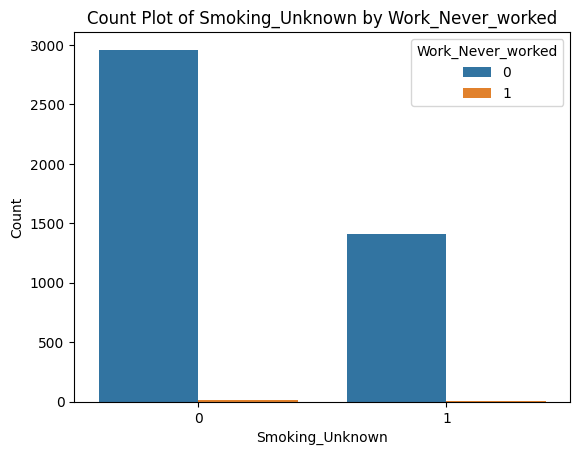

Pearson Correlation: -0.5216178214722434



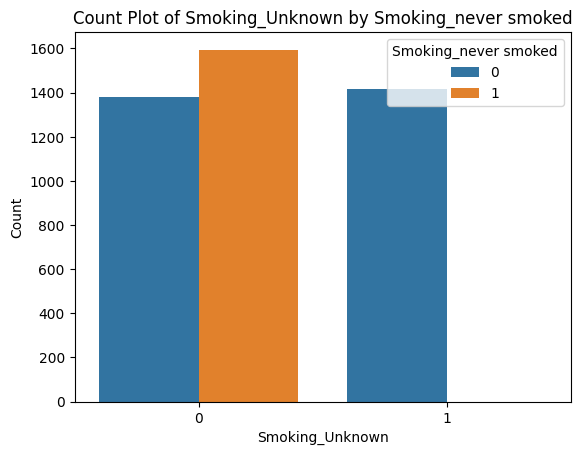

Pearson Correlation: -0.2930543870282264



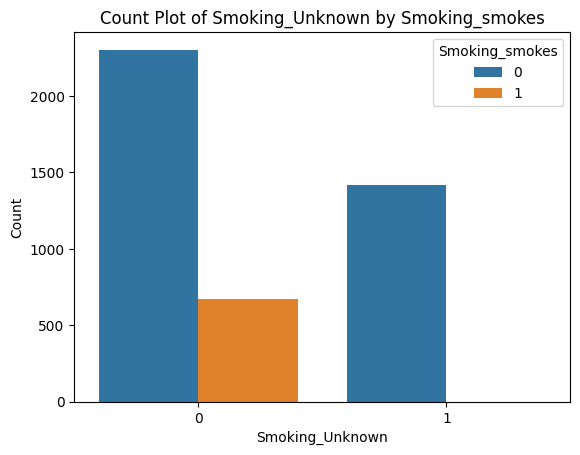

Pearson Correlation: -0.30280039003395176



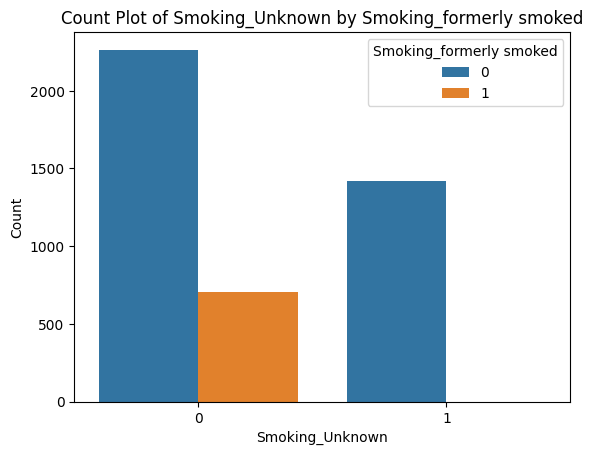

Pearson Correlation: -0.3418865909337502



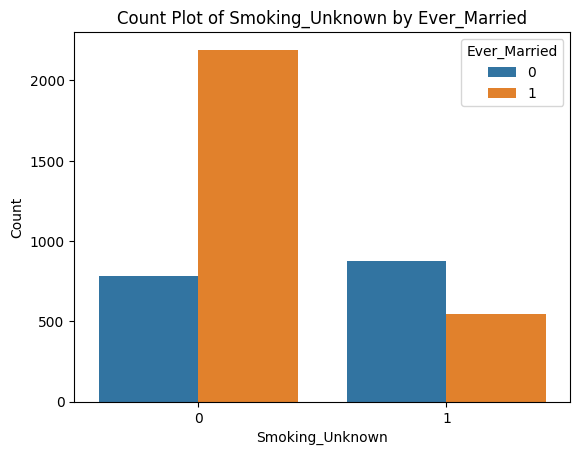

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Smoking_Unknown' and i!='id':

    correlation = data[i].corr(data['Smoking_Unknown'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Smoking_Unknown', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Smoking_Unknown')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Smoking_Unknown', hue=i, data=data)
       plt.title('Count Plot of Smoking_Unknown by '+ i)
       plt.xlabel('Smoking_Unknown')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()


# Married and All Variables

Pearson Correlation: 0.6847667141492818



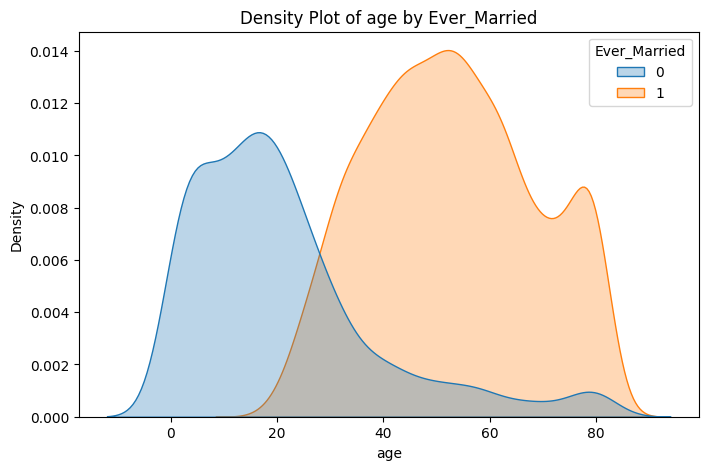

Pearson Correlation: 0.1504581341704331



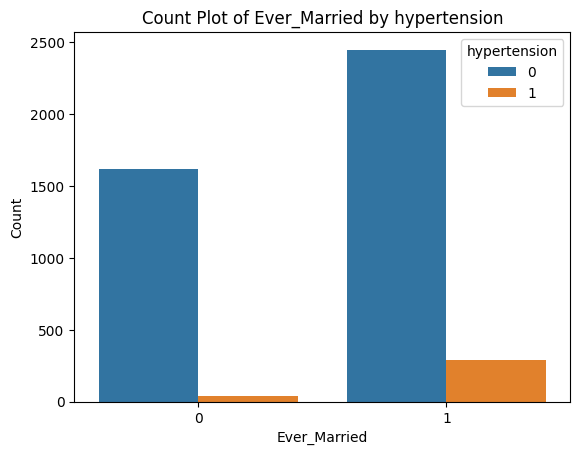

Pearson Correlation: 0.10624923590357183



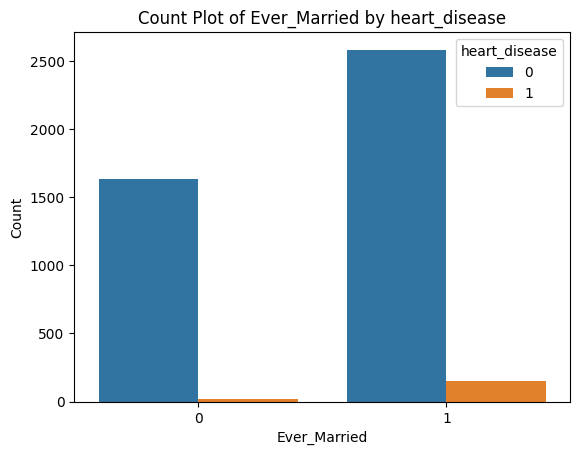

Pearson Correlation: -0.005516667091859521



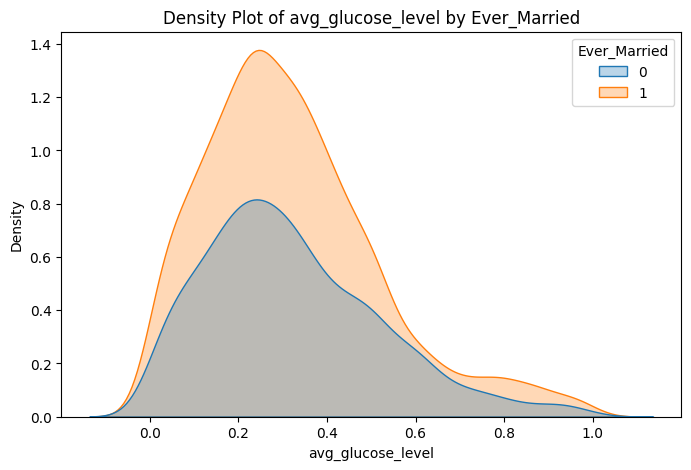

Pearson Correlation: 0.37180212121754974



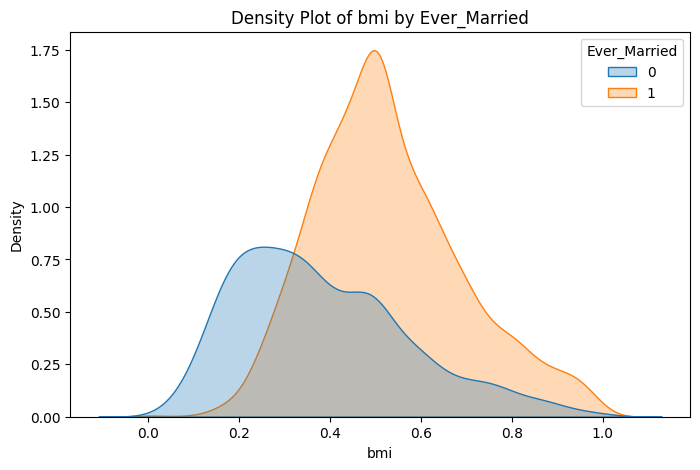

Pearson Correlation: 0.09445420992554551



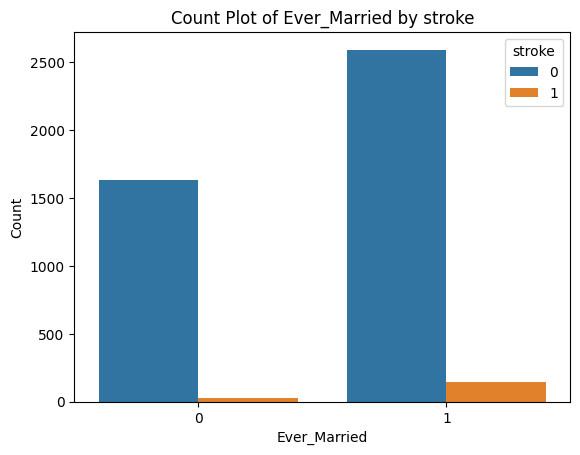

Pearson Correlation: -1.0488356327736105e-05



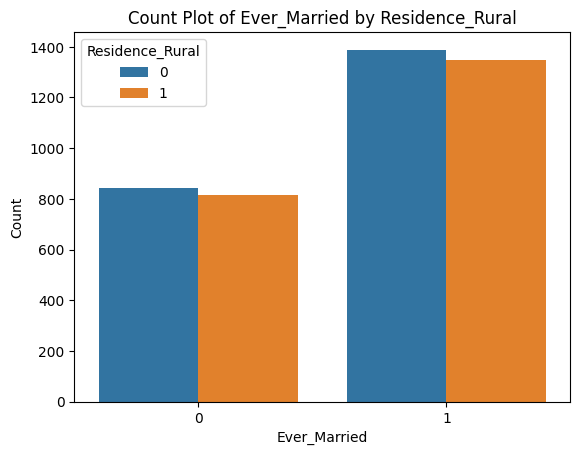

Pearson Correlation: 1.0488356327736105e-05



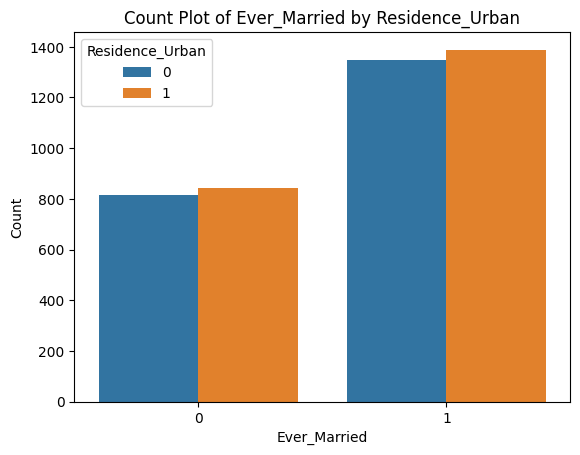

Pearson Correlation: -0.04505365234309056



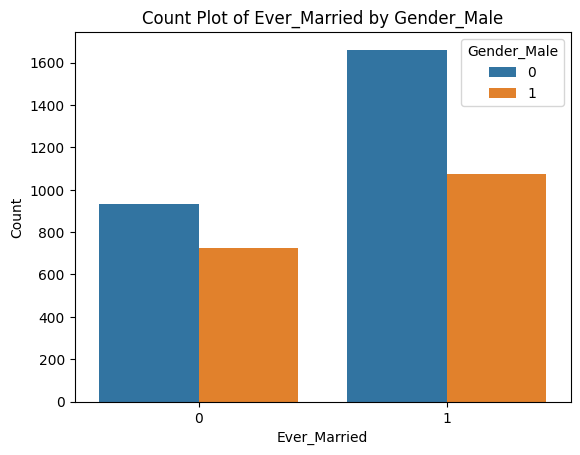

Pearson Correlation: 0.04564487098490414



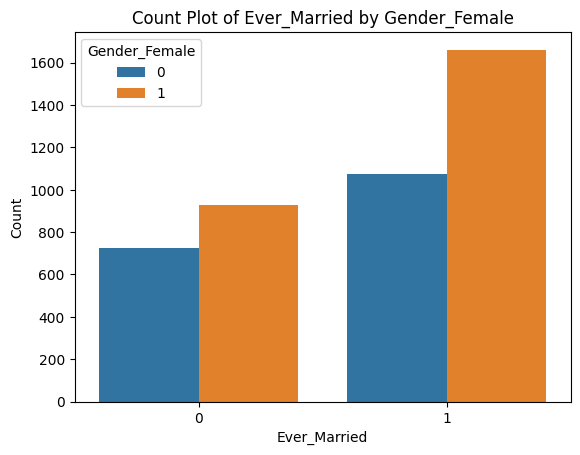

Pearson Correlation: 0.16782038022279516



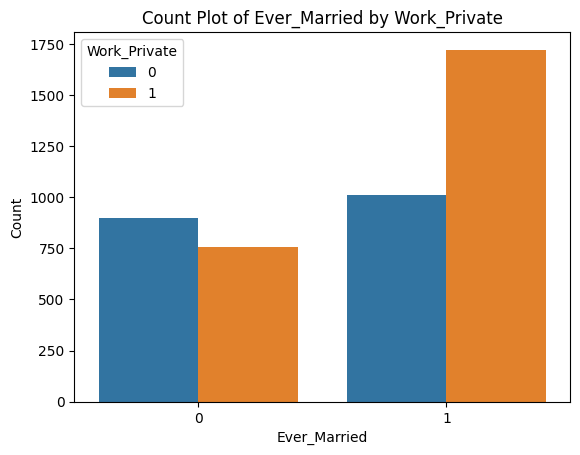

Pearson Correlation: 0.14765709051345205



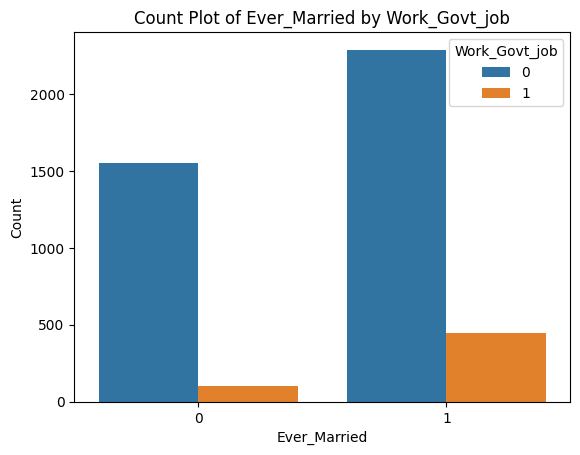

Pearson Correlation: 0.2001060419758045



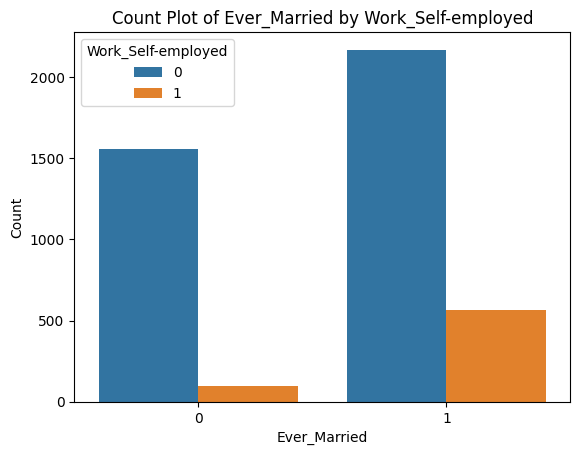

Pearson Correlation: -0.5472454593991949



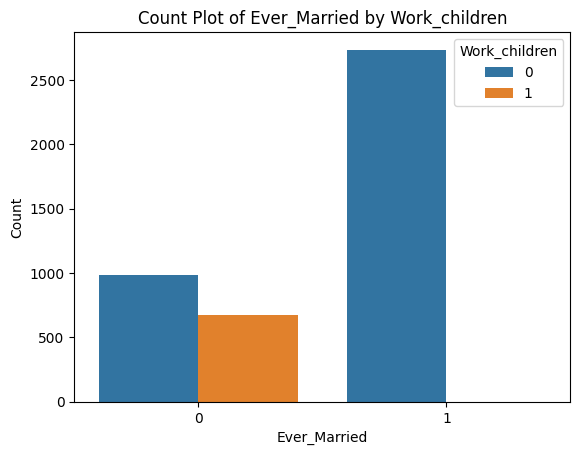

Pearson Correlation: -0.09119453583003594



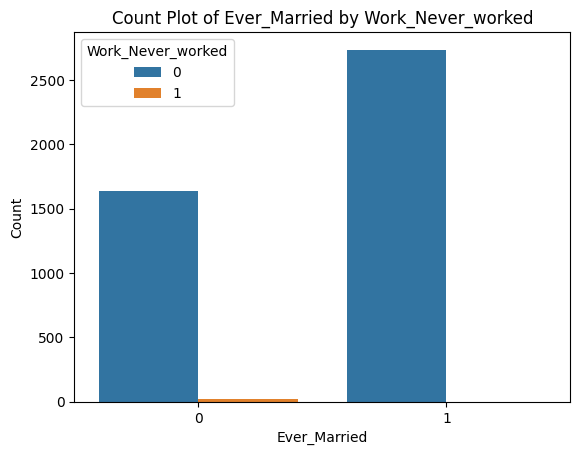

Pearson Correlation: 0.10896799253146872



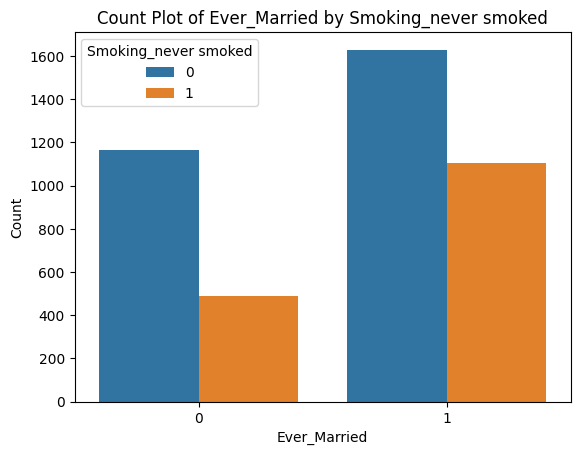

Pearson Correlation: -0.3418865909337501



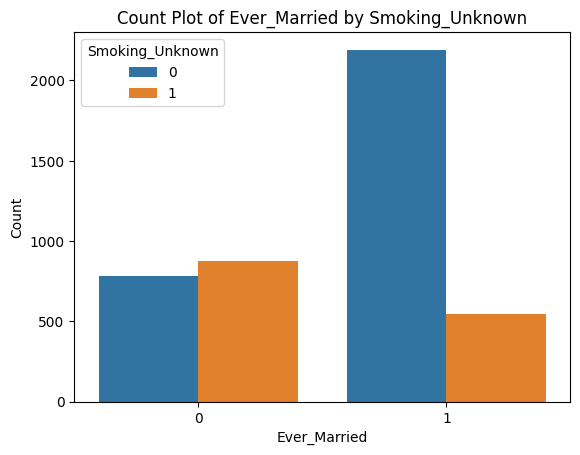

Pearson Correlation: 0.11849531858498331



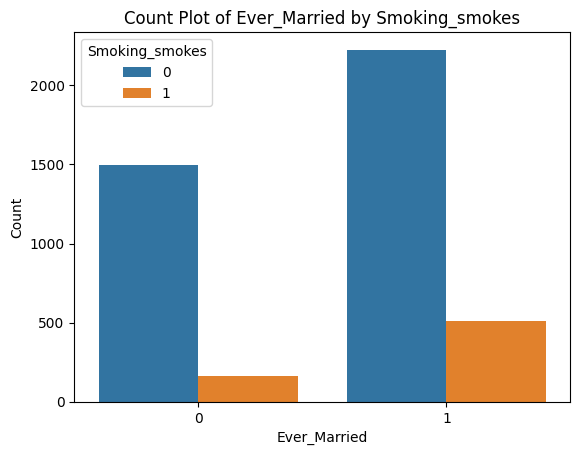

Pearson Correlation: 0.17634077868028383



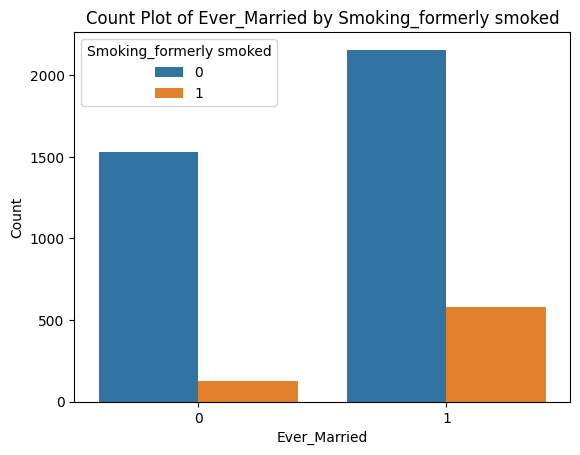

In [ ]:
# Store column titles in a list
column_titles_list = list(data.columns)

for i in column_titles_list:
  if i!= 'Ever_Married' and i!='id':

    correlation = data[i].corr(data['Ever_Married'])
    print(f'Pearson Correlation: {correlation}')
    print()
    if i in continuous_vars:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=data, x= i, hue='Ever_Married', fill=True, alpha=0.3)
        plt.title(f'Density Plot of {i} by Ever_Married')
        plt.xlabel(i)
        plt.ylabel('Density')
        plt.show()
    else:
       sns.countplot(x='Ever_Married', hue=i, data=data)
       plt.title('Count Plot of Ever_Married by '+ i)
       plt.xlabel('Ever_Married')
       plt.ylabel('Count')
       plt.legend(title=i)
       plt.show()


# **Descriptive** **Analysis**

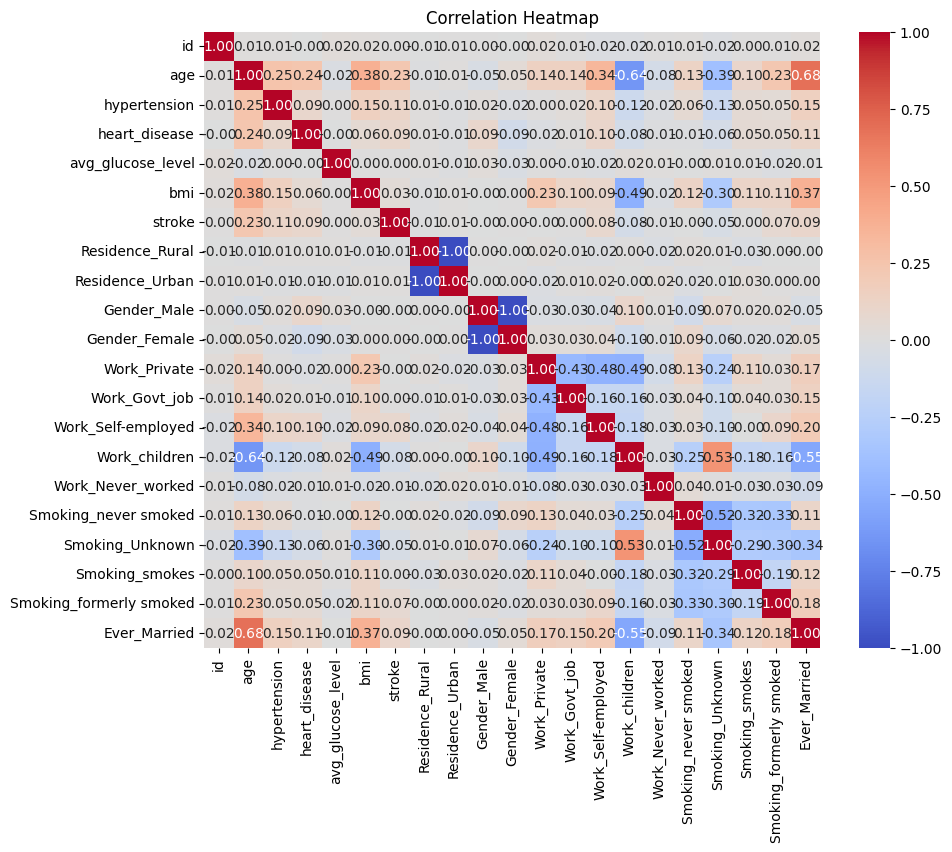

In [ ]:
correlation_matrix = data.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Correlation Heatmap')
plt.show()

A correlation heatmap is a visual representation of the correlation matrix that uses colors to indicate the strength and direction of correlations between variables.

#**Dimensionality Reduction**

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

df = pd.read_csv("/content/Cleaned-heart-stroke-data (2).csv")
data = df.copy()

X = df.drop(columns=['stroke', 'id'])
y = df['stroke']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA Transformation
pca = PCA(n_components=0.95)  # Retain 95% variance
X_pca = pca.fit_transform(X_scaled)

print(f"Original features: {X_scaled.shape[1]} -> PCA features: {X_pca.shape[1]}")



Original features: 19 -> PCA features: 13


#**Splitting Dataset for Training**

In [2]:

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)


X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, test_size=0.3, random_state=42)


#**Defining Models and Function for Evaluation Metrics and Model Training**

In [3]:

models = {
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "SVM": SVC(probability=True),
}

def evaluate_metrics(y_test, y_pred, y_prob):

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    logloss = log_loss(y_test, y_prob)
    cm = confusion_matrix(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)

    return acc, precision, recall, f1, logloss, cm, roc_auc

def train_evaluate(models, X_train, X_test, y_train, y_test, variation="Without Sampling"):
    results = []
    print(f"\nEvaluating models {variation}...\n")
    for name, model in models.items():
        print(f"Training {name}...")
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1]


        acc, precision, recall, f1, logloss, cm, roc_auc = evaluate_metrics(y_test, y_pred, y_prob)


        results.append({"Model": name, "Accuracy": acc, "Precision": precision, "Recall": recall, "F1-Score": f1, "Log Loss": logloss, "ROC AUC": roc_auc})


        print(f"{name} Results ({variation}):")
        print(f"Accuracy: {acc:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1-Score: {f1:.4f}")
        print(f"Log Loss: {logloss:.4f}")
        print(f"ROC AUC: {roc_auc:.4f}")
        print("\nClassification Report:")
        print(classification_report(y_test, y_pred))


        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f"{name} Confusion Matrix ({variation})")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()


        fpr, tpr, thresholds = roc_curve(y_test, y_prob)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='b', label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - {name} ({variation})')
        plt.legend(loc='lower right')
        plt.show()

    return pd.DataFrame(results)

#**Model Training on imbalanced data and results**


Evaluating models Without Sampling...

Training Random Forest...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

Random Forest Results (Without Sampling):
Accuracy: 0.9605
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000
Log Loss: 0.2623
ROC AUC: 0.7843

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1266
           1       0.00      0.00      0.00        52

    accuracy                           0.96      1318
   macro avg       0.48      0.50      0.49      1318
weighted avg       0.92      0.96      0.94      1318



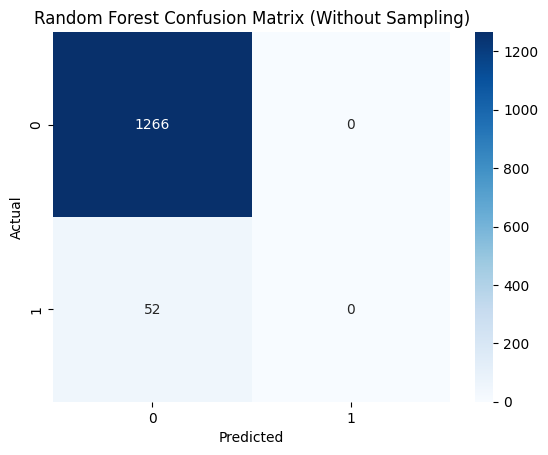

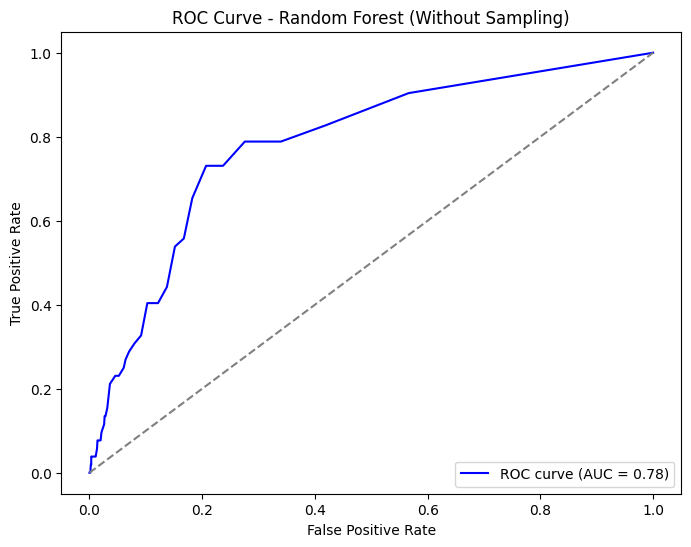

Training Decision Tree...
Decision Tree Results (Without Sampling):
Accuracy: 0.9287
Precision: 0.1111
Recall: 0.1154
F1-Score: 0.1132
Log Loss: 2.5706
ROC AUC: 0.5387

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1266
           1       0.11      0.12      0.11        52

    accuracy                           0.93      1318
   macro avg       0.54      0.54      0.54      1318
weighted avg       0.93      0.93      0.93      1318



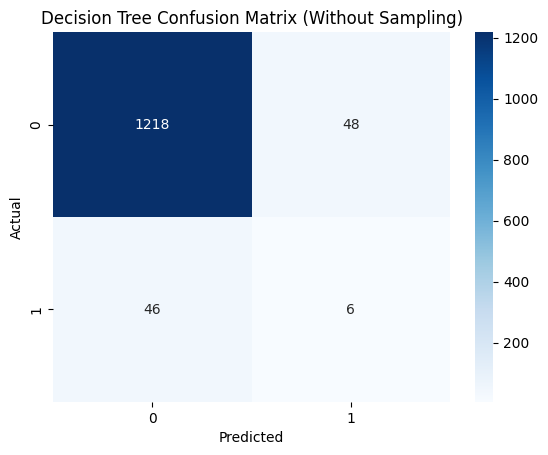

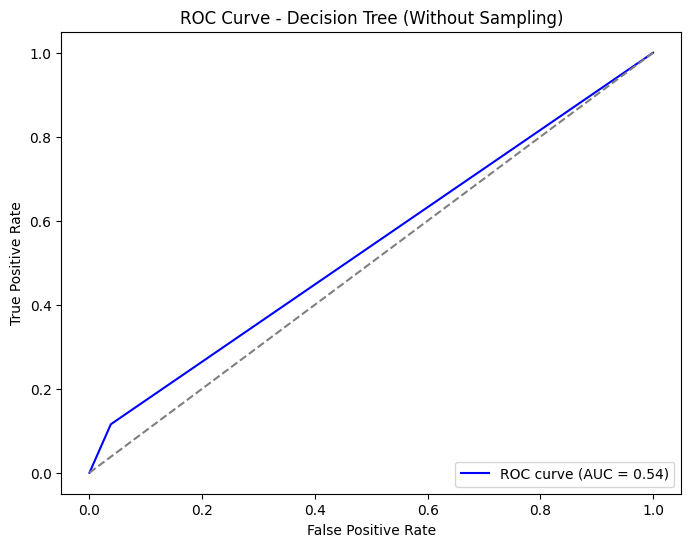

Training SVM...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

SVM Results (Without Sampling):
Accuracy: 0.9605
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000
Log Loss: 0.1637
ROC AUC: 0.6041

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1266
           1       0.00      0.00      0.00        52

    accuracy                           0.96      1318
   macro avg       0.48      0.50      0.49      1318
weighted avg       0.92      0.96      0.94      1318



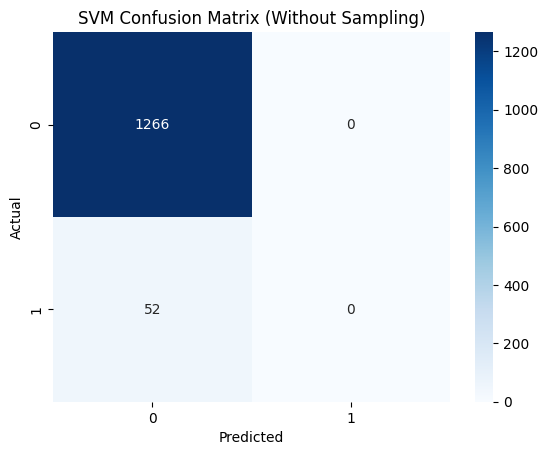

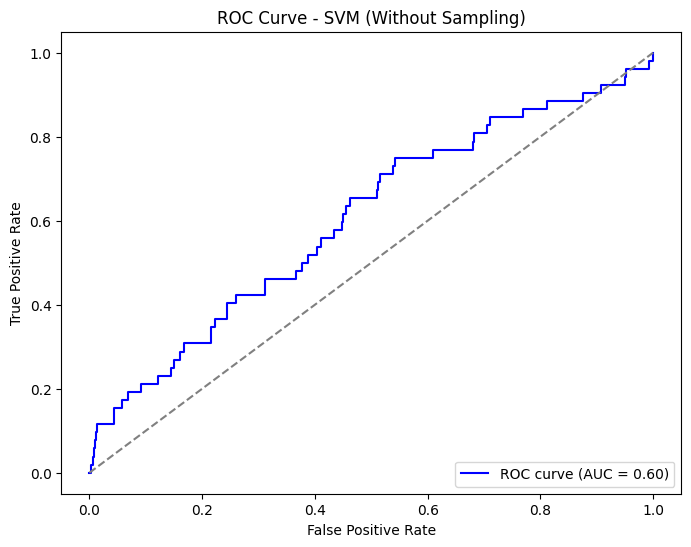

In [4]:
results_no_sampling = train_evaluate(models, X_train, X_test, y_train, y_test, variation="Without Sampling")


#**Balancing Data using different random states and their results**


Evaluating models With SMOTE (random_state=10)...

Training Random Forest...
Random Forest Results (With SMOTE (random_state=10)):
Accuracy: 0.9436
Precision: 0.9145
Recall: 0.9787
F1-Score: 0.9455
Log Loss: 0.2183
ROC AUC: 0.9845

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.91      0.94      1268
           1       0.91      0.98      0.95      1268

    accuracy                           0.94      2536
   macro avg       0.95      0.94      0.94      2536
weighted avg       0.95      0.94      0.94      2536



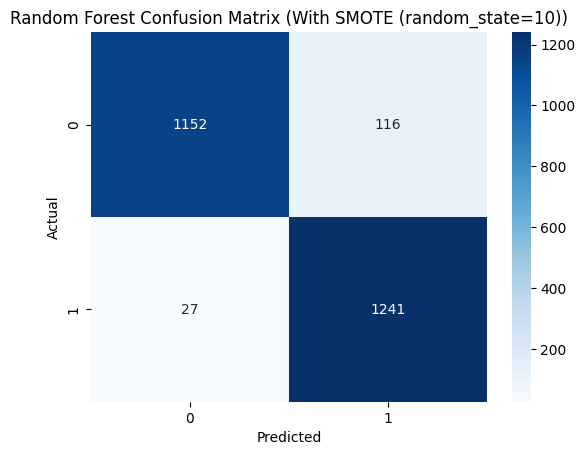

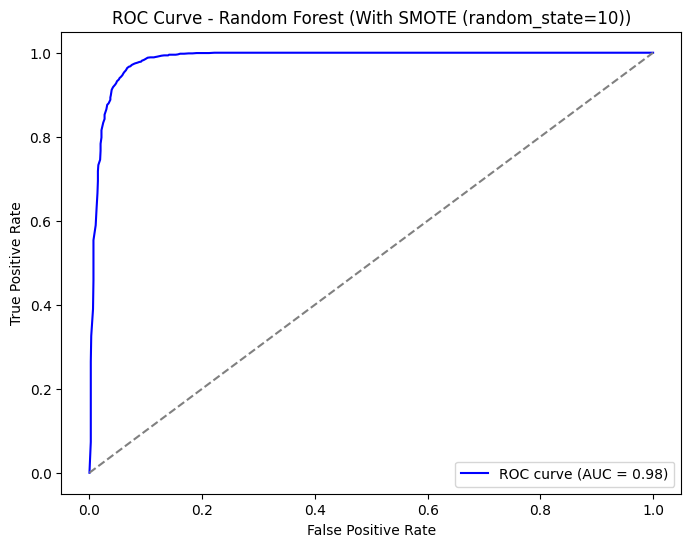

Training Decision Tree...
Decision Tree Results (With SMOTE (random_state=10)):
Accuracy: 0.8904
Precision: 0.8683
Recall: 0.9203
F1-Score: 0.8936
Log Loss: 3.9512
ROC AUC: 0.8904

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.86      0.89      1268
           1       0.87      0.92      0.89      1268

    accuracy                           0.89      2536
   macro avg       0.89      0.89      0.89      2536
weighted avg       0.89      0.89      0.89      2536



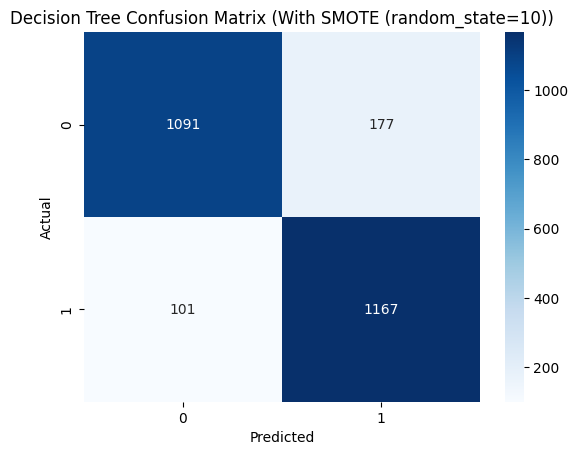

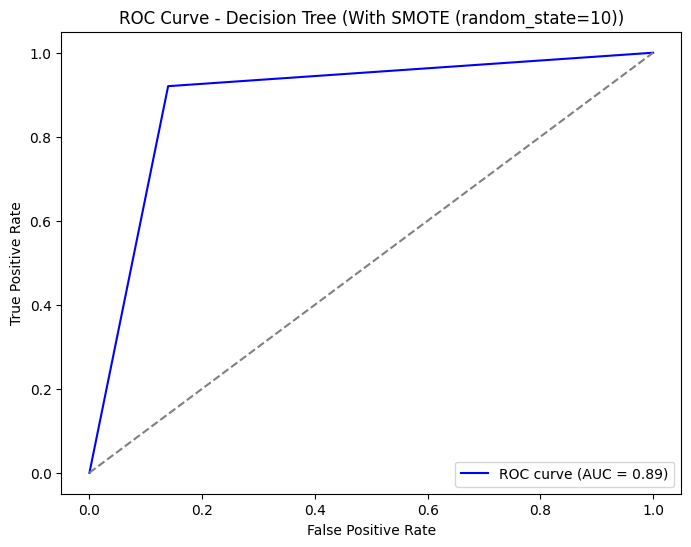

Training SVM...
SVM Results (With SMOTE (random_state=10)):
Accuracy: 0.8746
Precision: 0.8276
Recall: 0.9464
F1-Score: 0.8830
Log Loss: 0.2803
ROC AUC: 0.9487

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.80      0.86      1268
           1       0.83      0.95      0.88      1268

    accuracy                           0.87      2536
   macro avg       0.88      0.87      0.87      2536
weighted avg       0.88      0.87      0.87      2536



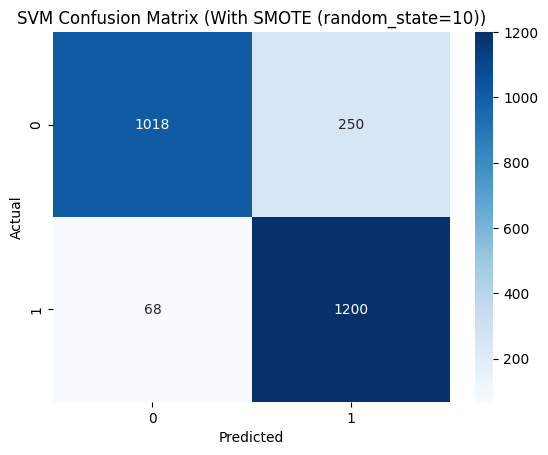

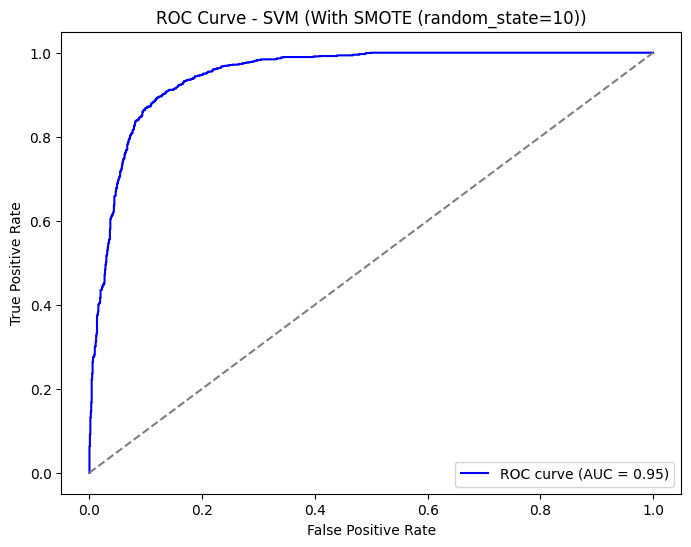


Evaluating models With SMOTE (random_state=42)...

Training Random Forest...
Random Forest Results (With SMOTE (random_state=42)):
Accuracy: 0.9562
Precision: 0.9358
Recall: 0.9795
F1-Score: 0.9572
Log Loss: 0.1558
ROC AUC: 0.9918

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.93      0.96      1270
           1       0.94      0.98      0.96      1266

    accuracy                           0.96      2536
   macro avg       0.96      0.96      0.96      2536
weighted avg       0.96      0.96      0.96      2536



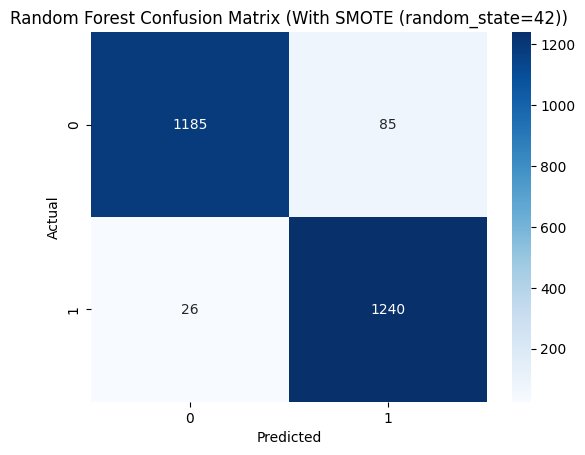

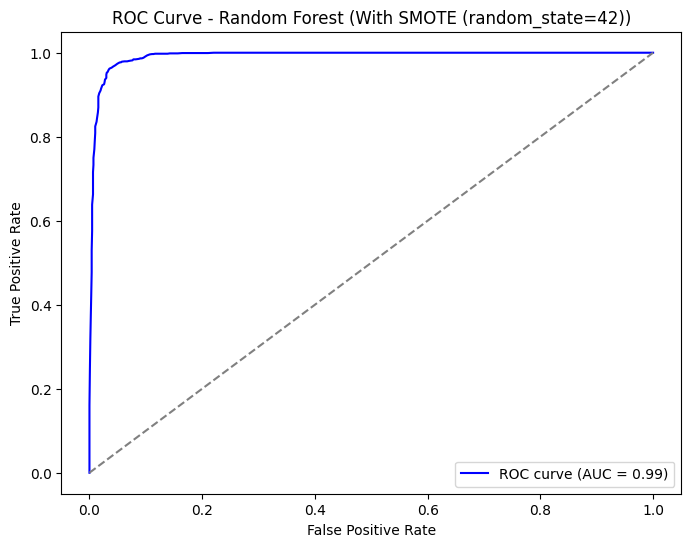

Training Decision Tree...
Decision Tree Results (With SMOTE (random_state=42)):
Accuracy: 0.9192
Precision: 0.9090
Recall: 0.9313
F1-Score: 0.9200
Log Loss: 2.9136
ROC AUC: 0.9192

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.91      0.92      1270
           1       0.91      0.93      0.92      1266

    accuracy                           0.92      2536
   macro avg       0.92      0.92      0.92      2536
weighted avg       0.92      0.92      0.92      2536



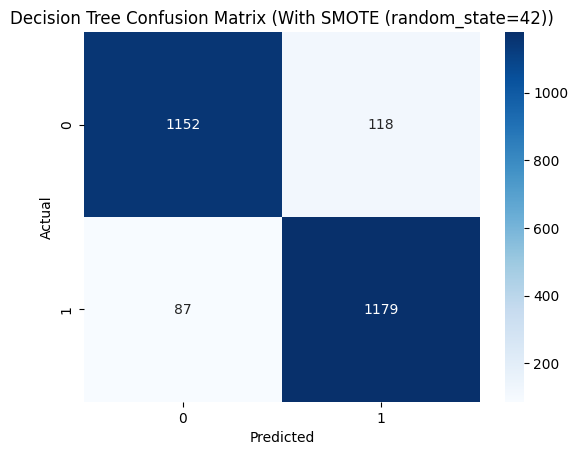

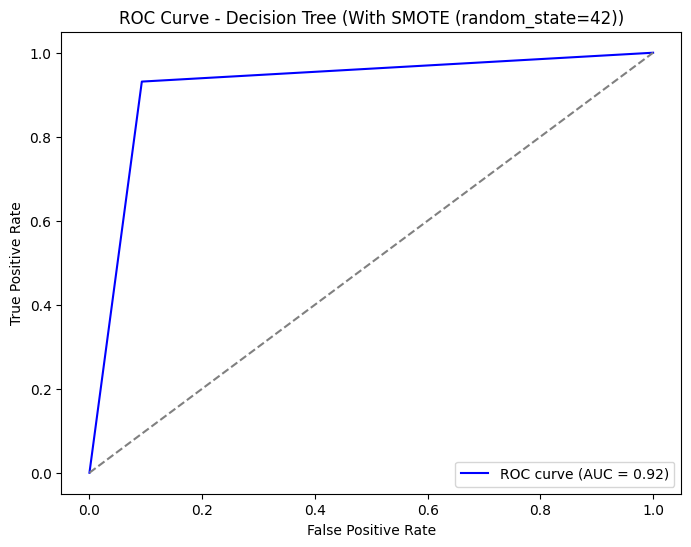

Training SVM...
SVM Results (With SMOTE (random_state=42)):
Accuracy: 0.8971
Precision: 0.8512
Recall: 0.9621
F1-Score: 0.9032
Log Loss: 0.2452
ROC AUC: 0.9615

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.83      0.89      1270
           1       0.85      0.96      0.90      1266

    accuracy                           0.90      2536
   macro avg       0.90      0.90      0.90      2536
weighted avg       0.90      0.90      0.90      2536



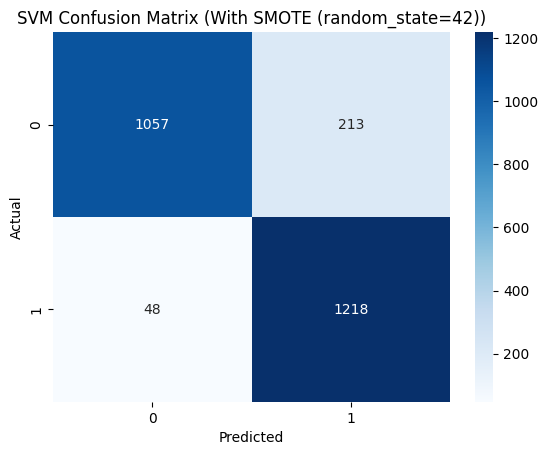

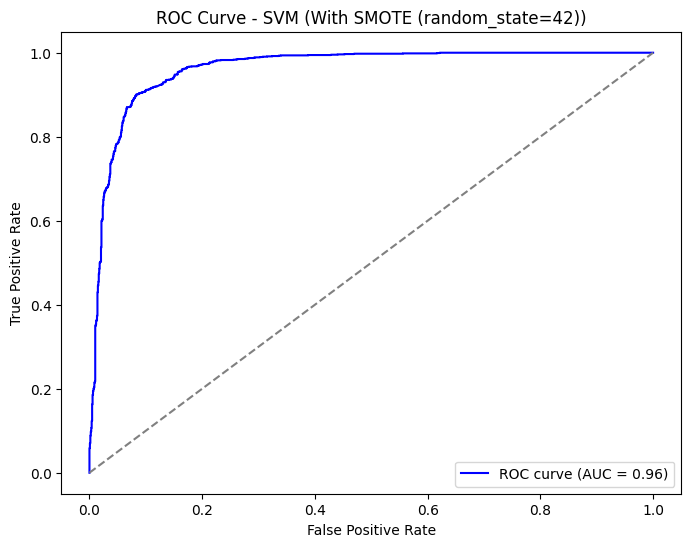

In [5]:

smote_10 = SMOTE(random_state=10)
X_balanced_10, y_balanced_10 = smote_10.fit_resample(X_scaled, y)


X_train_bal_10, X_test_bal_10, y_train_bal_10, y_test_bal_10 = train_test_split(X_balanced_10, y_balanced_10, test_size=0.3, random_state=10)


X_train_bal_10_pca = pca.transform(X_train_bal_10)
X_test_bal_10_pca = pca.transform(X_test_bal_10)

results_with_sampling_10 = train_evaluate(models, X_train_bal_10_pca, X_test_bal_10_pca, y_train_bal_10, y_test_bal_10, variation="With SMOTE (random_state=10)")







smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X_scaled, y)


X_train_bal, X_test_bal, y_train_bal, y_test_bal = train_test_split(X_balanced, y_balanced, test_size=0.3, random_state=42)

X_train_bal_pca = pca.transform(X_train_bal)
X_test_bal_pca = pca.transform(X_test_bal)

results_with_sampling_42 = train_evaluate(models, X_train_bal_pca, X_test_bal_pca, y_train_bal, y_test_bal, variation="With SMOTE (random_state=42)")


#**Comparing Overall Results**


Comparison of Results:

Without Sampling:
           Model  Accuracy  Precision    Recall  F1-Score  Log Loss   ROC AUC
0  Random Forest  0.960546   0.000000  0.000000  0.000000  0.262290  0.784261
1  Decision Tree  0.928680   0.111111  0.115385  0.113208  2.570640  0.538735
2            SVM  0.960546   0.000000  0.000000  0.000000  0.163715  0.604083

With SMOTE (random_state=10):
           Model  Accuracy  Precision    Recall  F1-Score  Log Loss   ROC AUC
0  Random Forest  0.943612   0.914517  0.978707  0.945524  0.218284  0.984478
1  Decision Tree  0.890379   0.868304  0.920347  0.893568  3.951158  0.890379
2            SVM  0.874606   0.827586  0.946372  0.883002  0.280259  0.948672

With SMOTE (random_state=42):
           Model  Accuracy  Precision    Recall  F1-Score  Log Loss   ROC AUC
0  Random Forest  0.956230   0.935849  0.979463  0.957159  0.155765  0.991750
1  Decision Tree  0.919164   0.909021  0.931280  0.920016  2.913623  0.919183
2            SVM  0.897082   0.851153

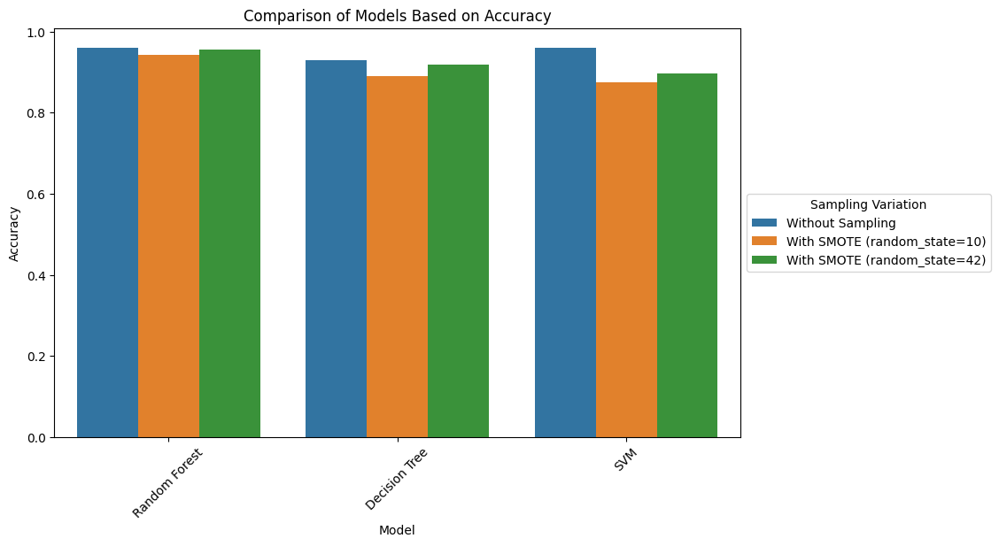

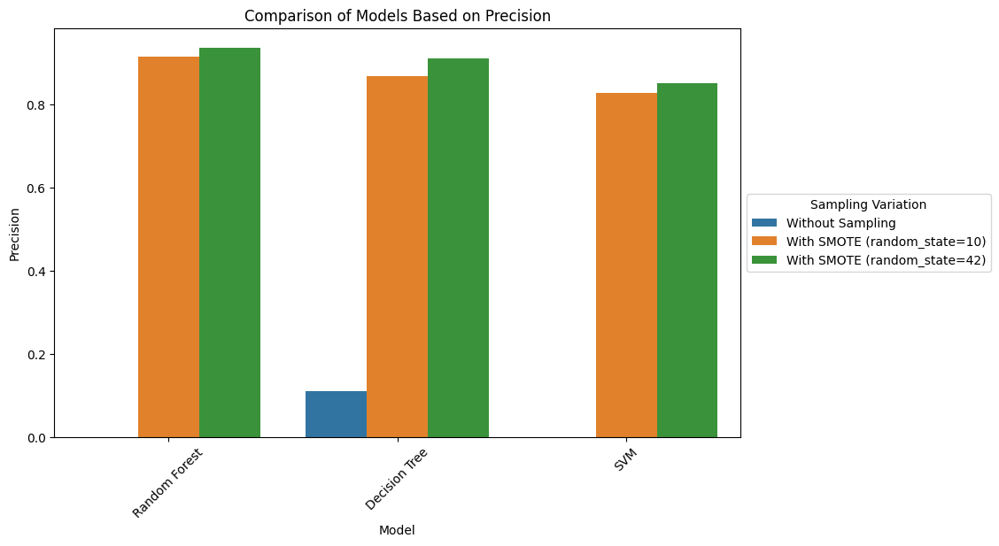

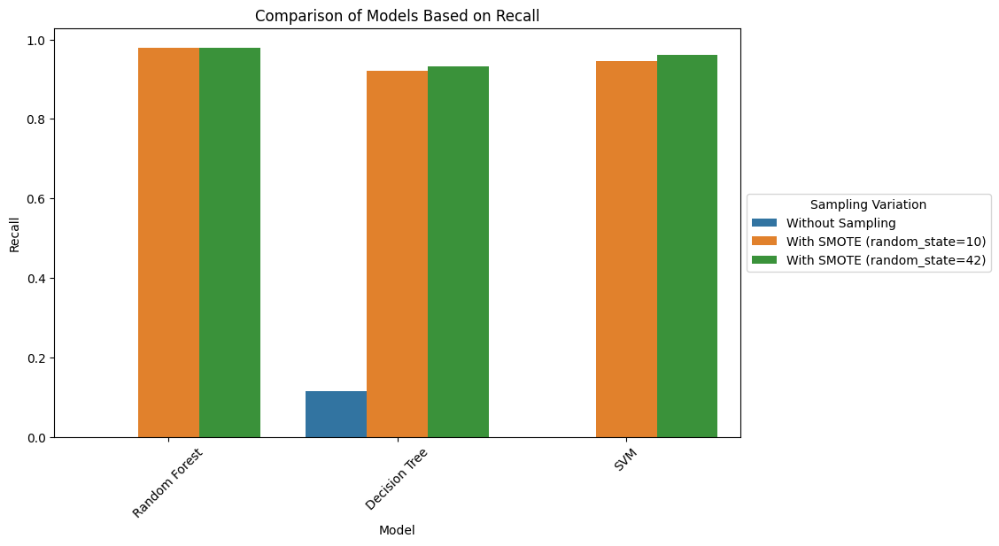

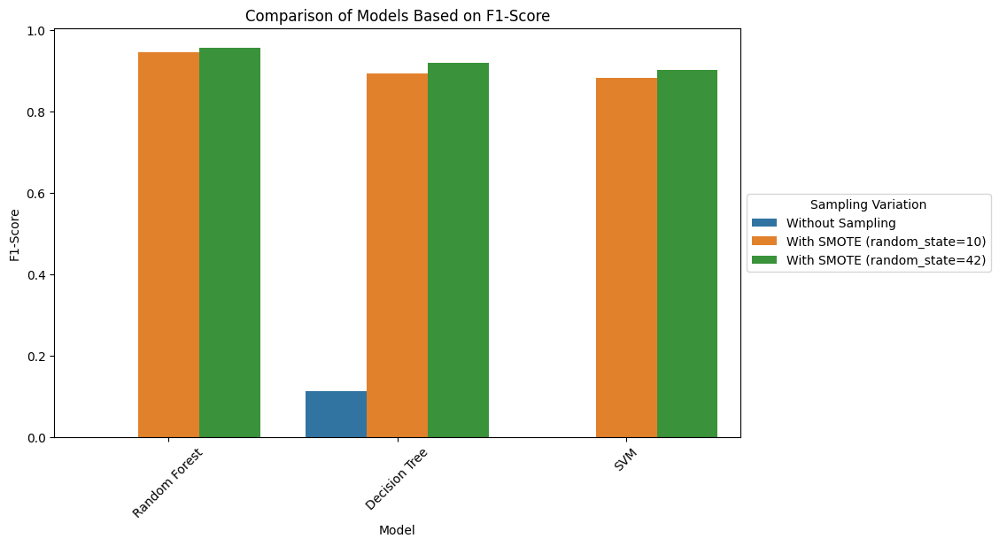

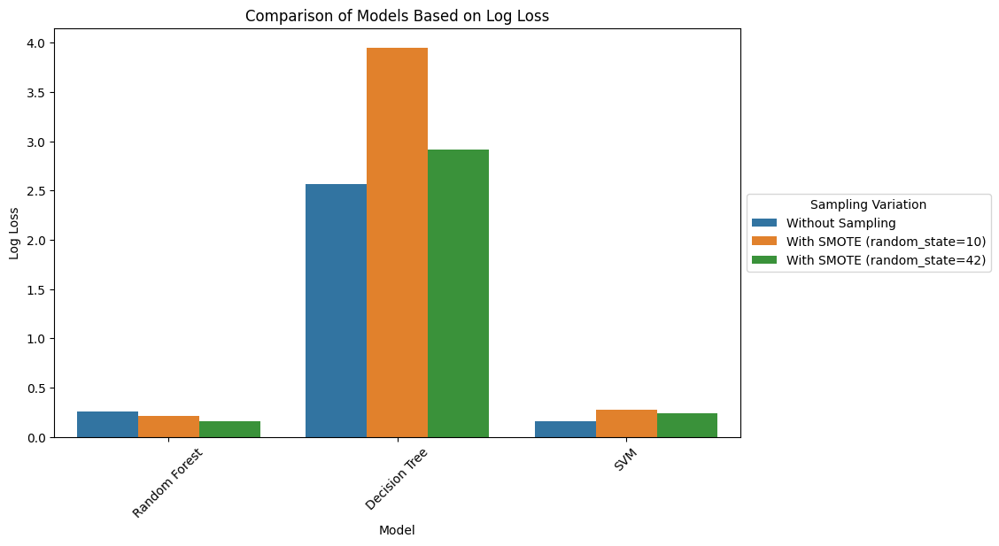

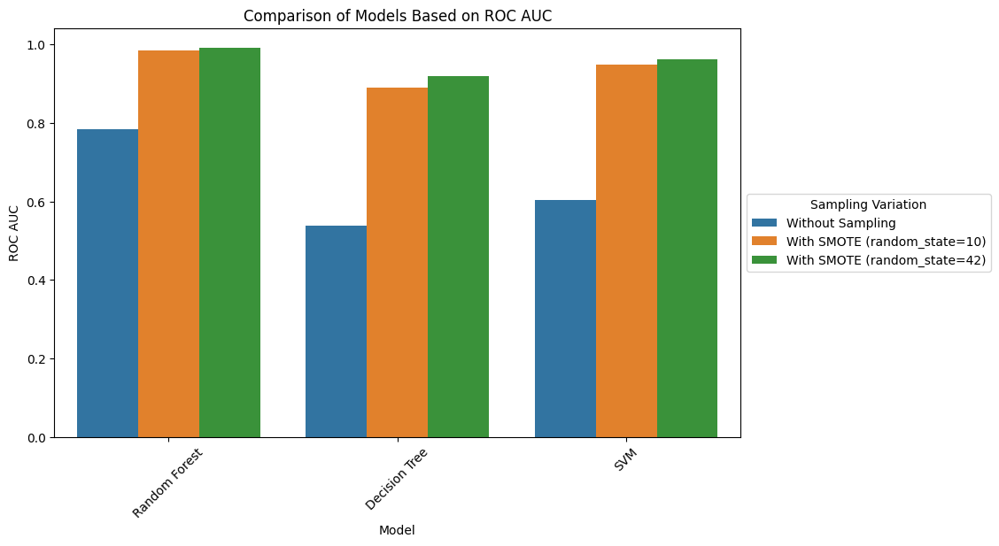

In [6]:
print("\nComparison of Results:")

print("\nWithout Sampling:")
print(results_no_sampling)

print("\nWith SMOTE (random_state=10):")
print(results_with_sampling_10)

print("\nWith SMOTE (random_state=42):")
print(results_with_sampling_42)



results_combined = pd.concat([results_no_sampling, results_with_sampling_10, results_with_sampling_42], keys=["Without Sampling", "With SMOTE (random_state=10)", "With SMOTE (random_state=42)"])

results_combined = results_combined.reset_index()

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Log Loss', 'ROC AUC']

for metric in metrics:
    plt.figure(figsize=(10, 6))
    sns.barplot(x="Model", y=metric, hue="level_0", data=results_combined)
    plt.title(f'Comparison of Models Based on {metric}')
    plt.xlabel('Model')
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.legend(title='Sampling Variation', loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()